# Setting

## libraries

In [171]:
import os
import numpy as np
import scipy as sp
import scipy.special
import scipy.stats as stats
import pandas as pd
import pickle
import csv
import shutil
import time
import warnings
import nilearn as ni
from nilearn import datasets, surface, plotting, input_data
from nilearn.image import math_img, threshold_img, smooth_img
from nilearn.plotting import cm as nip_cm


import nibabel as nib
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap, Normalize
from matplotlib.patches import Patch
from matplotlib.cm import ScalarMappable
from scipy.stats import pearsonr, zscore, spearmanr
from scipy.spatial.distance import euclidean
from scipy.spatial import distance
from scipy import linalg, optimize
import matplotlib.colorbar as colorbar

import plotly.io as pio

import enigmatoolbox
from enigmatoolbox.utils.parcellation import surface_to_parcel, parcel_to_surface

from brainsmash.mapgen.base import Base
from brainsmash.mapgen.eval import base_fit
from brainsmash.mapgen.stats import nonparp, pairwise_r


import plotly.graph_objects as go




from neuromaps.datasets import fetch_annotation
import matplotlib.ticker as ticker

import matplotlib.pyplot as plt
from matplotlib import ticker
import textwrap


import matplotlib.pyplot as plt

# # Define FSL directories
os.environ["FSLDIR"] = "/usr/share/fsl/5.0"
os.environ["FSLOUTPUTTYPE"] = "NIFTI_GZ"
os.environ["FSLTCLSH"] = "/usr/bin/tclsh"
os.environ["FSLWISH"] = "/usr/bin/wish"
os.environ["FSLMULTIFILEQUIT"] = "True"
os.environ["LD_LIBRARY_PATH"] = "/usr/share/fsl/5.0:/usr/lib/fsl/5.0"

# Fix deprecated NumPy aliases
np.float = float
np.int = int




## notes:
#### thr_sc = 0.1 
#### thr_fc = 0.2 
#### without limbic

## Run functions 

In [172]:
%run ~/neuroenergeticslab_notebooks/Mutual_Information/Functions.ipynb

## IMPORTANT: select the data (main or external) AND including/excluding the limbic nework

In [173]:
# ================================================
# 1. session selection (main or external dataset):
# ================================================
session = "AUF" # "AUF" #or m1 or m2
DIR = f'/RAID1/jupytertmp/mi/{session}/'
nrois = 360


# ================================================
# 2. select if you want to include limbic or not:
# ================================================

# including limbic:
# limb_ind = []
# LIMB = 'with'

# excluding limbic:
limb_ind = np.array([88, 90, 92, 93, 110, 118, 120, 122, 131, 135, 165, 166, 172, 268, 270, 272, 273, 290, 298, 300, 302, 311, 314, 315, 346, 352])-1
LIMB = 'without'

# ================================================
# 3. Parameter assignments:
# ================================================
sub = os.listdir(DIR)
sub = sorted([int(s.split('-')[1]) for s in sub if s.startswith('sub-') and s.split('-')[1].isdigit()])

if session == "ZU":
    
    sub.remove(14)


if session == 'AUF':
    sub = [3,7,12,14,17,20,23,25,26,28,29,30,31,32,33,35,36,37,38]
    
sub_size = len(sub)
nrois_rem = nrois - len(limb_ind) 


net_label = pd.read_csv(f'/RAID1/jupytertmp/mi/input_data/mmp2yeo7nw_mapping.csv')
net_label = net_label.drop(limb_ind,axis=0)
net_names = pd.unique(net_label['yeo_7_nw']) 
net_label.reset_index(drop=True, inplace=True)
network_to_number = {network: i + 1 for i, network in enumerate(net_label['yeo_7_nw'].unique())}
net_label['network_number'] = net_label['yeo_7_nw'].map(network_to_number)

## network colors assignment:
color = [(139, 19, 140),(1,131, 182),(51, 116, 32),
         (222, 75, 82),(226, 55, 255),(239, 156, 60), (255, 254, 211)]
net_color  = [(r/255, g/255, b/255 , 1)  for r,g,b in color]
customPalette = sns.set_palette(sns.color_palette(net_color))

xtik = ['Vis','Som','Dors','Def', 'Sal' , 'Cont', 'Limbic']
net_names = ['Vis', 'SomMot' ,'DorsAttn' ,'Default' ,'SalVentAttn', 'Cont', 'Limbic' ]
net_num = net_label["network_number"]
new_net_num = np.tile(net_num.transpose(), (nrois_rem, 1)) 
num_net = len(net_names) 


# ================================================
# 4. Parcellation setting:
# ================================================
mmp = nib.load(f'/RAID1/jupytertmp/mi/data/MMP_in_MNI_corr_3mm.nii.gz').get_fdata()
v11 , v22 , v33  = mmp.shape
nvox2 = v11 * v22 * v33
mmp_re = mmp.reshape((nvox2, 1),order='F')
regions = np.unique(mmp_re)[1:]

regions_rem = regions.copy()
regions_rem = np.delete(regions_rem , limb_ind)



# ================================================
# 4. figure's properties:
# ================================================
FONT = 18
COLOR = "#8DD084" #"#97A8C0" #"#8DD084"
IC_PET_COLf = '#70DEB6'
IC_PET_COLe = '#1FC488'
organg = [255/255,164/255,0/255]
GRAY = "#7F7F7F"
deg_color = "#97A8C0"
IC_color = "#8DD084"

approximate_colors = [
    "#341C54",
    "#3E2166",
    "#482677",  # Dark Purple
    "#44357F",
    "#404387",  # Purple-Blue
    "#33638D",  # Blue
    "#2A788E",  # Blue-Green
    "#1F9E89",  # Greenish-Blue
    "#35B779",  # Green
    "#6DCD59",  # Lime Green
    "#B4DE2C",  # Yellow-Green
    "#D9E329",
    "#EBE527",
    
  
    "#FDE725"   # Yellow
]
approximate_cmap = LinearSegmentedColormap.from_list("approximate_colormap", approximate_colors, N=256)
CMAP_IC = approximate_cmap

cool_cmap = plt.get_cmap('cool')
#cool_cmap = cm.get_cmap('cool')
cool_colors = cool_cmap(np.linspace(0.15, 0.95, 256))  
CMAP_DC = LinearSegmentedColormap.from_list("adjusted_cool", cool_colors)



## color maps/ colors

In [174]:

approximate_colors = [
    "#341C54",
    "#3E2166",
    "#482677",  # Dark Purple
    "#44357F",
    "#404387",  # Purple-Blue
    "#33638D",  # Blue
    "#2A788E",  # Blue-Green
    "#1F9E89",  # Greenish-Blue
    "#35B779",  # Green
    "#6DCD59",  # Lime Green
    "#B4DE2C",  # Yellow-Green
    "#D9E329",
    "#EBE527",
    
  
    "#FDE725"   # Yellow
]
approximate_cmap = LinearSegmentedColormap.from_list("approximate_colormap", approximate_colors, N=256)
CMAP_IC = approximate_cmap


import matplotlib.pyplot as plt

# Now this works:
cool_cmap = plt.get_cmap('cool')
#cool_cmap = cm.get_cmap('cool')
cool_colors = cool_cmap(np.linspace(0.15, 0.95, 256))  
CMAP_DC = LinearSegmentedColormap.from_list("adjusted_cool", cool_colors)




network_colors = [(139, 19, 140), (1, 131, 182), (51, 116, 32), (222, 75, 82), (226, 55, 255), (239, 156, 60), (255, 254, 211)]
network_colors = [(r / 255, g / 255, b / 255) for (r, g, b) in network_colors]

network_colors = ['#9A199A', '#45B7F0','#58B73B','#DE4B52','#E237FF','#F29A36','#FEFFD3']
lighter_colors = [sns.light_palette(color, n_colors=100, input="hex")[50] for color in network_colors]
#lighter_colors2 = [(*sns.color_palette([color])[0], 0.01) for color in lighter_colors]  # Adding 50% opacity

lighter_colors2 = ['#C788C7' , '#C0EBFF' , '#BEE6B2' , '#F2BABD', '#F6C2FF','#F7C58D']
network_order_original = ['Vis', 'SomMot', 'DorsAttn', 'Default', 'SalVentAttn', 'Cont']


network_color_map = dict(zip(network_order_original, network_colors))
lighter_color_map = dict(zip(network_order_original, lighter_colors))



import matplotlib.colors as mcolors

def matplotlib_to_plotly(cmap, n=256):
    """Convert a Matplotlib colormap to a Plotly-friendly colorscale."""
    return [
        [i / (n - 1), mcolors.rgb2hex(cmap(i / (n - 1))[:3])]
        for i in range(n)
    ]


# Copmutations

## Functional and structural connectivity

In [175]:

file_path = f'/RAID1/jupytertmp/mi/data/matrices_data_{session}_{LIMB}_limbic.pkl'
print(file_path)
#select one of the following sections (save or load)
#--------------------------------------------------------------------------------------------
#-------------- calculate and save functional connectivity and other inputs ----------------
#--------------------------------------------------------------------------------------------

# data_input = Functional_conn(DIR, sub, limb_ind, nrois)   
    
# with open(file_path, 'wb') as file:
#     pickle.dump(data_input, file, protocol=pickle.HIGHEST_PROTOCOL)
    

#read the saved data:
with open(file_path, 'rb') as file:
    data_input = pickle.load(file)
    
    
    
num_voxels = data_input['num_voxels']
MIconn_allsub = data_input['MIconn_allsub']
Pearconn_allsub = data_input['Pearconn_allsub']
edata_medianallsub = data_input['edata_medianallsub']

if session == "AUF":
    SCconn_allsub = structural_conn(DIR, sub, nrois)
else:
    SCconn_allsub = np.ones_like(MIconn_allsub)

        
edata_medianallsub_rem = edata_medianallsub


/RAID1/jupytertmp/mi/data/matrices_data_AUF_without_limbic.pkl


## calculate  IC (all, btw and within network) , deg, ...


In [176]:


data_avg_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_wSC_{session}_{LIMB}_limb.csv'
data_sub_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_wSC_{session}_{LIMB}_limb.pkl'
data_avg_pr_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_wSC_pr_{session}_{LIMB}_limb.csv'
data_sub_pr_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_wSC_pr_{session}_{LIMB}_limb.pkl'


# data_avg_pr_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_woSC_pr_{session}_{LIMB}_limb.csv'
# data_sub_pr_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_woSC_pr_{session}_{LIMB}_limb.pkl'
# data_avg_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_woSC_{session}_{LIMB}_limb.csv'
# data_sub_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_woSC_{session}_{LIMB}_limb.pkl'




#--------------------------------------------------------------------------------------------
#-------------- calculate and save IC  and other inputs ----------------
#--------------------------------------------------------------------------------------------
scmask = 1
edata_medianallsub_rem = edata_medianallsub
nrois_rem = nrois - len(limb_ind) 
thr_sc = 0.1
sub_size = MIconn_allsub.shape[2]

if session == "AUF":
 
    scmask = 1
else:
    scmask = 0

#scmask = 0

MIconn_allsub[MIconn_allsub < 0.01] = 0
Conn_Mat = MIconn_allsub
thr_FC = 1

# Conn_Mat = Pearconn_allsub
# thr_FC = 0.1
#SCconn_allsub = np.ones(Pearconn_allsub.shape)#***with subcortical******


# [data_avg, data_single_sub] = IC_calculation(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr_FC, sub_size, scmask, nrois_rem)
# DATA_avg = pd.concat([data_avg , net_label], axis =1)


# DATA_avg.to_csv(data_avg_path, index=False)
# with open(data_sub_path, 'wb') as file:
#     pickle.dump(data_single_sub, file, protocol=pickle.HIGHEST_PROTOCOL)


DATA_avg =   pd.read_csv(data_avg_path)
with open(data_sub_path, 'rb') as file:
    data_single_sub = pickle.load(file)



ICallsub_w = data_single_sub['ICallsub_w']
ICallsub_b = data_single_sub['ICallsub_b']
degallsub_w = data_single_sub['degallsub_w']
degallsub_b = data_single_sub['degallsub_b']
AvgMIallsub = data_single_sub['AvgMIallsub']




#--------------------------------------------------------------------------------------------
#-------------- data for DC ----------------
#--------------------------------------------------------------------------------------------

#DC without SC mask:
#SCconn_allsub = np.ones_like(Pearconn_allsub)
scmask = 1
thr_sc = 0.1
sub_size = MIconn_allsub.shape[2]
nrois_rem = nrois - len(limb_ind) 

#DC with SC mask:
SCconn_allsub = structural_conn(DIR, sub, nrois)
# thr_sc = 0.1
# scmask = 0

#DC with Pearson:
thr_FC = 0.2 
Conn_Mat = Pearconn_allsub
Conn_Mat[Conn_Mat < 0] = 0
#Conn_Mat = np.abs(Conn_Mat)

#DC with MI:
# thr_FC = 1
# Conn_Mat = MIconn_allsub
# Conn_Mat[Conn_Mat < 0.001] = 0


# [data_avg_pr, data_single_sub_pr] = IC_calculation(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr_FC, sub_size, scmask, nrois_rem)
# DATA_avg_pr = pd.concat([data_avg_pr , net_label], axis =1)

# DATA_avg_pr.to_csv(data_avg_pr_path, index=False)
# with open(data_sub_pr_path, 'wb') as file:
#     pickle.dump(data_single_sub_pr, file, protocol=pickle.HIGHEST_PROTOCOL)


DATA_avg_pr   = pd.read_csv(data_avg_pr_path)

with open(data_sub_pr_path, 'rb') as file:
    data_single_sub_pr = pickle.load(file)

ICallsub_w_pr = data_single_sub_pr['ICallsub_w']
ICallsub_b_pr = data_single_sub_pr['ICallsub_b']
degallsub_w_pr = data_single_sub_pr['degallsub_w']
degallsub_b_pr = data_single_sub_pr['degallsub_b']
AvgMIallsub_pr = data_single_sub_pr['AvgMIallsub']    






## Correlation values

In [177]:
from scipy.stats import pearsonr
#limb_ind = net_label[net_label['yeo_7_nw'].str.contains(net_names[6])].index
#DATA_avg = DATA_avg.drop(limb_ind , axis = 0)

sub_size = len(sub)
print(sub_size)
corr_IC_E_allsub = np.zeros((sub_size))
corr_btw_E_allsub = np.zeros((sub_size))
corr_eig_E_allsub = np.zeros((sub_size))
corr_deg_w_E_allsub = np.zeros((sub_size))
corr_IC_E_net_allsub = np.zeros((len(sub), len(net_names)))
p_IC_E_allsub = np.zeros((sub_size))
p_deg_w_E_allsub = np.zeros((sub_size))
p_btw_E_allsub = np.zeros((sub_size, 1))
p_eig_E_allsub = np.zeros((sub_size, 1))
p_IC_E_net_allsub = np.zeros((len(sub), len(net_names)))

for j in range(sub_size):
                             
    degallsub_w_z = zscore(degallsub_w[:, j] , nan_policy='omit')
    corr_IC_E_allsub[j], p_IC_E_allsub[j] = pcor(ICallsub_w[:, j], edata_medianallsub_rem[:, j])
    corr_deg_w_E_allsub[j], p_deg_w_E_allsub[j] = pcor(degallsub_w_z, edata_medianallsub_rem[:, j])
     
    
corr_IC_w_E, p_IC_w_E = pcor(DATA_avg.ICallsub_w_avg, DATA_avg.pet_avg)
corr_IC_b_E, p_IC_b_E = pcor(DATA_avg.ICallsub_b_avg, DATA_avg.pet_avg)
corr_IC_w_deg, p_IC_w_deg = pcor(DATA_avg.ICallsub_w_avg, DATA_avg.degallsub_w_avg)
corr_IC_b_deg, p_IC_b_deg = pcor(DATA_avg.ICallsub_b_avg, DATA_avg.degallsub_b_avg)
corr_deg_w_E, p_deg_w_E = pcor(zscore(DATA_avg.degallsub_w_avg , nan_policy='omit'), DATA_avg.pet_avg)




19


# Figures

## Fig 2a

In [170]:

plot_node_surf(DATA_avg, MIconn_allsub, 'ICallsub_w_avg', CMAP_IC,0.1, limb_ind)

Original number of regions: 360
Removed limb regions: 26
Remaining plotted regions: 334


<Figure size 600x400 with 0 Axes>

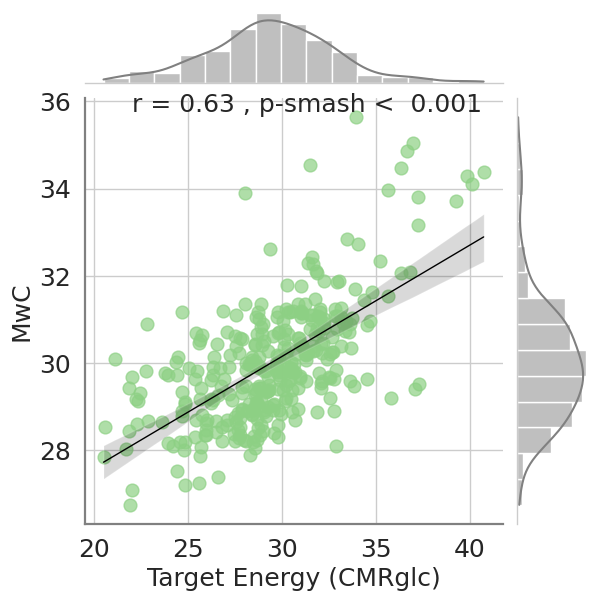

<Figure size 1500x1500 with 0 Axes>

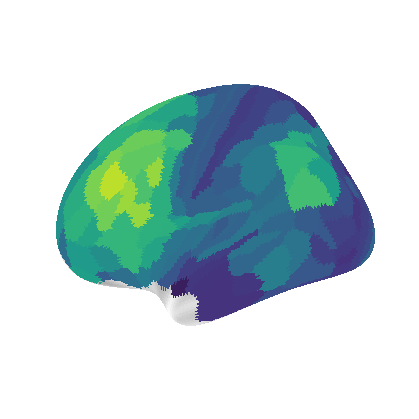

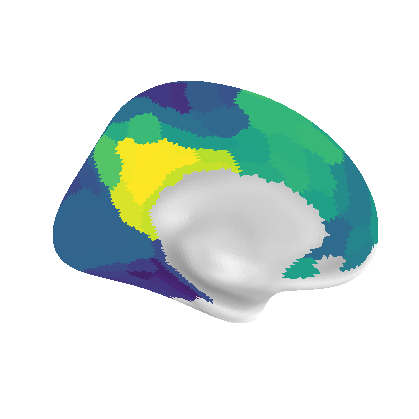

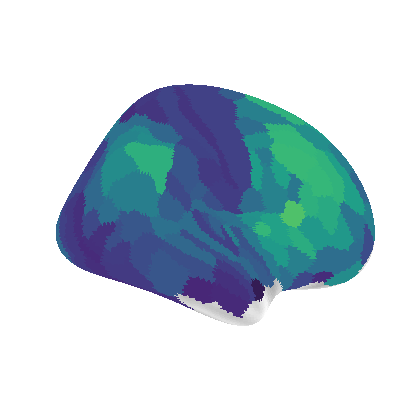

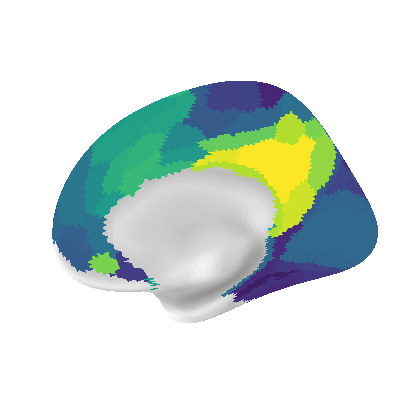

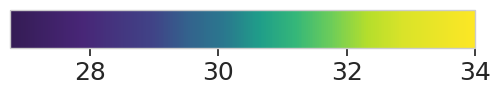

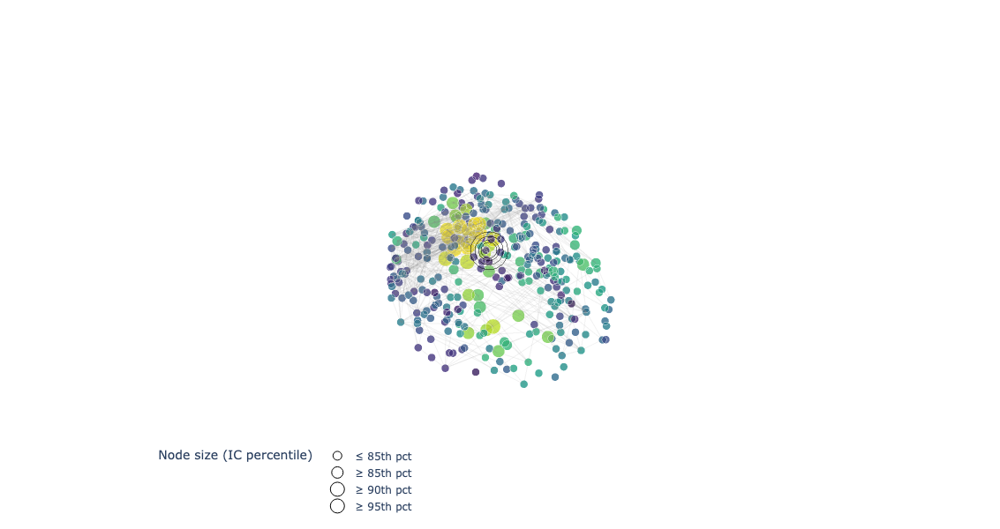

<Figure size 640x480 with 0 Axes>

In [131]:
#--------------------------------------------------------------------------------------------
#----------------------  spatial autocorrelation (SAC) -----------------------------------
#-------------------------------------------------------------------------------------------- 



# data_input = Functional_conn(DIR, sub, limb_ind, nrois)

# num_voxels = data_input['num_voxels']
# MIconn_allsub = data_input['MIconn_allsub']
# Pearconn_allsub = data_input['Pearconn_allsub']
# edata_medianallsub = data_input['edata_medianallsub']

# if session == "AUF":
#     SCconn_allsub = structural_conn(DIR, sub, nrois)
# else:
#     SCconn_allsub = np.ones_like(MIconn_allsub)

        
# edata_medianallsub_rem = edata_medianallsub



# thr_sc = 0.2
# sub_size = MIconn_allsub.shape[2]

# if session == "AUF":

#     scmask = 1
# else:
#     scmask = 0

# scmask = 1
# MIconn_allsub[MIconn_allsub < 0.01] = 0
# thr_FC = 1
# Conn_Mat = MIconn_allsub
# [data_avg_sa, data_single_sub_sa] = IC_calculation(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr_FC, sub_size, scmask, nrois)
# DATA_avg_sa = pd.concat([data_avg_sa , net_label], axis =1)
## uncomment from here:
# niter = 10
# #test_stat_IC ,surrogate_brainmap_corrs_IC, sa_corrected_p_value_IC, spatially_naive_p_value_IC = Spatial_AC(DATA_avg , "IC", LIMB,niter)
# sac1 = '#0199DD' 
# sac2 = '#8CCF83'
# sac3 = '#FEAD01'


# fig, ax = plt.subplots(figsize=(3, 7))

# plt.grid(True)
# g = sns.kdeplot(surrogate_brainmap_corrs, color= "#E0E0E0", ax=ax, fill= True, linewidth=2.5 )

# ax.axvline(corr_IC_w_E, 0, 0.9, color= COLOR, linestyle='dashed', lw=3)

    
# ax.set_xticks(np.arange(-1, 1.1, 0.5))
# ax.set_ylim(0, 2)
# ax.set_xlim(-0.8, 0.8)
# #ax.text(0.5, -0.1, "Pearson correlation\nwith IE map", ha='center', va='top', transform=ax.transAxes)
# spine_width = 1.6  
# spine_color = 'gray'
# for spine in ax.spines.values():
#     spine.set_linewidth(spine_width)
#     spine.set_color(spine_color)


# plt.tick_params(axis='both', which='major', labelsize= FONT)      
# plt.xlabel('Correlation', fontsize = FONT)
# plt.ylabel('Density', fontsize = FONT)
# plt.savefig(f'Figures/CMRglc_IC_hist.png', dpi=300, bbox_inches='tight')
# plt.show()


# lower_bound = np.percentile(surrogate_brainmap_corrs, 5)
# upper_bound = np.percentile(surrogate_brainmap_corrs, 95)
# print(f"95% CI of null distribution: [{lower_bound:.2f}, {upper_bound:.2f}]")


#--------------------------------------------------------------------------------------------
#------------------ scatter IC_avg , CMRglc_avg / group analysis ----------------------------
#--------------------------------------------------------------------------------------------
COLOR = IC_color
plt.figure(figsize=(6,4))
g = sns.jointplot(data=DATA_avg, x='pet_avg', y='ICallsub_w_avg', kind="reg", color=COLOR,
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': 'black', 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':COLOR, 'edgecolors':COLOR}  ) 


p_IC_w_E_smash = p_IC_w_E

if p_IC_w_E_smash < 0.0001:
     title = "r = {:.2f} , p-smash <  {:.3f}".format(float(corr_IC_w_E), float(0.001))
else:
    title = "r = {:.2f} , p-smash = {:.3f}".format(float(corr_IC_w_E), float(p_IC_w_E_smash))
    
#g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", $Pval_{smash}$ < 0.001", fontsize=FONT, va='baseline', y=0.8)
g.fig.suptitle(title, fontsize=FONT, va='baseline', y=0.8)
g.set_axis_labels('Target Energy', 'MwC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel('Target Energy (CMRglc)', fontsize = FONT)
plt.ylabel('MwC', fontsize = FONT)

ax =  g.ax_joint  
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_edgecolor("gray")
plt.savefig(f'Figures/CMRglc_IC_scatter.png', dpi=300, bbox_inches='tight')
plt.show()

#--------------------------------------------------------------------------------------------
#------------------ Box plot individual correlation between IC and E  -----------------------
#--------------------------------------------------------------------------------------------
# sa_corrected_p_sub_IC = np.zeros((sub_size, 1))
# for j in range(sub_size):
   

#     data = pd.DataFrame({"x":ICallsub_w[:, j], "y":edata_medianallsub_rem[:, j]})
#     data.fillna(0, inplace=True)
                             
#     _ ,_, sa_corrected_p_sub_IC[j], _ = Spatial_AC(data , "sub", LIMB,niter)
   



# data = pd.DataFrame({'r': corr_IC_E_allsub, 'p': p_IC_E_allsub})
# fig, ax = plt.subplots(figsize=(3, 7))
# plt.grid(True)
# violin = sns.violinplot(data=data, y='r', ax=ax, color = COLOR)
# violin.collections[0].set_facecolor('none')
# sns.stripplot(data=data[data['p'] < 0.05], y='r', color=COLOR , size = 8, ax=ax)
# sns.stripplot(data=data[data['p'] >= 0.05], y='r', color='red' , size = 8, ax=ax)
# ax.set_ylabel('Correlation MwC and target\'s energy', fontsize = FONT)
# ax.set_ylim([-0.15,0.72])
# plt.tick_params(axis='both', which='major', labelsize= FONT)  

# spine_width = 1.6  
# spine_color = 'gray'
# for spine in ax.spines.values():
#     spine.set_linewidth(spine_width)
#     spine.set_color(spine_color)

# plt.savefig(f'Figures/CMRglc_IC_box.png', dpi=300, bbox_inches='tight')   
# plt.show()




#--------------------------------------------------------------------------------------------
#--------------------------- IC map on the brain surface  -----------------------------------
#--------------------------------------------------------------------------------------------

#CMAP_IC = 'turbo'

IC = np.array(DATA_avg.ICallsub_w_avg).reshape(-1, 1)
IC_allrois = np.zeros((360,1))
ind = np.arange(360)
mask = np.ones(ind.shape , dtype = bool)
mask[limb_ind] = False
ind = ind[mask]
IC_allrois[ind] = np.abs(IC)


fig = plt.figure(figsize=(5, 5),dpi=300)

fsaverage = datasets.fetch_surf_fsaverage()

V_min = IC.min()
V_max = IC.max()
V_max = 34

col_fsa = parcel_to_surface(IC_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                         
                           hemi='left', vmin= V_min, vmax = V_max, view='lateral',
                           bg_map=fsaverage['sulc_left'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP_IC,colorbar=False)
plt.savefig(f'Figures/IC_surf_l_lateral.png', dpi=300, bbox_inches='tight') 
plt.show()

col_fsa = parcel_to_surface(IC_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                       
                           hemi='left', vmin= V_min, vmax = V_max, view='medial',
                           bg_map=fsaverage['sulc_left'], bg_on_data = False,
                           darkness=0.5,cmap=CMAP_IC,colorbar=False)
plt.savefig(f'Figures/IC_surf_l_medial.png', dpi=300, bbox_inches='tight') 
plt.show()


col_fsa = parcel_to_surface(IC_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_right'], roi_map = col_fsa[int(col_fsa.shape[0]/2):],
                           
                           hemi='right', vmin= V_min, vmax = V_max, view='lateral',
                           bg_map=fsaverage['sulc_right'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP_IC,colorbar=False)
plt.savefig(f'Figures/IC_surf_r_lateral.png', dpi=300, bbox_inches='tight') 
plt.show()

col_fsa = parcel_to_surface(IC_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_right'], roi_map = col_fsa[int(col_fsa.shape[0]/2):],
                         
                           hemi='right', vmin= V_min, vmax = V_max, view='medial',
                           bg_map=fsaverage['sulc_right'], bg_on_data = False,
                           darkness=0.5,cmap=CMAP_IC,colorbar=False)
plt.savefig(f'Figures/IC_surf_r_medial.png', dpi=300, bbox_inches='tight')
plt.show()

cmap = plt.get_cmap(CMAP_IC)
norm = plt.Normalize(vmin=V_min, vmax=V_max)

fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

cb = colorbar.ColorbarBase(ax, cmap=cmap, norm=norm, orientation='horizontal')

cb.ax.tick_params(labelsize=18)

plt.savefig('Figures/IC_colorbar_horizontal.png', dpi=300, bbox_inches='tight')
plt.show()
#--------------------------------------------------------------------------------------------
#----------------------  regions with strongest IC values -----------------------------------
#-------------------------------------------------------------------------------------------- 
plot_node_surf(DATA_avg, MIconn_allsub, 'ICallsub_w_avg', CMAP_IC,0.1, limb_ind)  





## Fig 2b

<Figure size 600x400 with 0 Axes>

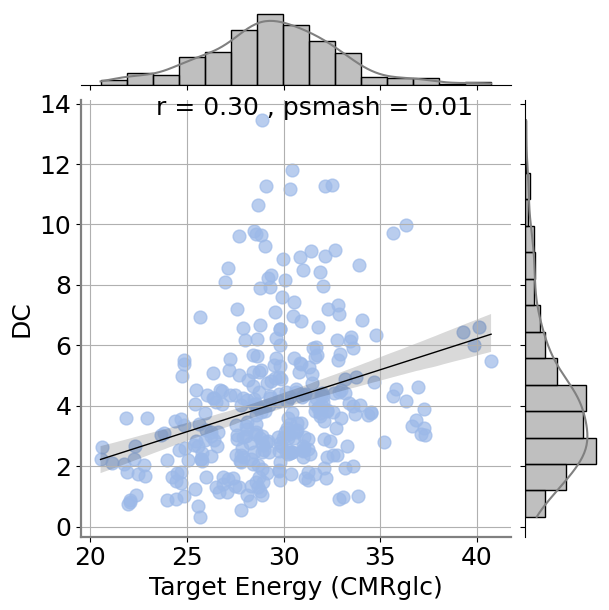

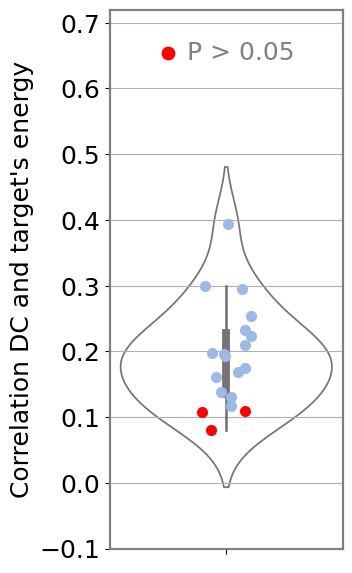

<Figure size 1500x1500 with 0 Axes>

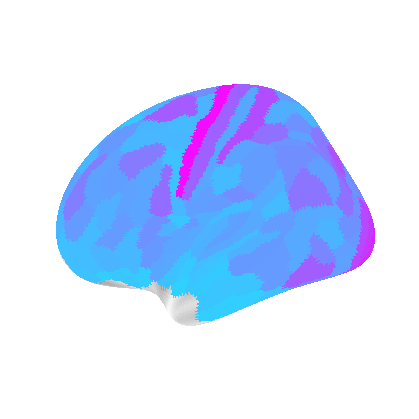

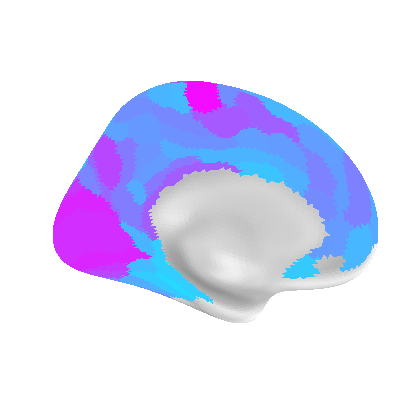

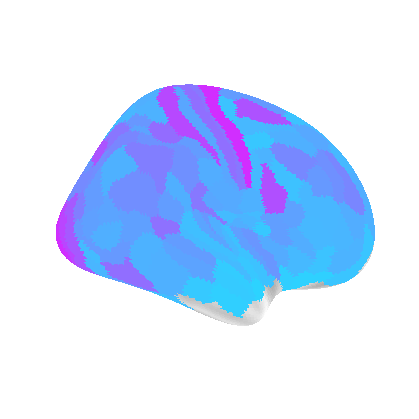

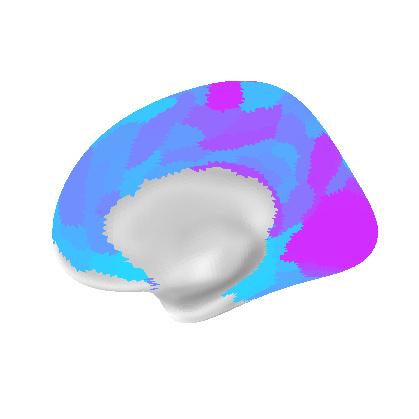

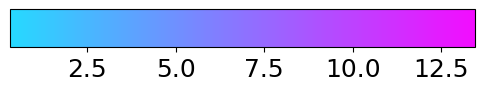

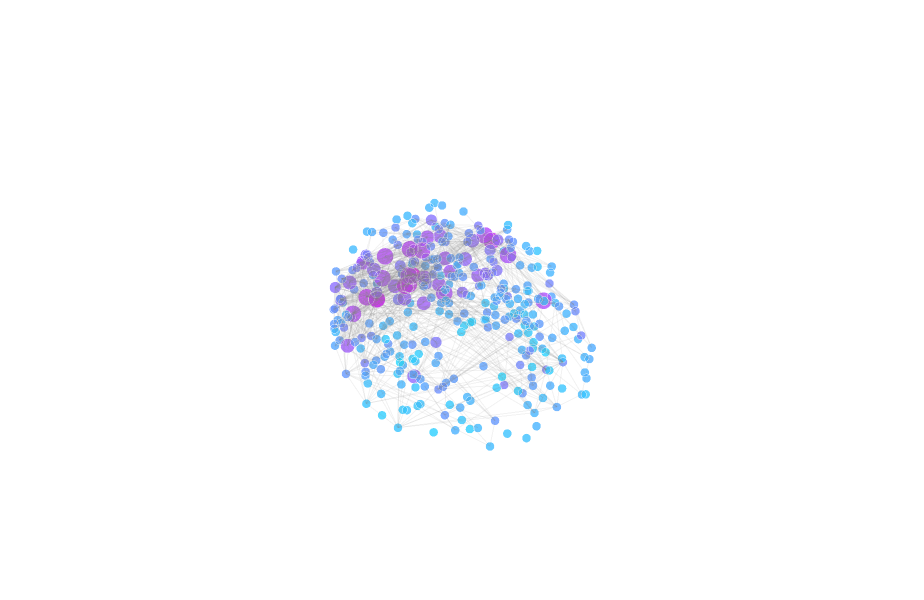

<Figure size 640x480 with 0 Axes>

In [21]:
deg_color = '#9CB9E8'
COLOR = deg_color
     



# eig_cenallsub_pr = data_single_sub_pr['eig_cenallsub']
# btw_cenallsub_pr = data_single_sub_pr['btw_cenallsub']


corr_deg_w_E_allsub = np.zeros((sub_size))
p_deg_w_E_allsub = np.zeros((sub_size))

for j in range(sub_size):

    corr_deg_w_E_allsub[j], p_deg_w_E_allsub[j] = pcor(degallsub_w_pr[:,j], edata_medianallsub_rem[:, j])     

corr_deg_w_E, p_deg_w_E = pcor(DATA_avg_pr.degallsub_w_avg , DATA_avg_pr.pet_avg)


#--------------------------------------------------------------------------------------------
#----------------------  spatial autocorrelation (SAC) -----------------------------------
#-------------------------------------------------------------------------------------------- 



# data_input = Functional_conn(DIR, sub, limb_ind, nrois)

# num_voxels = data_input['num_voxels']
# MIconn_allsub = data_input['MIconn_allsub']
# Pearconn_allsub = data_input['Pearconn_allsub']
# edata_medianallsub = data_input['edata_medianallsub']

# if session == "AUF":
#     SCconn_allsub = structural_conn(DIR, sub, nrois)
# else:
#     SCconn_allsub = np.ones_like(MIconn_allsub)

        
# edata_medianallsub_rem = edata_medianallsub



# thr_sc = 0.2
# sub_size = MIconn_allsub.shape[2]

# if session == "AUF":

#     scmask = 1
# else:
#     scmask = 0

# scmask = 1
# MIconn_allsub[MIconn_allsub < 0.01] = 0
# thr_FC = 1
# Conn_Mat = MIconn_allsub
# [data_avg_sa, data_single_sub_sa] = IC_calculation(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr_FC, sub_size, scmask, nrois)
# DATA_avg_sa = pd.concat([data_avg_sa , net_label], axis =1)


#### uncomment from here:
# niter = 1000
# #test_stat_DC ,surrogate_brainmap_corrs_DC, sa_corrected_p_value_DC, spatially_naive_p_value_DC = Spatial_AC(DATA_avg_pr , "deg_w", LIMB,niter)
# sac1 = '#0199DD' 
# sac2 = '#8CCF83'
# sac3 = '#FEAD01'



# fig, ax = plt.subplots(figsize=(3, 7))

# plt.grid(True)
# g = sns.kdeplot(surrogate_brainmap_corrs_DC, color= "#E0E0E0", ax=ax, fill= True, linewidth=2.5 )

# ax.axvline(corr_deg_w_E, 0, 0.9, color= COLOR, linestyle='dashed', lw=3)

    
# ax.set_xticks(np.arange(-1, 1.1, 0.5))
# ax.set_ylim(0, 2)
# ax.set_xlim(-0.8, 0.8)
# #ax.text(0.5, -0.1, "Pearson correlation\nwith IE map", ha='center', va='top', transform=ax.transAxes)
# spine_width = 1.6  
# spine_color = 'gray'
# for spine in ax.spines.values():
#     spine.set_linewidth(spine_width)
#     spine.set_color(spine_color)


# plt.tick_params(axis='both', which='major', labelsize= FONT)      
# plt.xlabel('Correlation', fontsize = FONT)
# plt.ylabel('Density', fontsize = FONT)
# plt.savefig(f'Figures/CMRglc_DC_hist.png', dpi=300, bbox_inches='tight')
# plt.show()


# lower_bound = np.percentile(surrogate_brainmap_corrs_DC, 5)
# upper_bound = np.percentile(surrogate_brainmap_corrs_DC, 95)
# print(f"95% CI of null distribution: [{lower_bound:.2f}, {upper_bound:.2f}]")
sa_corrected_p_value_DC = 0.01

#--------------------------------------------------------------------------------------------
#------------------ scatter deg_avg , CMRglc_avg / group analysis ----------------------------
#--------------------------------------------------------------------------------------------

plt.figure(figsize=(6,4))
g = sns.jointplot(data=DATA_avg_pr, x='pet_avg', y='degallsub_w_avg', kind="reg", color=COLOR,
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': 'black', 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':COLOR, 'edgecolors':COLOR}  ) 



p_deg_w_E_smash =  sa_corrected_p_value_DC

if p_deg_w_E_smash < 0.0001:
     title = "r = {:.2f} , psmash<  {:.3f}".format(float(corr_deg_w_E), float(0.001))
else:
    title = "r = {:.2f} , psmash = {:.2f}".format(float(corr_deg_w_E), float(p_deg_w_E_smash))


#title = "corr = {:.2f} , pvalue = {:.0e}".format(float(corr_deg_w_E), float(p_deg_w_E))
g.fig.suptitle(title, fontsize=FONT, va='baseline', y=0.8)
g.set_axis_labels('Target Energy', 'Degree', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel('Target Energy (CMRglc)', fontsize = FONT)
plt.ylabel('DC', fontsize = FONT)

ax =  g.ax_joint  
spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)   
    
plt.savefig(f'Figures/CMRglc_DC_scatter.png', dpi=300, bbox_inches='tight')   
plt.show()

# #--------------------------------------------------------------------------------------------
# #------------------ Box plot individual correlation between IC and E  -----------------------
# #--------------------------------------------------------------------------------------------

data = pd.DataFrame({'corr': corr_deg_w_E_allsub, 'pval': p_deg_w_E_allsub})
fig, ax = plt.subplots(figsize=(3, 7))
plt.grid(True)
violin = sns.violinplot(data=data, y='corr', ax=ax, color = COLOR)
violin.collections[0].set_facecolor('none')
sns.stripplot(data=data[data['pval'] < 0.05], y='corr', color=COLOR , size = 8, ax=ax)
sns.stripplot(data=data[data['pval'] >= 0.05], y='corr', color='red' , size = 8, ax=ax)
ax.set_ylabel('Correlation DC and target\'s energy', fontsize = FONT)
ax.set_ylim([-0.1,0.72])
plt.tick_params(axis='both', which='major', labelsize= FONT)  

spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)

    
x_position = 0.25      
y_position = 0.92    
ax.scatter(x_position, y_position, s=80, color='red', transform=ax.transAxes)
ax.text(x_position + 0.08, y_position, 'p > 0.05',
        color='gray', fontsize=FONT, va='center', ha='left', transform=ax.transAxes)


plt.savefig(f'Figures/CMRglc_DC_box.png', dpi=300, bbox_inches='tight')       
plt.show()




#--------------------------------------------------------------------------------------------
#--------------------------- Degree map on the brain surface  -----------------------------------
#--------------------------------------------------------------------------------------------



deg = np.array(DATA_avg_pr.degallsub_w_avg).reshape(-1, 1)
deg_allrois = np.zeros((360,1))
ind = np.arange(360)
mask = np.ones(ind.shape , dtype = bool)
mask[limb_ind] = False
ind = ind[mask]
deg_allrois[ind] = np.abs(deg)


fig = plt.figure(figsize=(5, 5),dpi=300)

fsaverage = datasets.fetch_surf_fsaverage()

V_min = deg.min()
V_max = deg.max()
#V_max = 34

col_fsa = parcel_to_surface(deg_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                       
                           hemi='left', vmin= V_min, vmax = V_max, view='lateral',
                           bg_map=fsaverage['sulc_left'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP_DC,colorbar=False)
plt.savefig(f'Figures/DC_surf_l_lateral.png', dpi=300, bbox_inches='tight')   
plt.show()

col_fsa = parcel_to_surface(deg_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                    
                           hemi='left', vmin= V_min, vmax = V_max, view='medial',
                           bg_map=fsaverage['sulc_left'], bg_on_data = False,
                           darkness=0.5,cmap=CMAP_DC,colorbar=False)
plt.savefig(f'Figures/DC_surf_l_medial.png', dpi=300, bbox_inches='tight')
plt.show()


col_fsa = parcel_to_surface(deg_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_right'], roi_map = col_fsa[int(col_fsa.shape[0]/2):],
                           
                           hemi='right', vmin= V_min, vmax = V_max, view='lateral',
                           bg_map=fsaverage['sulc_right'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP_DC,colorbar=False)
plt.savefig(f'Figures/DC_surf_r_lateral.png', dpi=300, bbox_inches='tight')
plt.show()

col_fsa = parcel_to_surface(deg_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_right'], roi_map = col_fsa[int(col_fsa.shape[0]/2):],
                           
                           hemi='right', vmin= V_min, vmax = V_max, view='medial',
                           bg_map=fsaverage['sulc_right'], bg_on_data = False,
                           darkness=0.5,cmap=CMAP_DC,colorbar=False)
plt.savefig(f'Figures/DC_surf_r_medial.png', dpi=300, bbox_inches='tight')
plt.show()

cmap = plt.get_cmap(CMAP_DC)
norm = plt.Normalize(vmin=V_min, vmax=V_max)

fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

cb = colorbar.ColorbarBase(ax, cmap=cmap, norm=norm, orientation='horizontal')

cb.ax.tick_params(labelsize=18)

plt.savefig('Figures/DC_colorbar_horizontal.png', dpi=300, bbox_inches='tight')
plt.show()


#--------------------------------------------------------------------------------------------
#----------------------  regions with strongest IC values -----------------------------------
#-------------------------------------------------------------------------------------------- 
plot_node_surf(DATA_avg_pr, Pearconn_allsub, 'degallsub_w_avg', CMAP_DC,0.3, limb_ind)  


#--------------------------------------------------------------------------------------------
#----------------------  regions with strongest degree values -----------------------------------
#-------------------------------------------------------------------------------------------- 

# n_shades = 3 
# color_shades1 = ['#00915C','#519470','#748078']
# color_shades2 = ['#E6AC00', '#b29049', '#7b7469']
# color_shades3 = ['#0062F5', '#568FE3',  '#8395AD']

# data = pd.read_csv("HCP-MMP1_UniqueRegionList.csv")

# roi_info = data[['cortex']]

# roi_info= roi_info.drop(limb_ind)
# roi_info = roi_info.reset_index(drop = True)

# roi_label = data[['regionName']]
# roi_label = roi_label.drop(limb_ind)
# roi_label = roi_label.reset_index(drop = True)

# roi_label1 = data[['Lobe']]
# roi_label1 = roi_label1.drop(limb_ind)
# roi_label1 = roi_label1.reset_index(drop = True)

# roi_info["Network"] = net_label["yeo_7_nw"]
# roi_info["Region"] = roi_label['regionName']
# roi_info["Lobe"] = roi_label1['Lobe']

# degmap   = DATA_avg.degallsub_w_avg
# degmap = np.array(degmap).reshape(-1, 1)

# ind = np.arange(360)
# mask = np.ones(ind.shape, dtype=bool)
# mask[limb_ind] = False
# ind = ind[mask]


# deg_cmap = LinearSegmentedColormap.from_list("deg_shades", color_shades3, N=n_shades)


# percentiles = [95, 85, 75]  
# data_values = np.linspace(1, 5, len(percentiles))  
# data = np.zeros_like(degmap)

# for i, percentile in enumerate(percentiles):
#     threshold = np.percentile(degmap, percentile)
#     mask = (degmap >= threshold) & (data == 0)
#     data[mask] = i + 1  
#     if percentile == 95:
#         data_deg = roi_info.loc[mask,:]
#         print(data_deg)

# data_allrois = np.zeros((360,1))
# data_allrois[ind] = data


# norm = Normalize(vmin=data_values.min(), vmax=data_values.max())

# fsaverage = datasets.fetch_surf_fsaverage()
# col_fsa = parcel_to_surface(data_allrois, 'glasser_360_fsa5') 
# plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
#                        hemi='left', view='medial', bg_map=fsaverage['sulc_left'],
#                        bg_on_data=True, darkness=0.5, cmap=deg_cmap, colorbar = False, 
#                        title='Degree map')
# plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[int(col_fsa.shape[0]/2):],
#                        hemi='left', view='lateral', bg_map=fsaverage['sulc_left'],
#                        bg_on_data=True, darkness=0.5, cmap=deg_cmap, colorbar = False)

# legend_elements = [
#     Patch(facecolor=color_shades3[0], label='Top 5%'),
#     Patch(facecolor=color_shades3[1], label='Top 15%'),
#     Patch(facecolor=color_shades3[2], label='Top 25%')
# ]

# plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.05), 
#            title='Percentile Ranges', ncol=len(legend_elements), frameon=False, fancybox=False, framealpha=0)

# plt.show()


#--------------------------------------------------------------------------------------------
#----------------------  spatial autocorrelation (SAC) -----------------------------------
#-------------------------------------------------------------------------------------------- 

# limb_ind = []

# data_input = Functional_conn(DIR, sub, limb_ind, nrois)

# num_voxels = data_input['num_voxels']
# MIconn_allsub = data_input['MIconn_allsub']
# Pearconn_allsub = data_input['Pearconn_allsub']
# edata_medianallsub = data_input['edata_medianallsub']       
# edata_medianallsub_rem = edata_medianallsub
# SCconn_allsub = np.ones_like(Pearconn_allsub)
 
# scmask = 0
# thr_FC = 0.2
# Conn_Mat = Pearconn_allsub
# Conn_Mat[Conn_Mat < 0] = 0
# [data_avg_sa, data_single_sub_sa] = IC_calculation(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr_FC, sub_size, scmask, nrois)
# DATA_avg_sa = pd.concat([data_avg_sa , net_label], axis =1)

# test_stat_AUF ,surrogate_brainmap_corrs_AUF = Spatial_AC(DATA_avg_sa , "deg_w")
# sac1 = '#0199DD' 
# sac2 = '#8CCF83'
# sac3 = '#FEAD01'



# fig, ax = plt.subplots(figsize=(3, 7))

# plt.grid(True)
# g = sns.kdeplot(surrogate_brainmap_corrs_AUF, color= "#E0E0E0", ax=ax, fill= True, linewidth=2.5 )

# ax.axvline(test_stat_AUF, 0, 0.94, color= COLOR, linestyle='dashed', lw=3)

    
# ax.set_xticks(np.arange(-1, 1.1, 0.5))
# ax.set_ylim(0, 2.1)
# ax.set_xlim(-0.8, 0.8)
# #ax.text(0.5, -0.1, "Pearson correlation\nwith IE map", ha='center', va='top', transform=ax.transAxes)
# spine_width = 1.6  
# spine_color = 'gray'
# for spine in ax.spines.values():
#     spine.set_linewidth(spine_width)
#     spine.set_color(spine_color)

# plt.tick_params(axis='both', which='major', labelsize= FONT)      
# plt.xlabel('Correlation', fontsize = FONT)
# plt.ylabel('Density', fontsize = FONT)

# plt.show()





## Fig 3a

ANOVA for MCC (MwC) across networks: F = 31.42, p = 0.0000
ANOVA for DC across networks: F = 2.97, p = 0.0122


/tmp/ipykernel_2238524/1830332877.py:66: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2238524/1830332877.py:81: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




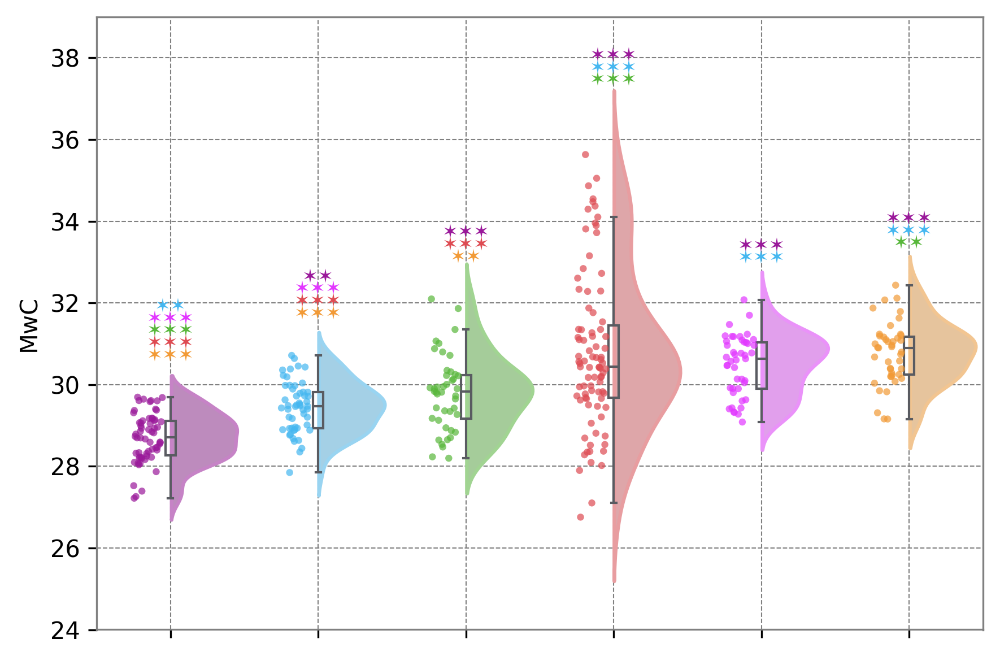

/tmp/ipykernel_2238524/1830332877.py:184: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_2238524/1830332877.py:199: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Cont
Default
DorsAttn
SalVentAttn
SomMot
Vis


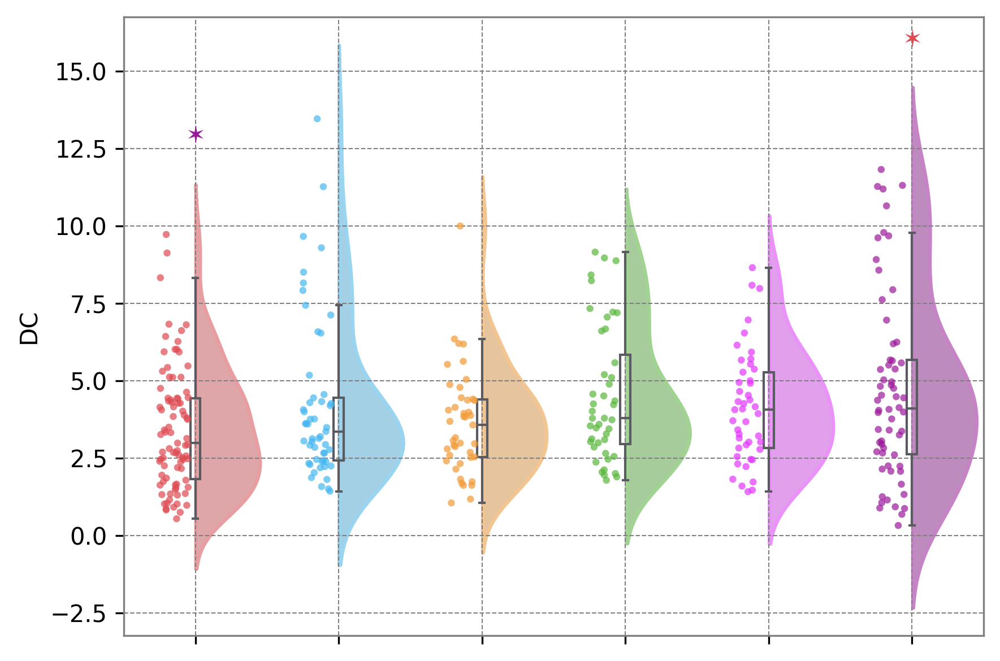

In [136]:
#--------------------------------------------------------------------------------------------
#--------------------------- test across networks  ----------------------------------------------
#--------------------------------------------------------------------------------------------

# Function to get significance stars
def get_star(p):
    if p < 0.001:
        return '✶✶✶'
    elif p < 0.01:
        return '✶✶'
    elif p < 0.05:
        return '✶'
    else:
        return ''



import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from matplotlib.cbook import boxplot_stats


# Group data by network
groups_ic = [DATA_avg[DATA_avg['yeo_7_nw'] == nw]['ICallsub_w_avg'].dropna() for nw in DATA_avg['yeo_7_nw'].unique()]
groups_dc = [DATA_avg_pr[DATA_avg_pr['yeo_7_nw'] == nw]['degallsub_w_avg'].dropna() for nw in DATA_avg_pr['yeo_7_nw'].unique()]

# Run ANOVA test
anova_mcc_result = stats.f_oneway(*groups_ic)
anova_dc_result = stats.f_oneway(*groups_dc)
  

print(f"ANOVA for MCC (MwC) across networks: F = {anova_mcc_result.statistic:.2f}, p = {anova_mcc_result.pvalue:.4f}")
print(f"ANOVA for DC across networks: F = {anova_dc_result.statistic:.2f}, p = {anova_dc_result.pvalue:.4f}")


# Run Tukey's HSD test for MCC (MwC)
tukey_mcc = pairwise_tukeyhsd(DATA_avg['ICallsub_w_avg'], DATA_avg['yeo_7_nw'])
tukey_df_mcc = pd.DataFrame(data=tukey_mcc._results_table.data[1:], columns=tukey_mcc._results_table.data[0])
sig_results_mcc = tukey_df_mcc[tukey_df_mcc['p-adj'] < 0.05]

# Run Tukey's HSD test for DC
tukey_dc = pairwise_tukeyhsd(DATA_avg_pr['degallsub_w_avg'], DATA_avg_pr['yeo_7_nw'])
tukey_df_dc = pd.DataFrame(data=tukey_dc._results_table.data[1:], columns=tukey_dc._results_table.data[0])
sig_results_dc = tukey_df_dc[tukey_df_dc['p-adj'] < 0.05]


#--------------------------------------------------------------------------------------------
#--------------------------- DC across networks  ----------------------------------------------
#--------------------------------------------------------------------------------------------

# Calculate median values for each network
median_values = DATA_avg.groupby('yeo_7_nw')['ICallsub_w_avg'].median()

# Sort networks by the median values
ordered_networks = median_values.sort_values().index

# Generate ordered palettes based on the original colors
ordered_palette = [lighter_color_map[network] for network in ordered_networks]
strip_palette = [network_color_map[network] for network in ordered_networks]

# Plot with the correct colors and sorted order
plt.figure(figsize=(6, 4), dpi=300)
ax = plt.gca()
ax.set_axisbelow(True)
# Violin plot with lighter colors for fills
violin_parts = sns.violinplot(
    data=DATA_avg, x='yeo_7_nw', y='ICallsub_w_avg',
    inner=None, linewidth=1.5, palette=ordered_palette,
    width=0.9, density_norm='width', ax=ax,
    order=ordered_networks  # Sort the networks based on median values
)

# Adjust violin outlines to use the correct lighter colors
for pc, network in zip(violin_parts.collections, ordered_networks):
    mpath = np.array(pc.get_paths()[0].vertices)
    mpath[:, 0] = np.clip(mpath[:, 0], np.median(mpath[:, 0]), np.max(mpath[:, 0]))
    pc.set_paths([mpath])
    pc.set_edgecolor(lighter_color_map[network])  # Use the correct lighter color for outlines

# Strip plot with the correct network colors
strip_plot = sns.stripplot(
    data=DATA_avg, x='yeo_7_nw', y='ICallsub_w_avg',
    jitter=0.1, marker='o', alpha=0.7,
    palette=strip_palette, ax=ax, size=3, order=ordered_networks
)

# Offset points in the strip plot (if required)
for patch in strip_plot.collections:
    x_shift = -0.15  
    patch.set_offsets(np.c_[patch.get_offsets()[:, 0] + x_shift, patch.get_offsets()[:, 1]])

# Box plot with updated order but original style
sns.boxplot(
    data=DATA_avg, x='yeo_7_nw', y='ICallsub_w_avg',
    width=0.07, fliersize=0, ax=ax,
    boxprops={'facecolor': 'none', 'edgecolor': '#595B61', 'linewidth': 1},
    whiskerprops={'color': '#595B61', 'linewidth': 1},
    capprops={'color': '#595B61', 'linewidth': 1},
    medianprops={'color': '#595B61', 'linewidth': 1},
    order=ordered_networks
)




xvals = list(ordered_networks)  
networks = sorted(DATA_avg['yeo_7_nw'].unique())
networks = sorted(DATA_avg['yeo_7_nw'].unique())
box_top = {}

for net in networks:
    vals = DATA_avg.loc[DATA_avg['yeo_7_nw'] == net, 'ICallsub_w_avg']
    stats = boxplot_stats(vals, whis=1.5)[0]
    whisker = stats["whishi"]
    
    actual_max = vals.max()
    # Use whichever is higher
    
    box_top[net] = max(whisker, actual_max)
    if net == 'Default':
        box_top[net] =box_top[net] + 0.8
        



    
star_counts = {net: 0 for net in ordered_networks}
star_offset = 0.8   
star_spacing = 0.3  


for idx, row in sig_results_mcc.iterrows():
    group1 = row['group1']
    group2 = row['group2']
    p_value = row['p-adj']
    star_text = get_star(p_value)
    
    
    x_coord1 = xvals.index(group1)
    y_coord1 = box_top[group1] + star_offset + star_counts[group1] * star_spacing
    ax.text(x_coord1, y_coord1, star_text,
            ha='center', va='bottom', fontsize=8, color=network_color_map[group2])
    star_counts[group1] += 1      
   
    x_coord2 = xvals.index(group2)
    y_coord2 = box_top[group2] + star_offset + star_counts[group2] * star_spacing
    ax.text(x_coord2, y_coord2, star_text,
            ha='center', va='bottom', fontsize=8, color=network_color_map[group1])
    star_counts[group2] += 1  

for spine in ax.spines.values():
    spine.set_edgecolor('gray')

plt.grid(True, axis='both', which='major', linestyle='--', linewidth=0.5, color='gray')

ax.set_xticklabels([])

plt.xlabel('')
plt.ylabel('MwC')
plt.ylim([24,39])
plt.tight_layout()
plt.savefig(f'Figures/network_IC_psmash.png', dpi=300, bbox_inches='tight')
plt.show()

#--------------------------------------------------------------------------------------------
#--------------------------- DC across networks  ----------------------------------------------
#--------------------------------------------------------------------------------------------

# Calculate median values for each network
median_values = DATA_avg_pr.groupby('yeo_7_nw')['degallsub_w_avg'].median()

# Sort networks by the median values
ordered_networks = median_values.sort_values().index

# Generate ordered palettes based on the original colors
ordered_palette = [lighter_color_map[network] for network in ordered_networks]
strip_palette = [network_color_map[network] for network in ordered_networks]

# Plot with the correct colors and sorted order
plt.figure(figsize=(6, 4), dpi=300)
ax = plt.gca()

# Violin plot with lighter colors for fills
violin_parts = sns.violinplot(
    data=DATA_avg_pr, x='yeo_7_nw', y='degallsub_w_avg',
    inner=None, linewidth=1.5, palette=ordered_palette,
    width=0.9, density_norm='width', ax=ax,
    order=ordered_networks  # Sort the networks based on median values
)

# Adjust violin outlines to use the correct lighter colors
for pc, network in zip(violin_parts.collections, ordered_networks):
    mpath = np.array(pc.get_paths()[0].vertices)
    mpath[:, 0] = np.clip(mpath[:, 0], np.median(mpath[:, 0]), np.max(mpath[:, 0]))
    pc.set_paths([mpath])
    pc.set_edgecolor(lighter_color_map[network])  # Use the correct lighter color for outlines

# Strip plot with the correct network colors
strip_plot = sns.stripplot(
    data=DATA_avg_pr, x='yeo_7_nw', y='degallsub_w_avg',
    jitter=0.1, marker='o', alpha=0.7,
    palette=strip_palette, ax=ax, size=3, order=ordered_networks
)

# Offset points in the strip plot (if required)
for patch in strip_plot.collections:
    x_shift = -0.15  
    patch.set_offsets(np.c_[patch.get_offsets()[:, 0] + x_shift, patch.get_offsets()[:, 1]])

# Box plot with updated order but original style
sns.boxplot(
    data=DATA_avg_pr, x='yeo_7_nw', y='degallsub_w_avg',
    width=0.07, fliersize=0, ax=ax,
    boxprops={'facecolor': 'none', 'edgecolor': '#595B61', 'linewidth': 1},
    whiskerprops={'color': '#595B61', 'linewidth': 1},
    capprops={'color': '#595B61', 'linewidth': 1},
    medianprops={'color': '#595B61', 'linewidth': 1},
    order=ordered_networks
)

xvals = list(ordered_networks)  
networks = sorted(DATA_avg_pr['yeo_7_nw'].unique())
networks = sorted(DATA_avg_pr['yeo_7_nw'].unique())
box_top = {}

for net in networks:
    print(net)
    vals = DATA_avg_pr.loc[DATA_avg_pr['yeo_7_nw'] == net, 'degallsub_w_avg']
    stats = boxplot_stats(vals, whis=1.5)[0]
    whisker = stats["whishi"]
    
    actual_max = vals.max()
    # Use whichever is higher
    
    box_top[net] = max(whisker, actual_max) +2
    if net == 'Vis':
        box_top[net] =box_top[net] + 1
        



    
star_counts = {net: 0 for net in ordered_networks}
star_offset = 0.8   
star_spacing = 0.3  


for idx, row in sig_results_dc.iterrows():
    group1 = row['group1']
    group2 = row['group2']
    p_value = row['p-adj']
    star_text = get_star(p_value)
    
    
    x_coord1 = xvals.index(group1)
    y_coord1 = box_top[group1] + star_offset + star_counts[group1] * star_spacing
    ax.text(x_coord1, y_coord1, star_text,
            ha='center', va='bottom', fontsize= 10, color=network_color_map[group2])
    star_counts[group1] += 1      
   
    x_coord2 = xvals.index(group2)
    y_coord2 = box_top[group2] + star_offset + star_counts[group2] * star_spacing
    ax.text(x_coord2, y_coord2, star_text,
            ha='center', va='bottom', fontsize=10, color=network_color_map[group1])
    star_counts[group2] += 1  

for spine in ax.spines.values():
    spine.set_edgecolor('gray')

# Final plot adjustments
ax.set_xticklabels([])
plt.grid(True, linestyle='--', linewidth=0.5, color='gray')
plt.xlabel('')
plt.ylabel('DC')
plt.tight_layout()
plt.savefig(f'Figures/network_DC_psmash.png', dpi=300, bbox_inches='tight')
plt.show()


## Fig 3b: Diversity 

/tmp/ipykernel_91576/3721898588.py:45: RuntimeWarning:

invalid value encountered in divide



NameError: name 'surrogate_brainmap_corrs' is not defined

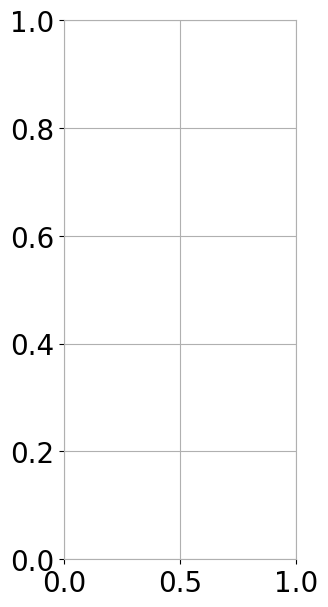

In [59]:
#--------------------------------------------------------------------------------------------
#--------------------------- IE diversity  ----------------------------------------------
#--------------------------------------------------------------------------------------------
from scipy.stats import spearmanr

thr_sc = 0.1
# scmask = 1
# thr_FC = 1
network_colors = ['#9A199A', '#45B7F0','#58B73B','#DE4B52','#E237FF','#F29A36','#FEFFD3']



Conn_Mat_IE = MIconn_allsub.copy()
Conn_Mat_IE[Conn_Mat_IE < 0.001] = 0
FCmat = Conn_Mat_IE
SCmat = SCconn_allsub.copy()


# [data_avg, data_single_sub] = IC_calculation(Conn_Mat_IE, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr_FC, sub_size, scmask, nrois_rem)
# DATA_avg = pd.concat([data_avg , net_label], axis =1)


SCmat_th = np.zeros((SCmat.shape[0], SCmat.shape[1], sub_size))
for i in range(sub_size):
    SCmat_th[:, :, i] = threshold_proportional(SCmat[:, :, i], thr_sc)
SC_mask = SCmat_th.copy()
SC_mask[SC_mask > 0] = 1
FCmat_SC = np.multiply(FCmat , SC_mask)


net_assign_allsub_IE = np.zeros((nrois_rem,num_net, sub_size))
for i in range(sub_size):
    FC = FCmat_SC[:,:,i]
    FC[FC > 0] = 1
    #FC[FC < 0] = 1
    FC_net = np.multiply(FC, new_net_num)
    for r in range(nrois_rem):
        for s in range(num_net):
            net_assign_allsub_IE[r,s,i] = np.nansum(FC_net[r,:] == s+1)

div_allsub_IE = np.zeros((nrois_rem, sub_size))
for i in range(sub_size):    
    net_assign = net_assign_allsub_IE[:,:,i]
    conn_sum = np.nansum(net_assign, axis=1, keepdims=True)      
    probabilities = net_assign / conn_sum
    #probabilities = np.multiply(net_assign , (net_assign-1)) / np.multiply(conn_sum ,(conn_sum-1))
    #div_allsub_IE[:,i] = -np.nansum(probabilities * np.log(probabilities), axis = 1)
    div_allsub_IE[:,i] = 1 - np.nansum(probabilities ** 2 , axis = 1)


div_avg_IE = np.nanmean(div_allsub_IE , axis = 1)


# for i in range(sub_size):   
#     cor , p = pcor(div_allsub_IE[:,i], data_single_sub['ICallsub_w'][:,i] )


# 
# --------- finding p-smash --------------------------------------
ic_array = DATA_avg['ICallsub_w_avg'].to_numpy()        
  
niter = 1000
data = pd.DataFrame({"x":div_avg_IE, "y":ic_array})
#test_stat_ic ,surrogate_brainmap_corrs_ic, sa_corrected_p_value_ic, spatially_naive_p_value_ic = Spatial_AC(data , "div", LIMB,niter)
sac1 = '#0199DD' 
sac2 = '#8CCF83'
sac3 = '#FEAD01'


fig, ax = plt.subplots(figsize=(3, 7))

plt.grid(True)
g = sns.kdeplot(surrogate_brainmap_corrs, color= "#E0E0E0", ax=ax, fill= True, linewidth=2.5 )

ax.axvline(test_stat, 0, 0.96, color= COLOR, linestyle='dashed', lw=3)

    
ax.set_xticks(np.arange(-1, 1.1, 0.5))
ax.set_ylim(0, 1.8)
ax.set_xlim(-0.8, 0.8)
#ax.text(0.5, -0.1, "Pearson correlation\nwith IE map", ha='center', va='top', transform=ax.transAxes)
spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)


plt.tick_params(axis='both', which='major', labelsize= FONT)      
plt.xlabel('Correlation', fontsize = FONT)
plt.ylabel('Density', fontsize = FONT)
plt.show()


lower_bound = np.percentile(surrogate_brainmap_corrs, 5)
upper_bound = np.percentile(surrogate_brainmap_corrs, 95)
print(f"95% CI of null distribution: [{lower_bound:.2f}, {upper_bound:.2f}]") 
    
# ---------------------------------------------------  

plt.figure(figsize=(5, 5), dpi = 300)
    
cor , p = pcor(div_avg_IE , DATA_avg['ICallsub_w_avg'])
print(cor, p)
data = pd.DataFrame({'ent_avg': div_avg_IE, 'ICallsub_w_avg': DATA_avg['ICallsub_w_avg'], 'Network': net_label["yeo_7_nw"]})
grid = sns.FacetGrid(data, hue="Network", palette=network_colors, height=6, aspect=5/4)


grid.map(plt.scatter, 'ent_avg', 'ICallsub_w_avg', alpha=0.9 , s=85)
sns.regplot(data=data, x='ent_avg', y='ICallsub_w_avg', scatter=False, ax=grid.ax, color='gray')


plt.grid(True)

if p_IC_w_E_smash < 0.0001:
     title = "r = {:.2f} , p-smash <  {:.3f}".format(float(corr_IC_w_E), float(0.001))
else:
    title = "r = {:.2f} , p-smash = {:.3f}".format(float(corr_IC_w_E), float(p_IC_w_E_smash))



plt.title(f"r = {cor:.2f} , p = {p:.2f}", fontsize=FONT)
plt.xlabel('Simpson Diversity Index', fontsize=FONT)
plt.ylabel('MwC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize=FONT)

for _, spine in grid.ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)
    spine.set_edgecolor('gray')

plt.savefig(f'Figures/diversity_IC_psmash.png', dpi=300, bbox_inches='tight')
plt.show()



#--------------------------------------------------------------------------------------------
#--------------------------- DC diversity  ----------------------------------------------
#--------------------------------------------------------------------------------------------


# scmask = 0
thr_FC = 0.2
thr_SC = 0.1
# import math


Conn_Mat_pr = Pearconn_allsub.copy()
Conn_Mat_pr[Conn_Mat_pr < 0] = 0


#Conn_Mat_pr = np.abs(Conn_Mat_pr)
# for i in range(Pearconn_allsub.shape[2]):
#     np.fill_diagonal(Conn_Mat_pr[:, :, i], 0)





Conn_Mat_th = np.zeros((Conn_Mat_pr.shape[0], Conn_Mat_pr.shape[1], sub_size))
for i in range(sub_size):
    Conn_Mat_th[:,:,i] = threshold_proportional(Conn_Mat_pr[:, :, i], thr_FC)

    
SCmat = SCconn_allsub.copy()
SCmat_th = np.zeros((SCmat.shape[0], SCmat.shape[1], sub_size))
for i in range(sub_size):
    SCmat_th[:, :, i] = threshold_proportional(SCmat[:, :, i], thr_SC)
SC_mask = SCmat_th.copy()
SC_mask[SC_mask > 0] = 1
FCmat_SC_pr = np.multiply(Conn_Mat_th , SC_mask)
#FCmat_SC_pr = Conn_Mat_th 


   
degallsub = np.zeros((nrois_rem, sub_size))
for i in range(sub_size):
    dd = FCmat_SC_pr [:,:,i]
    degallsub[:,i] = np.nansum(dd, axis=1)

    
    

#FCmat_SC_pr = Conn_Mat_th.copy()
net_assign_allsub_pr = np.zeros((nrois_rem,num_net, sub_size))
for i in range(sub_size):
    FC = np.abs(FCmat_SC_pr[:,:,i])
    FC[FC > 0] = 1
 
    FC_net = np.multiply(FC, new_net_num)
    for r in range(nrois_rem):
        for s in range(num_net):
            net_assign_allsub_pr[r,s,i] = np.nansum(FC_net[r,:] == s+1)


          
            
div_allsub_DC = np.zeros((nrois_rem, sub_size))
for i in range(sub_size):    
    net_assign = net_assign_allsub_pr[:,:,i]
    conn_sum = np.nansum(net_assign, axis=1, keepdims=True)      
    #probabilities = np.multiply(net_assign , (net_assign-1)) / np.multiply(conn_sum ,(conn_sum-1))
    probabilities = net_assign / conn_sum 
    #entropy_allsub_pr[:,i] = -np.nansum(probabilities * np.log(probabilities), axis = 1)
    div_allsub_DC[:,i] = 1 - np.nansum(probabilities ** 2 , axis = 1)


div_avg_DC = np.nanmean(div_allsub_DC , axis = 1)
# for i in range(sub_size):   
#     cor , p = pcor(div_allsub_DC[:,i],  degallsub[:,i])
#     print(cor, p)
    

      

# --------- finding p-smash -----------------------------------------

deg_array = DATA_avg_pr['degallsub_w_avg'].to_numpy()        
#deg_array = np.nanmean(degallsub , axis =1)
cor , p = pcor(div_avg_DC , deg_array) 



niter = 1000
data = pd.DataFrame({"x":div_avg_DC, "y":deg_array})
#test_stat_dc ,surrogate_brainmap_corrs_dc, sa_corrected_p_value_dc, spatially_naive_p_value_dc = Spatial_AC(data , "div", LIMB,niter)
sac1 = '#0199DD' 
sac2 = '#8CCF83'
sac3 = '#FEAD01'


fig, ax = plt.subplots(figsize=(3, 7))

plt.grid(True)
g = sns.kdeplot(surrogate_brainmap_corrs_dc, color= "#E0E0E0", ax=ax, fill= True, linewidth=2.5 )

ax.axvline(test_stat_dc, 0, 0.96, color= COLOR, linestyle='dashed', lw=3)

    
ax.set_xticks(np.arange(-1, 1.1, 0.5))
ax.set_ylim(0, 1.8)
ax.set_xlim(-0.8, 0.8)
#ax.text(0.5, -0.1, "Pearson correlation\nwith IE map", ha='center', va='top', transform=ax.transAxes)
spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)


plt.tick_params(axis='both', which='major', labelsize= FONT)      
plt.xlabel('Correlation', fontsize = FONT)
plt.ylabel('Density', fontsize = FONT)
plt.show()


lower_bound = np.percentile(surrogate_brainmap_corrs_dc, 5)
upper_bound = np.percentile(surrogate_brainmap_corrs_dc, 95)
print(f"95% CI of null distribution: [{lower_bound:.2f}, {upper_bound:.2f}]") 

# ----------------------------------------------------------------    


plt.figure(figsize=(5, 5), dpi = 300)

data = pd.DataFrame({'ent_avg': div_avg_DC, 'degallsub_w_avg': deg_array, 'Network': net_label["yeo_7_nw"]})
grid = sns.FacetGrid(data, hue="Network", palette=network_colors, height=6, aspect=5/4)


grid.map(plt.scatter, 'ent_avg', 'degallsub_w_avg', alpha=0.9 , s=85)
sns.regplot(data=data, x='ent_avg', y='degallsub_w_avg', scatter=False, ax=grid.ax, color='gray')


plt.grid(True)
plt.title(f"r = {cor:.2f} , p-smash= {p:.2f} ", fontsize=FONT)
plt.xlabel('Simpson Diversity Index', fontsize=FONT)
plt.ylabel('DC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize=FONT)

for _, spine in grid.ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1)
    spine.set_edgecolor('gray')
plt.savefig(f'Figures/diversity_DC_psmash.png', dpi=300, bbox_inches='tight')
plt.show()

## Fig 3c

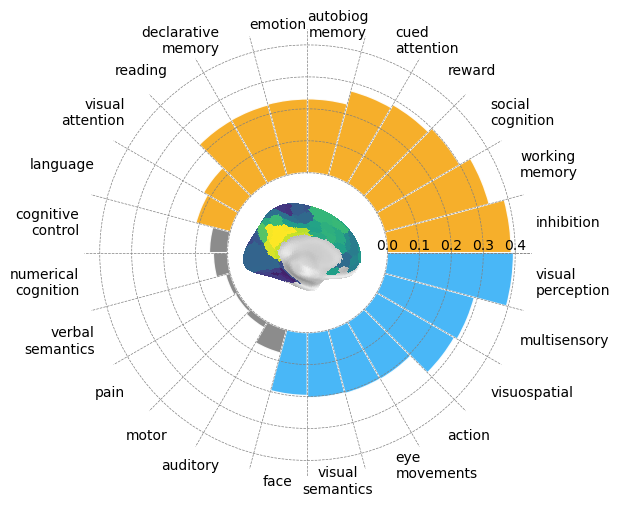

In [53]:



fig = plt.figure(figsize=(6, 6))

ax_brain = fig.add_axes([0.38, 0.38, 0.24, 0.24], projection='3d') 
fsaverage = datasets.fetch_surf_fsaverage()
col_fsa = parcel_to_surface(IC_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                           hemi='left', vmin= V_min, vmax = V_max, view='medial',
                           bg_map=fsaverage['sulc_left'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP_IC, axes=ax_brain,  figure=fig, colorbar=False)
ax_brain.set_axis_off()  


ax = fig.add_subplot(111, polar=True, label="PolarPlot", frame_on=False)

# Generate angles for each sector
angles = np.linspace(0, 2 * np.pi, len(sorted_labels) + 1, endpoint=True).tolist()

# Compute sector centers by averaging adjacent angles
sector_centers = [(angles[i] + angles[i + 1]) / 2 for i in range(len(angles) - 1)]

for angle in angles:
    ax.plot([angle, angle], [base_radius, base_radius + max_correlation + 0.05], 
            linestyle='dashed', color='gray', linewidth=0.5)
# Bar width
width = (2 * np.pi / len(sorted_labels))

# Base radius for bars
base_radius = 0.25 

# Plot bars
bars = ax.bar(angles[:-1], np.abs(sorted_stats), width=width, bottom=base_radius, 
              align='edge', edgecolor='white')

# Set colors based on correlation values
for bar, stat, pval in zip(bars, sorted_stats, sorted_p):
    bar.set_facecolor('#F5A614' if (stat > 0 and pval < 0.05) else ('#35B0F7' if (stat < 0 and pval < 0.05) else 'gray'))
    bar.set_alpha(0.9)

# Correlation ring values
correlation_values = np.linspace(0, 0.4, 5)
max_correlation = max(correlation_values)

for r in correlation_values:
    ax.plot(np.linspace(0, 2 * np.pi, 100), [base_radius + r] * 100, '--', color='gray', linewidth=0.5)
    ax.text(0, base_radius + r , f'{r:.1f}', horizontalalignment='center', verticalalignment='bottom', fontsize = 10)

# Label placement adjustments
dash_line_length = base_radius + max_correlation + 0.05
label_distance = dash_line_length + 0.02


for angle, label in zip(sector_centers, sorted_labels):
    if label == "autobiographical memory":
        label = "autobiog memory"
    if len(label) > 10:
        label = label.replace(' ', '\n', 1)

    # alignment based on angle
    c = np.cos(angle)          # + on right half, – on left half, ~0 at top/bottom
    eps = 0.15                 # how wide to treat as “vertical” (tune 0.10–0.20)

    if abs(c) < eps:           # near top/bottom → center
        ha = 'center'
    elif c > 0:                # right half → left-align outward
        ha = 'left'
    else:                      # left half → right-align outward
        ha = 'right'

    ax.text(angle, label_distance, label,
            ha=ha, va='center', fontsize=10, color='black', clip_on=False)




ax.set_xticks([]) 
ax.set_yticklabels([])  
ax.grid(False)
ax.spines['polar'].set_visible(False)
plt.savefig(f'Figures/neurosynth_IC.png', dpi=300, bbox_inches='tight')
plt.show()





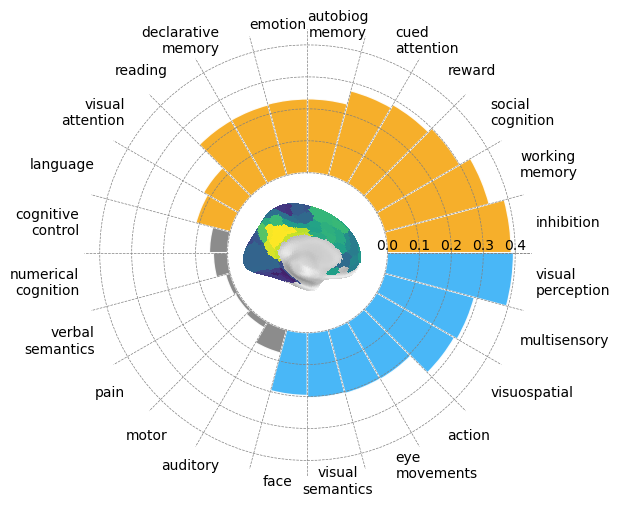

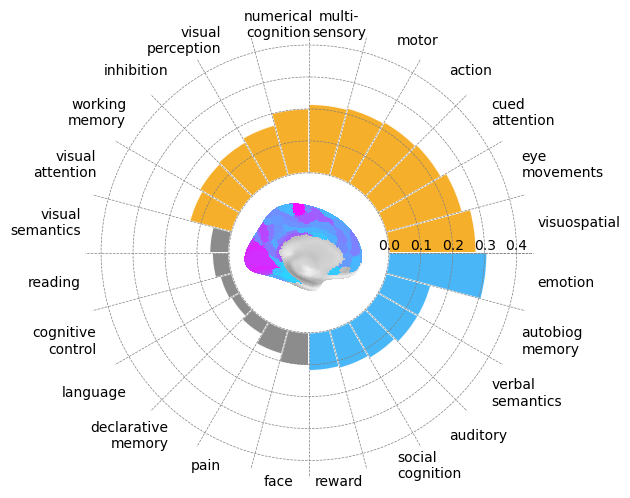

In [58]:
CMAP = 'viridis'
#data preperation
data = DATA_avg.ICallsub_w_avg
main_dir = '/RAID1/jupytertmp/mi/AUF/Neurosynth'
ref_nifti_path = '/RAID1/jupytertmp/mi/data/MMP_in_MNI_corr_2mm.nii.gz'
ref_img = nib.load(ref_nifti_path)
ref_data = ref_img.get_fdata()
thr = 1
labels = ['face', 'verbal semantics', 'cued attention', 'working memory','autobiographical memory', 'reading', 'inhibition', 'motor',
          'visual perception', 'numerical cognition', 'reward', 'visual attention','multisensory', 'visuospatial','eye movements', 'action',
          'auditory', 'pain', 'language', 'declarative memory','visual semantics', 'emotion', 'cognitive control', 'social cognition']


base_radius = 0.25 
#--------------------------------------------------------------------------------------------
#------------------ Neurosynth and IC map   -------------------------------
#-------------------------------------------------------------------------------------------
correlation_values = np.linspace(0, 0.4, 5)
max_correlation = max(correlation_values)

IC = np.array((data)).reshape(-1, 1)
IC_allrois = np.zeros((360,1))
ind = np.arange(360)
mask = np.ones(ind.shape , dtype = bool)
mask[limb_ind] = False
ind = ind[mask]
IC_allrois[ind] = (np.abs(IC))

unique_regions = np.unique(ref_data)
unique_regions = unique_regions[unique_regions > 0] 



mapped_data = np.zeros(ref_data.shape)

for roi_index, roi_value in enumerate(IC_allrois.flatten(), start=1): 
    
    mapped_data[ref_data == roi_index] = roi_value



alltask_rois = np.zeros((len(unique_regions), len(labels)))

for i, task in enumerate(labels):
    
    
    map_path = '/RAID1/jupytertmp/fdgquant2016/notebooks/ext_data/neurosynth_maps/'+task+'.nii.gz'
    mask_filename = os.path.join(main_dir, 'mask_'+task+'.nii.gz')
    task_map = nib.load(map_path).get_fdata()
   
    
    

   
    
    for roi, region in enumerate(unique_regions):
        mask = ref_data == region
        masked_data = task_map[mask]
        mean_value = np.mean(masked_data)
        alltask_rois[roi,i] = mean_value
    
    
    
alltask_rois_rem = np.delete(alltask_rois, limb_ind, axis =0 )
     

cor =np.zeros((len(labels)))
p =np.zeros((len(labels)))

for i, label in enumerate(labels):
    cor[i],p[i] = pcor(alltask_rois_rem[:,i],data )
    
    
data = pd.DataFrame({'corr':cor, 'Pval':p, 'task':labels})


labels = data['task']
stats = data['corr']
Pval = data['Pval']

df = pd.DataFrame({'label': labels, 'corr': stats, 'Pval':Pval})


df_sorted = df.sort_values('corr', ascending=False).reset_index(drop=True)

sorted_labels = df_sorted['label'].tolist()
sorted_stats = df_sorted['corr'].tolist()
sorted_p = df_sorted['Pval'].tolist()
V_max =  IC.max()
V_max = 34
V_min = IC.min()


fig = plt.figure(figsize=(6, 6))

ax_brain = fig.add_axes([0.38, 0.38, 0.24, 0.24], projection='3d') 
fsaverage = datasets.fetch_surf_fsaverage()
col_fsa = parcel_to_surface(IC_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                           hemi='left', vmin= V_min, vmax = V_max, view='medial',
                           bg_map=fsaverage['sulc_left'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP_IC, axes=ax_brain,  figure=fig, colorbar=False)
ax_brain.set_axis_off()  


ax = fig.add_subplot(111, polar=True, label="PolarPlot", frame_on=False)

# Generate angles for each sector
angles = np.linspace(0, 2 * np.pi, len(sorted_labels) + 1, endpoint=True).tolist()

# Compute sector centers by averaging adjacent angles
sector_centers = [(angles[i] + angles[i + 1]) / 2 for i in range(len(angles) - 1)]

for angle in angles:
    ax.plot([angle, angle], [base_radius, base_radius + max_correlation + 0.05], 
            linestyle='dashed', color='gray', linewidth=0.5)
# Bar width
width = (2 * np.pi / len(sorted_labels))

# Base radius for bars
base_radius = 0.25 

# Plot bars
bars = ax.bar(angles[:-1], np.abs(sorted_stats), width=width, bottom=base_radius, 
              align='edge', edgecolor='white')

# Set colors based on correlation values
for bar, stat, pval in zip(bars, sorted_stats, sorted_p):
    bar.set_facecolor('#F5A614' if (stat > 0 and pval < 0.05) else ('#35B0F7' if (stat < 0 and pval < 0.05) else 'gray'))
    bar.set_alpha(0.9)

# Correlation ring values
correlation_values = np.linspace(0, 0.4, 5)
max_correlation = max(correlation_values)

for r in correlation_values:
    ax.plot(np.linspace(0, 2 * np.pi, 100), [base_radius + r] * 100, '--', color='gray', linewidth=0.5)
    ax.text(0, base_radius + r , f'{r:.1f}', horizontalalignment='center', verticalalignment='bottom', fontsize = 10)

# Label placement adjustments
dash_line_length = base_radius + max_correlation + 0.05
label_distance = dash_line_length + 0.02

for angle, label in zip(sector_centers, sorted_labels):
    if label == "autobiographical memory":
        label = "autobiog memory"
    if len(label) > 10:
        label = label.replace(' ', '\n', 1)

    # alignment based on angle
    c = np.cos(angle)          # + on right half, – on left half, ~0 at top/bottom
    eps = 0.15                 # how wide to treat as “vertical” (tune 0.10–0.20)

    if abs(c) < eps:           # near top/bottom → center
        ha = 'center'
    elif c > 0:                # right half → left-align outward
        ha = 'left'
    else:                      # left half → right-align outward
        ha = 'right'

    ax.text(angle, label_distance, label,
            ha=ha, va='center', fontsize=10, color='black', clip_on=False)




ax.set_xticks([]) 
ax.set_yticklabels([])  
ax.grid(False)
ax.spines['polar'].set_visible(False)
plt.savefig(f'Figures/neurosynth_IC.png', dpi=300, bbox_inches='tight')
plt.show()



#--------------------------------------------------------------------------------------------
#------------------ Neurosynth and DC map  -------------------------------
#--------------------------------------------------------------------------------------------

# cool_cmap = cm.get_cmap('cool')
# cool_colors = cool_cmap(np.linspace(0.15, 0.95, 256))  
# CMAP = LinearSegmentedColormap.from_list("adjusted_cool", cool_colors)

#data preperation
data = DATA_avg_pr.degallsub_w_avg
IC = np.array((data)).reshape(-1, 1)
IC_allrois = np.zeros((360,1))
ind = np.arange(360)
mask = np.ones(ind.shape , dtype = bool)
mask[limb_ind] = False
ind = ind[mask]
IC_allrois[ind] = (np.abs(IC))

unique_regions = np.unique(ref_data)
unique_regions = unique_regions[unique_regions > 0] 



mapped_data = np.zeros(ref_data.shape)

for roi_index, roi_value in enumerate(IC_allrois.flatten(), start=1): 
    
    mapped_data[ref_data == roi_index] = roi_value


alltask_rois = np.zeros((len(unique_regions), len(labels)))

for i, task in enumerate(labels):
    
    
    map_path = '/RAID1/jupytertmp/fdgquant2016/notebooks/ext_data/neurosynth_maps/'+task+'.nii.gz'
    mask_filename = os.path.join(main_dir, 'mask_'+task+'.nii.gz')
    task_map = nib.load(map_path).get_fdata()
    
    for roi, region in enumerate(unique_regions):
        mask = ref_data == region
        masked_data = task_map[mask]
        mean_value = np.mean(masked_data)
        alltask_rois[roi,i] = mean_value  
    
alltask_rois_rem = np.delete(alltask_rois, limb_ind, axis =0 )
     

cor =np.zeros((len(labels)))
p =np.zeros((len(labels)))

for i, label in enumerate(labels):
    cor[i],p[i] = pcor(alltask_rois_rem[:,i],data )
    
    
data = pd.DataFrame({'corr':cor, 'Pval':p, 'task':labels})


labels = data['task']
stats = data['corr']
Pval = data['Pval']

df = pd.DataFrame({'label': labels, 'corr': stats, 'Pval':Pval})


df_sorted = df.sort_values('corr', ascending=False).reset_index(drop=True)

sorted_labels = df_sorted['label'].tolist()
sorted_stats = df_sorted['corr'].tolist()
sorted_p = df_sorted['Pval'].tolist()
V_max =  IC.max()
V_min = IC.min()



fig = plt.figure(figsize=(6, 6))

ax_brain = fig.add_axes([0.38, 0.38, 0.24, 0.24], projection='3d') 
fsaverage = datasets.fetch_surf_fsaverage()
col_fsa = parcel_to_surface(IC_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                           hemi='left', vmin= V_min, vmax = V_max, view='medial',
                           bg_map=fsaverage['sulc_left'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP_DC, axes=ax_brain,  figure=fig, colorbar=False)
ax_brain.set_axis_off()  


ax = fig.add_subplot(111, polar=True, label="PolarPlot", frame_on=False)

# Generate angles for each sector
angles = np.linspace(0, 2 * np.pi, len(sorted_labels) + 1, endpoint=True).tolist()

# Compute sector centers by averaging adjacent angles
sector_centers = [(angles[i] + angles[i + 1]) / 2 for i in range(len(angles) - 1)]

for angle in angles:
    ax.plot([angle, angle], [base_radius, base_radius + max_correlation + 0.05], 
            linestyle='dashed', color='gray', linewidth=0.5)
# Bar width
width = (2 * np.pi / len(sorted_labels))

# Base radius for bars
 

# Plot bars
bars = ax.bar(angles[:-1], np.abs(sorted_stats), width=width, bottom=base_radius, 
              align='edge', edgecolor='white')

# Set colors based on correlation values
for bar, stat, pval in zip(bars, sorted_stats, sorted_p):
    bar.set_facecolor('#F5A614' if (stat > 0 and pval < 0.05) else ('#35B0F7' if (stat < 0 and pval < 0.05) else 'gray'))
    bar.set_alpha(0.9)

# Correlation ring values
correlation_values = np.linspace(0, 0.4, 5)
max_correlation = max(correlation_values)

for r in correlation_values:
    ax.plot(np.linspace(0, 2 * np.pi, 100), [base_radius + r] * 100, '--', color='gray', linewidth=0.5)
    ax.text(0, base_radius + r, f'{r:.1f}', horizontalalignment='center', verticalalignment='bottom',
        fontsize=10)

# Label placement adjustments
dash_line_length = base_radius + max_correlation + 0.05
label_distance = dash_line_length + 0.02

for angle, label in zip(sector_centers, sorted_labels):
    if label == "multisensory":
        label = "multi-\nsensory"  

    if label == "autobiographical memory":
        label = "autobiog memory"
    if len(label) > 9:
        label = label.replace(' ', '\n', 1)

    # alignment based on angle
    c = np.cos(angle)          # + on right half, – on left half, ~0 at top/bottom
    eps = 0.15                 # how wide to treat as “vertical” (tune 0.10–0.20)

    if abs(c) < eps:           # near top/bottom → center
        ha = 'center'
    elif c > 0:                # right half → left-align outward
        ha = 'left'
    else:                      # left half → right-align outward
        ha = 'right'

    ax.text(angle, label_distance, label,
            ha=ha, va='center', fontsize=10, color='black', clip_on=False)





ax.set_xticks([]) 
ax.set_yticklabels([])  
ax.grid(False)
ax.spines['polar'].set_visible(False)
plt.savefig(f'Figures/neurosynth_DC.png', dpi=300, bbox_inches='tight')
plt.show()


## Fig 4a

/tmp/ipykernel_91576/1429810803.py:24: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



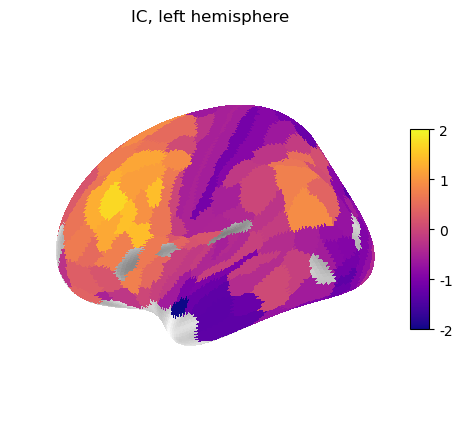

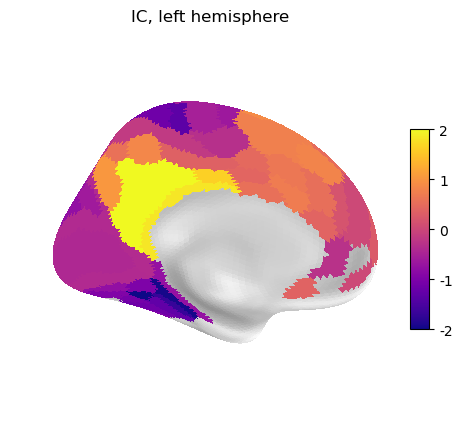

In [14]:
genes = pd.read_csv("/RAID1/jupytertmp/mi/input_data/glasser_expression.csv" )

CMAP = CMAP_IC
nregs_lh = 167
limb_ind_l = np.array([88, 90, 92, 93, 110, 118, 120, 122, 131, 135, 165, 166, 172])-1


gene_exp_l = genes.to_numpy()[:180 , :]
gene_exp_l = np.delete(gene_exp_l , limb_ind_l , axis = 0)
rows_with_nan = np.any(np.isnan(gene_exp_l), axis=1)
rows_with_nan_ind = [i for i, val in enumerate(rows_with_nan) if val]

#rows_with_nan_ind  = []



IC_l = np.array(DATA_avg.ICallsub_w_avg[:nregs_lh])
IC_l = np.delete(IC_l , rows_with_nan_ind , axis = 0)
IC_l = np.array(IC_l).reshape(-1, 1)

# FONT = 18
# allgenes_expression = pd.read_csv("/RAID1/jupytertmp/mi/input_data/glasser_expression.csv" )
# ranked_genes = pd.read_csv("/RAID1/jupytertmp/mi/input_data/PLS1_geneWeights.csv" )
cool_cmap = cm.get_cmap('cool')
cool_colors = cool_cmap(np.linspace(0.15, 0.95, 256))  
CMAP = LinearSegmentedColormap.from_list("adjusted_cool", cool_colors)
CMAP = 'plasma'
SIZE = 50
#--------------------------------------------------------------------------------------------
#------------------------ IC map  -----------------------------
#-------------------------------------------------------------------------------------------- 









gene_exp_l = genes.to_numpy()[:180 , :]
rows_with_nan = np.any(np.isnan(gene_exp_l), axis=1)
rows_with_nan_ind = [i for i, val in enumerate(rows_with_nan) if val]


data_allrois = np.zeros((360,1))
ind = np.arange(360)
mask = np.ones(ind.shape , dtype = bool)
mask[180:] = False
mask[limb_ind_l] = False
mask[rows_with_nan_ind] = False
ind = ind[mask]
IC_l = zscore(IC_l)
data_allrois[ind] = IC_l

vmax1 = 2
vmin1 = -2

# vmax1 = IC_l.max()
# vmin1 = IC_l.min()

col_fsa = parcel_to_surface(data_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                           title='IC, left hemisphere',
                           hemi='left', vmin= vmin1, vmax = vmax1, view='lateral',
                           bg_map=fsaverage['sulc_left'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP,colorbar=True)
plt.show()

col_fsa = parcel_to_surface(data_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                           title='IC, left hemisphere',
                           hemi='left', vmin= vmin1, vmax = vmax1, view='medial',
                           bg_map=fsaverage['sulc_left'], bg_on_data = False,
                           darkness=0.5,cmap=CMAP,colorbar=True)
plt.show()



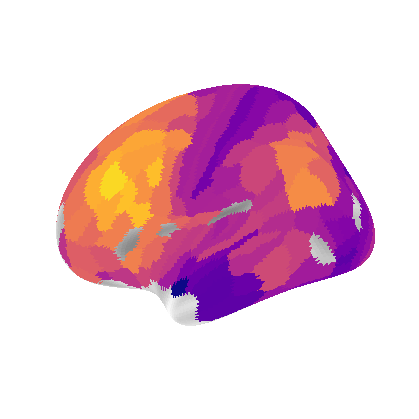

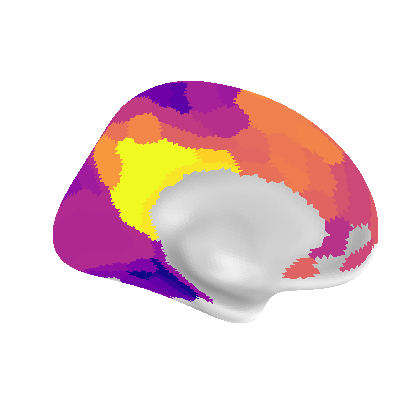

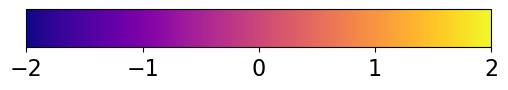

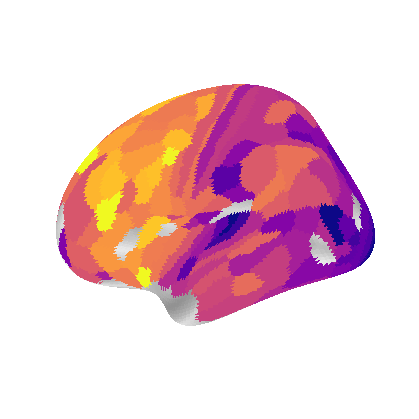

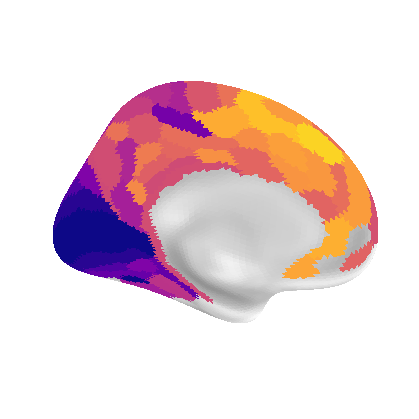

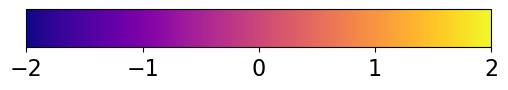

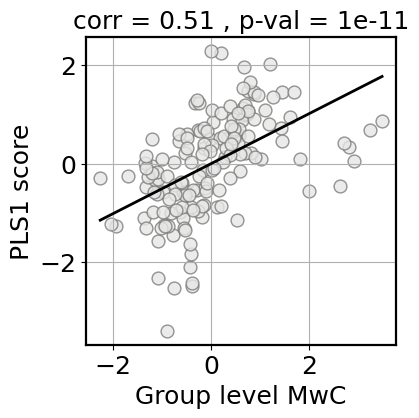

NameError: name 'ranked_genes' is not defined

In [15]:
genes = pd.read_csv("/RAID1/jupytertmp/mi/input_data/glasser_expression.csv" )



gene_names = genes.columns[0:]
CMAP = 'plasma'
nregs_lh = 167
limb_ind_l = np.array([88, 90, 92, 93, 110, 118, 120, 122, 131, 135, 165, 166, 172])-1


gene_exp_l = genes.to_numpy()[:180 , :]
gene_exp_l = np.delete(gene_exp_l , limb_ind_l , axis = 0)

rows_with_nan = np.any(np.isnan(gene_exp_l), axis=1)
rows_with_nan_ind = [i for i, val in enumerate(rows_with_nan) if val]


#rows_with_nan_ind  = []

data_avg = DATA_avg
nregs_lh = 167
IC_l = np.array(data_avg.ICallsub_w_avg[:nregs_lh])
IC_l = np.delete(IC_l , rows_with_nan_ind , axis = 0)
IC_l = np.array(IC_l).reshape(-1, 1)

# FONT = 18
# allgenes_expression = pd.read_csv("/RAID1/jupytertmp/mi/input_data/glasser_expression.csv" )
# ranked_genes = pd.read_csv("/RAID1/jupytertmp/mi/input_data/PLS1_geneWeights.csv" )

SIZE = 50
#--------------------------------------------------------------------------------------------
#------------------------ IC map  -----------------------------
#-------------------------------------------------------------------------------------------- 
CMAP = 'plasma'
gene_exp_l = genes.to_numpy()[:180 , :]
rows_with_nan = np.any(np.isnan(gene_exp_l), axis=1)
rows_with_nan_ind = [i for i, val in enumerate(rows_with_nan) if val]


data_allrois = np.zeros((360,1))
ind = np.arange(360)
mask = np.ones(ind.shape , dtype = bool)
mask[180:] = False
mask[limb_ind_l] = False
mask[rows_with_nan_ind] = False
ind = ind[mask]
IC_l = zscore(IC_l)
data_allrois[ind] = IC_l

vmax1 = 2
vmin1 = -2

# vmax1 = IC_l.max()
# vmin1 = IC_l.min()

col_fsa = parcel_to_surface(data_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                         
                           hemi='left', vmin= vmin1, vmax = vmax1, view='lateral',
                           bg_map=fsaverage['sulc_left'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP,colorbar=False)
plt.savefig('Figures/IC_l_lateral_GO.png', dpi=300, bbox_inches='tight')
plt.show()

col_fsa = parcel_to_surface(data_allrois,'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                           
                           hemi='left', vmin= vmin1, vmax = vmax1, view='medial',
                           bg_map=fsaverage['sulc_left'], bg_on_data = False,
                           darkness=0.5,cmap=CMAP,colorbar=False)

plt.savefig('Figures/IC_l_medial_GO.png', dpi=300, bbox_inches='tight')
plt.show()

cmap = plt.get_cmap(CMAP)
norm = plt.Normalize(vmin=vmin1, vmax=vmax1)

fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

cb = colorbar.ColorbarBase(ax, cmap=cmap, norm=norm, orientation='horizontal')

cb.ax.tick_params(labelsize=16)

plt.savefig('Figures/IC_colorbar_GO.png', dpi=300, bbox_inches='tight')
plt.show()
#--------------------------------------------------------------------------------------------
#-------------------------  AHBA genes PLS1 scores  -----------------------------------------
#--------------------------------------------------------------------------------------------

pls1_score = pd.read_csv('/RAID1/jupytertmp/mi/input_data/PLS1_ROIscores.csv', header=None)
pls1_score = np.array(pls1_score).reshape(-1, 1)

pls1_score_allrois = np.zeros((360,1))
ind = np.arange(360)
mask = np.ones(ind.shape , dtype = bool)
mask[180:] = False
mask[limb_ind_l] = False
mask[rows_with_nan_ind] = False
ind = ind[mask]
pls1_score = zscore(pls1_score)
pls1_score_allrois[ind] = pls1_score
# vmax1 = pls1_score.max()
# vmin1 = pls1_score.min()

vmax1 = 2
vmin1 = -2
fsaverage = datasets.fetch_surf_fsaverage()
col_fsa = parcel_to_surface(pls1_score_allrois, 'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                      
                       hemi='left', vmin= vmin1, vmax= vmax1, view='lateral',
                       bg_map=fsaverage['sulc_right'], bg_on_data= False,
                       darkness=0.5, cmap=CMAP, colorbar= False)
plt.savefig('Figures/pls1_l_lateral_GO.png', dpi=300, bbox_inches='tight')
plt.show()

plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       
                       hemi='left', vmin= vmin1, vmax= vmax1, view='medial',
                       bg_map=fsaverage['sulc_left'], bg_on_data=False,
                       darkness=0.5, cmap=CMAP, colorbar= False)

plt.savefig('Figures/pls1_l_medial_GO.png', dpi=300, bbox_inches='tight')
plt.show()

cmap = plt.get_cmap(CMAP)
norm = plt.Normalize(vmin=vmin1, vmax=vmax1)

fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

cb = colorbar.ColorbarBase(ax, cmap=cmap, norm=norm, orientation='horizontal')

cb.ax.tick_params(labelsize=16)

plt.savefig('Figures/IC_colorbar_GO.png', dpi=300, bbox_inches='tight')
plt.show()
#--------------------------------------------------------------------------------------------
#-------------------------  scatter plot IC and pls1 score ---------------------------------------
#--------------------------------------------------------------------------------------------

IC = IC_l.flatten()
pls1 = pls1_score.flatten()

corr_IC_w_pls1, p_IC_w_pls1 = pcor(IC, pls1 )


fig, ax = plt.subplots(figsize=(4, 4))




sns.regplot(
    x=IC,
    y=pls1,
    scatter_kws={
        'facecolors': "#E6E6E6",
        'edgecolor': '#787B76' ,
        'linewidths': 1, 
        's': 85  
    },
    line_kws={
        'color': '#000000',  
        'lw': 2  
    },
    ci=None  # This removes the confidence interval
)


title = "corr = {:.2f} , p-val = {:.0e}".format(float(corr_IC_w_pls1) , float(p_IC_w_pls1))
ax.set_title(title , fontdict={'fontsize': FONT})
plt.xlabel('Group level MwC' , fontsize = FONT)
plt.ylabel('PLS1 score' , fontsize = FONT)
plt.grid(True)


plt.tick_params(axis='both', which='major', labelsize= FONT)  # Increase the tick label font size


ax = plt.gca()  # Get the current Axes instance

# Set the spine linewidth
spine_width = 1.6  # Change this value to your preferred linewidth
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)

plt.savefig('Figures/IC_pls1_GO.png', dpi=300, bbox_inches='tight')
plt.show()

#--------------------------------------------------------------------------------------------
#---- gene expression and scatter plot of IC and gene expression: gene with max pls load  ---
#-------------------------------------------------------------------------------------------- 

i = 0

selected_gene = ranked_genes.iloc[i,0]

selected_gene_expression = np.array(allgenes_expression.loc[:,selected_gene])
selected_gene_expression= selected_gene_expression[:180]
selected_gene_expression = np.delete(selected_gene_expression , limb_ind_l)
selected_gene_expression = np.delete(selected_gene_expression , rows_with_nan_ind)
selected_gene_expression = np.array(selected_gene_expression).reshape(-1, 1)

data_allrois = np.zeros((360,1))
ind = np.arange(360)
mask = np.ones(ind.shape , dtype = bool)
mask[180:] = False
mask[limb_ind_l] = False
mask[rows_with_nan_ind] = False
ind = ind[mask]
selected_gene_expression = zscore(selected_gene_expression)
data_allrois[ind] = selected_gene_expression

# vmax1 = selected_gene_expression.max()
# vmin1 = selected_gene_expression.min()
vmax1 = 2 
vmin1 = -2

fsaverage = datasets.fetch_surf_fsaverage()
col_fsa = parcel_to_surface(data_allrois, 'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_right'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       title='AHBA genes PLS1 scores',
                       hemi='right',vmin= vmin1, vmax= vmax1, view='lateral',
                       bg_map=fsaverage['sulc_right'], bg_on_data=True,
                       darkness=0.5, cmap= CMAP , colorbar= False)

plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       title='AHBA genes PLS1 scores',
                       hemi='left',vmin= vmin1, vmax= vmax1,  view='medial',
                       bg_map=fsaverage['sulc_left'], bg_on_data=True,
                       darkness=0.5, cmap= CMAP, colorbar= False)


ticks = np.linspace(vmin1, vmax1, 6)  
norm = plt.Normalize(vmin= vmin1, vmax = vmax1)
sm = plt.cm.ScalarMappable(cmap=CMAP, norm=norm)
sm.set_array([]) 
cbar = plt.colorbar(sm, ticks=ticks, format='%.1f', orientation='horizontal', pad=0.0001, shrink=0.6)

plt.show()


genetic_data = pd.DataFrame({'IC_l': IC_l.flatten(), 'selected_gene_expression': selected_gene_expression.flatten()})
[r1, p1] = pcor(genetic_data.IC_l,genetic_data.selected_gene_expression)
COLOR = ['#FFBC46' , '#3AB4F2' , '#F65E5D']
# sns.scatterplot(x='selected_gene_expression', y='IC_l', data=genetic_data, s = SIZE , color= '#ff4f61', edgecolor = 'black')
# plt.xlabel('Gene expression')
# plt.ylabel('IC')
# title = "corr = {:.2f} , p-val = {:.0e}".format(float(r1), float(p1))
# plt.title(title, fontdict={'fontsize': 18}, pad=-10)
# plt.show()

fig, ax = plt.subplots(figsize=(6, 4))
sns.regplot(
    x=genetic_data['selected_gene_expression'],
    y=genetic_data['IC_l'],
    scatter_kws={
        'facecolors': "#E6E6E6",
        'edgecolor': '#787B76' ,
        'linewidth': 1, 
        's': 85  
    },
    line_kws={
        'color': '#000000',  
        'lw': 2  
    },
    ci=None, 
    ax = ax
)


title = "corr = {:.2f} , p-val = {:.0e}".format(float(r1) , float(p1))
ax.set_title(title , fontdict={'fontsize': FONT})
plt.xlabel('Group level MwC' , fontsize = FONT)
plt.ylabel('PLS1 score' , fontsize = FONT)
plt.grid(True)


plt.tick_params(axis='both', which='major', labelsize= FONT)  # Increase the tick label font size


ax = plt.gca()  # Get the current Axes instance

# Set the spine linewidth
spine_width = 1.6  # Change this value to your preferred linewidth
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)


plt.show()

#--------------------------------------------------------------------------------------------
#---- gene expression and scatter plot of IC and gene expression: gene with zero pls load  ---
#-------------------------------------------------------------------------------------------- 

# i = 7987

# selected_gene = ranked_genes.iloc[i,0]

# selected_gene_expression = np.array(allgenes_expression.loc[:,selected_gene])
# selected_gene_expression= selected_gene_expression[:180]
# selected_gene_expression = np.delete(selected_gene_expression , limb_ind_l)
# selected_gene_expression = np.delete(selected_gene_expression , rows_with_nan_ind)
# selected_gene_expression = np.array(selected_gene_expression).reshape(-1, 1)
# data_allrois = np.zeros((360,1))
# ind = np.arange(360)
# mask = np.ones(ind.shape , dtype = bool)
# mask[180:] = False
# mask[limb_ind_l] = False
# mask[rows_with_nan_ind] = False
# ind = ind[mask]
# data_allrois[ind] = selected_gene_expression

# vmax1 = selected_gene_expression.max()
# vmin1 = selected_gene_expression.min()

# fsaverage = datasets.fetch_surf_fsaverage()
# col_fsa = parcel_to_surface(data_allrois, 'glasser_360_fsa5') 
# plotting.plot_surf_roi(fsaverage['infl_right'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
#                        title='AHBA genes PLS1 scores',
#                        hemi='right',vmin= vmin1, vmax= vmax1, view='lateral',
#                        bg_map=fsaverage['sulc_right'], bg_on_data=True,
#                        darkness=0.5, cmap= CMAP, colorbar= False)

# plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
#                        title='AHBA genes PLS1 scores',
#                        hemi='left',vmin= vmin1, vmax= vmax1,  view='lateral',
#                        bg_map=fsaverage['sulc_left'], bg_on_data=True,
#                        darkness=0.5, cmap= CMAP, colorbar= False)


# ticks = np.linspace(vmin1, vmax1, 6)  
# norm = plt.Normalize(vmin= vmin1, vmax = vmax1)
# sm = plt.cm.ScalarMappable(cmap=CMAP, norm=norm)
# sm.set_array([]) 
# cbar = plt.colorbar(sm, ticks=ticks, format='%.1f', orientation='horizontal', pad=0.0001, shrink=0.6)

# plt.show()

# genetic_data = pd.DataFrame({'IC_l': IC_l.flatten(), 'selected_gene_expression': selected_gene_expression.flatten()})
# [r2, p2] = pcor(genetic_data.IC_l,genetic_data.selected_gene_expression)
# # sns.scatterplot(x='selected_gene_expression', y='IC_l', data=genetic_data, s = SIZE, color= '#9e9e94', edgecolor = 'black')
# # plt.xlabel('Gene expression')
# # plt.ylabel('IC')
# # title = "corr = {:.2f} , p-val = {:.0e}".format(float(r2), float(p2))
# # plt.title(title, fontdict={'fontsize': 18}, pad=-10)
# # plt.show()


# sns.regplot(
#     x=genetic_data['selected_gene_expression'],
#     y=genetic_data['IC_l'],
#     scatter_kws={
#         'facecolors': '#FFB6C1',
#         'edgecolor': '#C71585' ,
#         'linewidth': 1, 
#         's': 85  
#     },
#     line_kws={
#         'color': '#000000',  
#         'lw': 2  
#     },
#     ci=None  # This removes the confidence interval
# )


# title = "corr = {:.2f} , p-val = {:.0e}".format(float(r2) , float(p2))
# plt.title(title , fontdict={'fontsize': FONT})
# plt.xlabel('Group level IC' , fontsize = FONT)
# plt.ylabel('PLS1 score' , fontsize = FONT)
# plt.grid(True)


# plt.tick_params(axis='both', which='major', labelsize= FONT)  # Increase the tick label font size


# ax = plt.gca()  # Get the current Axes instance

# # Set the spine linewidth
# spine_width = 1.6  # Change this value to your preferred linewidth
# for spine in ax.spines.values():
#     spine.set_linewidth(spine_width)


# plt.show()


#--------------------------------------------------------------------------------------------
#---- gene expression and scatter plot of IC and gene expression: gene with min pls load  ---
#-------------------------------------------------------------------------------------------- 

i = -1

selected_gene = ranked_genes.iloc[i,0]

selected_gene_expression = np.array(allgenes_expression.loc[:,selected_gene])
selected_gene_expression= selected_gene_expression[:180]
selected_gene_expression = np.delete(selected_gene_expression , limb_ind_l)
selected_gene_expression = np.delete(selected_gene_expression , rows_with_nan_ind)
selected_gene_expression = np.array(selected_gene_expression).reshape(-1, 1)

data_allrois = np.zeros((360,1))
ind = np.arange(360)
mask = np.ones(ind.shape , dtype = bool)
mask[180:] = False
mask[limb_ind_l] = False
mask[rows_with_nan_ind] = False
ind = ind[mask]
selected_gene_expression = zscore(selected_gene_expression)
data_allrois[ind] = selected_gene_expression

# vmax1 = selected_gene_expression.max()
# vmin1 = selected_gene_expression.min()

vmax1 = 2 
vmin1 = -2

fsaverage = datasets.fetch_surf_fsaverage()
col_fsa = parcel_to_surface(data_allrois, 'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_right'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       title='AHBA genes PLS1 scores',
                       hemi='right',vmin= vmin1, vmax= vmax1, view='lateral',
                       bg_map=fsaverage['sulc_right'], bg_on_data=True,
                       darkness=0.5, cmap=CMAP, colorbar= False)

plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       title='AHBA genes PLS1 scores',
                       hemi='left',vmin= vmin1, vmax= vmax1,  view='medial',
                       bg_map=fsaverage['sulc_left'], bg_on_data=True,
                       darkness=0.5, cmap= CMAP, colorbar= False)


ticks = np.linspace(vmin1, vmax1, 6)  
norm = plt.Normalize(vmin= vmin1, vmax = vmax1)
sm = plt.cm.ScalarMappable(cmap= CMAP, norm=norm)
sm.set_array([]) 
cbar = plt.colorbar(sm, ticks=ticks, format='%.1f', orientation='horizontal', pad=0.0001, shrink=0.6)

plt.show()

genetic_data = pd.DataFrame({'IC_l': IC_l.flatten(), 'selected_gene_expression': selected_gene_expression.flatten()})
[r3, p3] = pcor(genetic_data.IC_l,genetic_data.selected_gene_expression)
# sns.scatterplot(x='selected_gene_expression', y='IC_l', data=genetic_data, s = SIZE, color= '#0066ff', edgecolor = 'black')
# plt.xlabel('Gene expression')
# title = "corr = {:.2f} , p-val = {:.0e}".format(float(r3), float(p3))
# plt.title(title, fontdict={'fontsize': 20}, pad=-10)
# plt.ylabel('IC')
# plt.show()

fig, ax = plt.subplots(figsize=(6, 4))

sns.regplot(
    x=genetic_data['selected_gene_expression'],
    y=genetic_data['IC_l'],
    scatter_kws={
        'facecolors': "#E6E6E6",
        'edgecolor': '#787B76' ,
        'linewidth': 1, 
        's': 85  
    },
    line_kws={
        'color': '#000000',  
        'lw': 2  
    },
    ci=None, 
    ax = ax 
)


title = "corr = {:.2f} , p-val = {:.0e}".format(float(r3) , float(p3))
ax.set_title(title, fontsize=FONT)
plt.xlabel('Group level MwC' , fontsize = FONT)
plt.ylabel('PLS1 score' , fontsize = FONT)
plt.grid(True)


plt.tick_params(axis='both', which='major', labelsize= FONT)  # Increase the tick label font size


ax = plt.gca()  # Get the current Axes instance

# Set the spine linewidth
spine_width = 0.8  # Change this value to your preferred linewidth
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)


plt.show()


## Fig 4b

<Figure size 640x480 with 0 Axes>

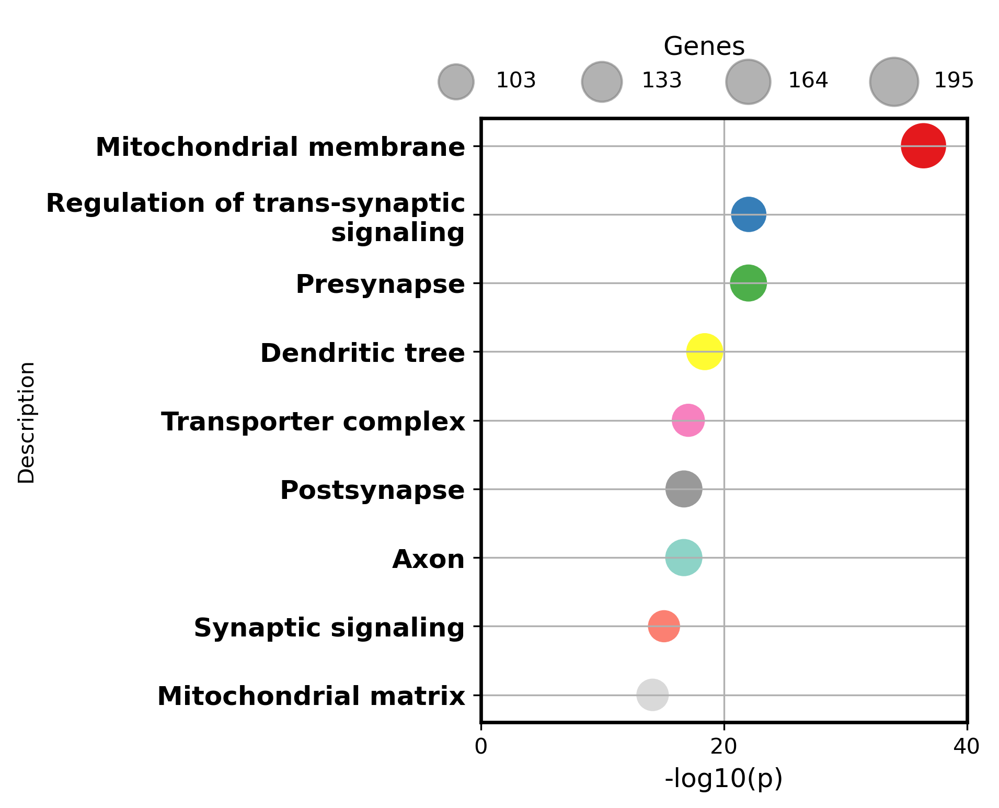

In [16]:
target_strings = ['axon', 'synap', 'example', 'dendritic', 'mito', 'signal'  , 'transporter' , 'carbo']  # Add your specific strings here
FONT = 12
data = pd.read_csv(f'/RAID1/jupytertmp/mi/input_data/metascape_result_summary.csv',  delimiter=';')
pattern = '|'.join(target_strings)

data = data[data['Description'].str.contains(pattern, case=False, na=False)]

data['LogP'] = pd.to_numeric(data['Log10(P)'], errors='coerce')
data['-Log10(P)'] = -data['Log10(P)']
data['Description'] = data['Description'].apply(lambda x: x[0].upper() + x[1:] if pd.notnull(x) and len(x) > 0 else x)
p_values = data['LogP']
num_genes = data['Count']
descriptions = data['Description']


# colors = ['#E4191D', '#367EB8', '#4DAF4A','#984EA3','#FF7F00','#FFFC32','#A65628','#F781BF','#999999','#8DD3C7',
#           '#FFFEB3','#BEBADA','#FB8072','#80B1D3','#FDB562','#B4DE69','#FCCCE4','#D9D9D9','#BC80BD','#CCEBC5']  # Add your desired colors here

colors = ['#E4191D', '#367EB8', '#4DAF4A','#FFFC32','#F781BF','#999999','#8DD3C7','#FB8072','#D9D9D9']  # Add your desired colors here

target_strings = ['axon', 'synap', 'example', 'dendritic', 'mito', 'signal' , 'transporter' , 'carbo']  # Add your specific strings here
plt.subplots_adjust(top=0.55)  # Adjust the top value as needed to move the title up


# plt.figure(figsize=(4, 8))
# g = sns.scatterplot(x="-Log10(P)", y="Description", size="Count", hue="Description",
#                     sizes=(72*2.5, 141*2.5), palette=colors, alpha=1, data=data)



DPI = 300
min_count = data['Count'].min()
max_count = data['Count'].max()
sizes = (min_count*2.5, max_count*2.5)

# Plot the scatter plot with adjusted sizes
plt.figure(figsize=(4, 5), dpi = DPI)
g = sns.scatterplot(
    x="-Log10(P)", 
    y="Description", 
    size="Count", 
    hue="Description",
    sizes=sizes, 
    palette=colors, 
    alpha=1, 
    data=data
)

# Update the representative sizes for the legend to reflect the actual data
representative_sizes = [
    min_count*2.5, 
    (min_count + (max_count - min_count) / 3)*2.5, 
    (min_count + 2 * (max_count - min_count) / 3)*2.5, 
    max_count*2.5
]



g.get_legend().remove()


y_labels = [textwrap.fill(label, 30) for label in data['Description']]  


# for i, label in enumerate(y_labels):
#     if any(target in data['Description'].iloc[i].lower() for target in target_strings):
#         g.get_yticklabels()[i].set_fontweight('bold')
    
  

plt.yticks(range(len(y_labels)), y_labels ,fontsize = FONT , fontweight = 'bold')
#plt.ylabel('Gene Ontology Cluster' , fontsize = FONT)
plt.xlabel('-log10(p)' , fontsize = FONT)
plt.grid(True)
plt.xlim([0,40])




start = min_count * 2.5
end = max_count * 2.5

# Calculate the step size to evenly distribute two numbers between start and end
step_size = (end - start) / 3

# Create the list with three values
representative_sizes = [start, start + step_size, start + 2 * step_size, end]

ax = plt.gca()
legend_ax = ax.inset_axes([0.06, 1.07, 0.8, 0.1], transform = ax.transAxes)  # Adjust as necessary

# Remove all axes and ticks from the legend axis
legend_ax.set_xticks([])
legend_ax.set_yticks([])
legend_ax.spines['top'].set_visible(False)
legend_ax.spines['right'].set_visible(False)
legend_ax.spines['left'].set_visible(False)
legend_ax.spines['bottom'].set_visible(False)



for size in representative_sizes:
    legend_ax.scatter([], [], s=size, color='grey', alpha=0.6, label=f'{int(size/2.5)}' )

# Create the legend and place it at the top center
legend = legend_ax.legend(title="Genes", loc="upper center", ncol=len(representative_sizes), frameon=False)
legend.set_title("Genes", prop={'size': FONT})

# Adjust the position of the legend title to be center
legend._legend_box.align = "center"
ax = plt.gca()  # Get the current Axes instance

# Set the spine linewidth
spine_width = 1.6  # Change this value to your preferred linewidth
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
 

plt.rcParams.update({'font.size': 20})
plt.show()


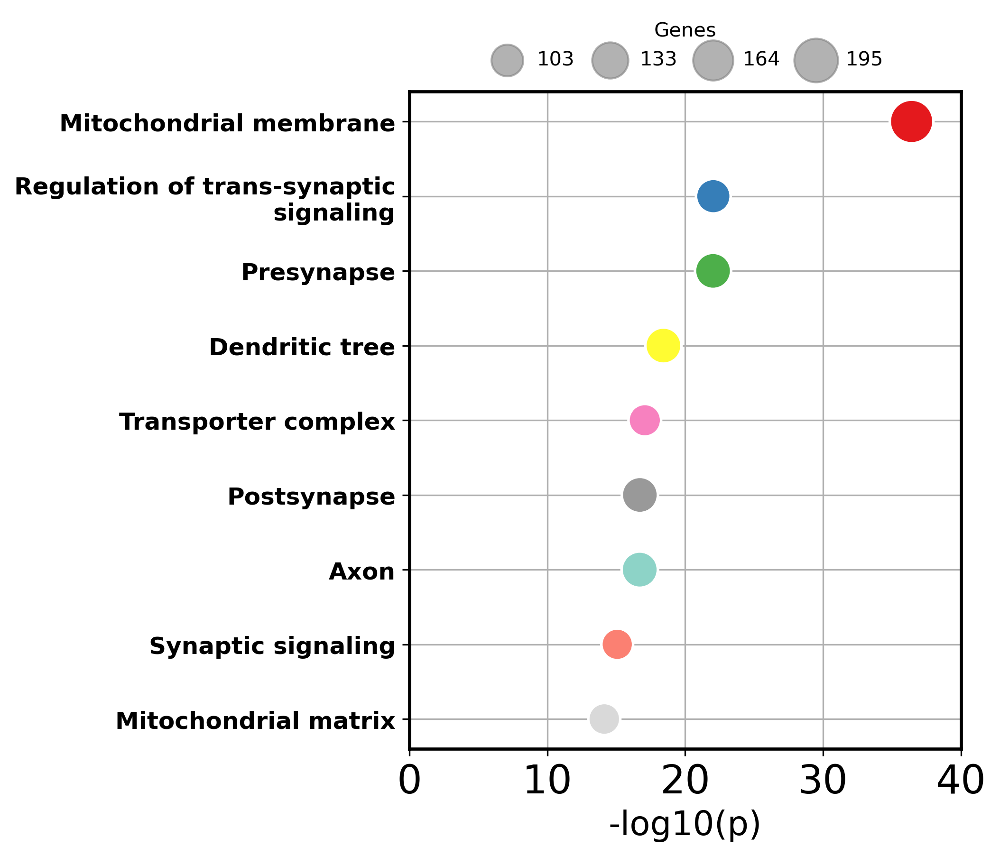

In [35]:
target_strings = ['axon', 'synap', 'example', 'dendritic', 'mito', 'signal'  , 'transporter' , 'carbo']  # Add your specific strings here
FONT = 12
data = pd.read_csv(f'/RAID1/jupytertmp/mi/input_data/metascape_result_summary.csv',  delimiter=';')
pattern = '|'.join(target_strings)

data = data[data['Description'].str.contains(pattern, case=False, na=False)]

data['LogP'] = pd.to_numeric(data['Log10(P)'], errors='coerce')
data['-Log10(P)'] = -data['Log10(P)']
data['Description'] = data['Description'].apply(lambda x: x[0].upper() + x[1:] if pd.notnull(x) and len(x) > 0 else x)
p_values = data['LogP']
num_genes = data['Count']
descriptions = data['Description']


# colors = ['#E4191D', '#367EB8', '#4DAF4A','#984EA3','#FF7F00','#FFFC32','#A65628','#F781BF','#999999','#8DD3C7',
#           '#FFFEB3','#BEBADA','#FB8072','#80B1D3','#FDB562','#B4DE69','#FCCCE4','#D9D9D9','#BC80BD','#CCEBC5']  # Add your desired colors here

colors = ['#E4191D', '#367EB8', '#4DAF4A','#FFFC32','#F781BF','#999999','#8DD3C7','#FB8072','#D9D9D9']  # Add your desired colors here

target_strings = ['axon', 'synap', 'example', 'dendritic', 'mito', 'signal' , 'transporter' , 'carbo']  # Add your specific strings here


# plt.figure(figsize=(4, 8))
# g = sns.scatterplot(x="-Log10(P)", y="Description", size="Count", hue="Description",
#                     sizes=(72*2.5, 141*2.5), palette=colors, alpha=1, data=data)



DPI = 300
min_count = data['Count'].min()
max_count = data['Count'].max()
sizes = (min_count*2.5, max_count*2.5)

start = min_count * 2.5
end = max_count * 2.5
step_size = (end - start) / 3
representative_sizes = [start, start + step_size, start + 2 * step_size, end]



plt.figure(figsize=(5, 6), dpi=DPI)

ax = plt.gca()
ax.set_axisbelow(True)
ax.grid(True)

g = sns.scatterplot(
    x='-Log10(P)',
    y='Description',
    size='Count',
    hue='Description',
    sizes=(start, end),
    palette=colors,
    alpha=1,
    data=data
)

# Remove seaborn’s legend
g.get_legend().remove()

# Wrap long descriptions onto multiple lines
y_labels = [textwrap.fill(desc, 30) for desc in data['Description']]
plt.yticks(range(len(y_labels)), y_labels, fontsize=FONT, fontweight='bold')

plt.xlabel('-log10(p)', fontsize=FONT+5)
plt.ylabel('', fontsize=FONT)
ax.set_axisbelow(True)

plt.xlim([0, 40])

ax = plt.gca()
for spine in ax.spines.values():
    spine.set_linewidth(1.6)

# --- Inset legend above the plotting rectangle ----------
legend_ax = ax.inset_axes([0, 1.03, 1, 0.08], transform=ax.transAxes)
legend_ax.axis('off')
legend_ax.set_zorder(10)


for size in representative_sizes:
    legend_ax.scatter([], [], s=size, color='grey', alpha=0.6,
                      label=f'{int(size/2.5)}', zorder=11)

# Single legend call, centered in the inset, with smaller text
legend = legend_ax.legend(
    title="Genes",
    loc='center',
    bbox_to_anchor=(0.5, 0.5),
    ncol=len(representative_sizes),
    columnspacing=0.8,
    handletextpad=0.5,
    frameon=False,
    prop={'size': FONT-2}
)
legend.set_title("Genes", prop={'size': FONT-2})
legend._legend_box.align = "center"

# --- Save and show ----------
plt.savefig('Figures/Gene_enrichment.png', dpi=300, bbox_inches='tight')
plt.show()


## Fig 4c: synaptic density

<Figure size 1500x1500 with 0 Axes>

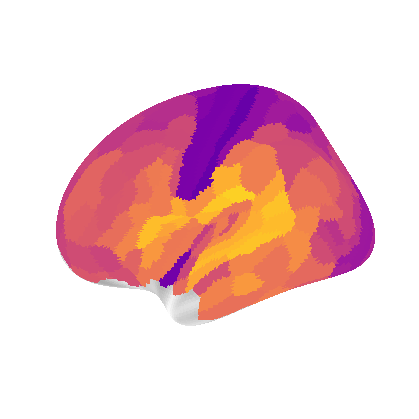

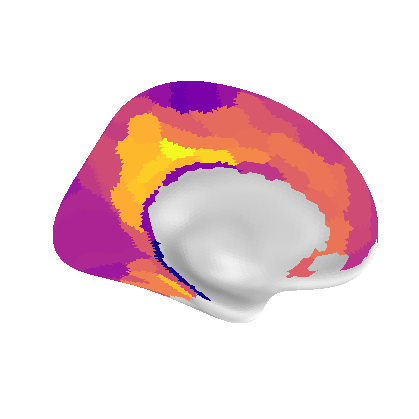

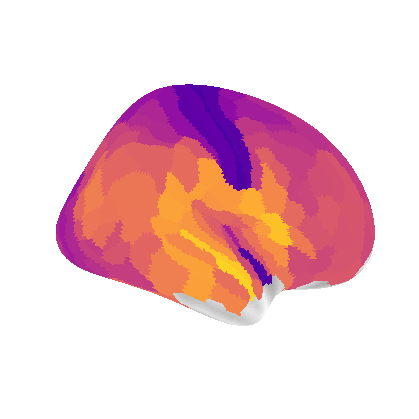

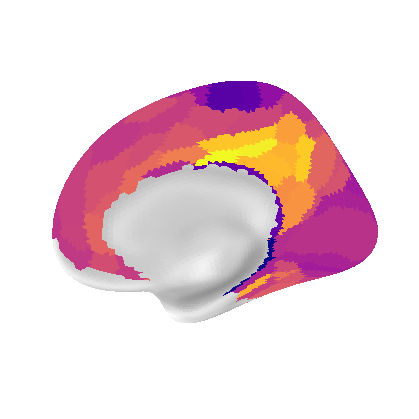

<Figure size 640x480 with 0 Axes>

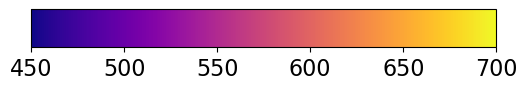

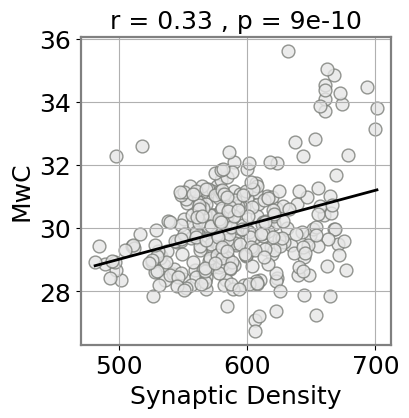

In [19]:

mmp_in_mni_6 = f'/RAID1/jupytertmp/mi/data/mmp_in_mni_6.nii.gz'
atlas_mni6 = nib.load(mmp_in_mni_6)
atlas_data_mni6 = atlas_mni6.get_fdata()

Bmax_mean_mni_img = nib.load(f'/RAID1/jupytertmp/mi/data/SV2a_atlas_Knudsen/Bmax.mean.MNI152.sm5.nii.gz')
Bmax_mean_mni_data  = Bmax_mean_mni_img.get_fdata()


region_labels = np.unique(atlas_data_mni6)
region_labels = region_labels[region_labels > 0]
thr = 0.001

n_regions = len(region_labels)
syn_values = np.zeros(n_regions)


for i, label in enumerate(region_labels):
    
    region_mask = atlas_data_mni6 == label

    region_vals_syn = Bmax_mean_mni_data[region_mask]
    #syn_values[i] = np.median(region_vals_syn)
    syn_values[i] = np.nanmedian(region_vals_syn[region_vals_syn > thr])

syn_values = np.delete(syn_values, limb_ind , axis = 0)


CMAP_IC = 'plasma'

# IC = np.array(DATA_avg.ICallsub_w_avg).reshape(-1, 1)
# V_min = 27
# V_max = 34

IC = np.array(syn_values).reshape(-1, 1)
V_min = 450
V_max = 700

IC_allrois = np.zeros((360,1))
ind = np.arange(360)
mask = np.ones(ind.shape , dtype = bool)
mask[limb_ind] = False
ind = ind[mask]
IC_allrois[ind] = np.abs(IC)


fig = plt.figure(figsize=(5, 5),dpi=300)

fsaverage = datasets.fetch_surf_fsaverage()



col_fsa = parcel_to_surface(IC_allrois,'glasser_360_fsa5') 
col_fsa[col_fsa == 0] = np.nan
col_fsa = np.where(np.isnan(col_fsa), np.nan, np.clip(col_fsa, V_min, V_max))

plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                        
                           hemi='left', vmin= V_min, vmax = V_max, view='lateral',
                           bg_map=fsaverage['sulc_left'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP_IC,colorbar=False)
plt.savefig('Figures/synaptic_den_l_lateral.png', dpi=300, bbox_inches='tight')
plt.show()

 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
                           
                           hemi='left', vmin= V_min, vmax = V_max, view='medial',
                           bg_map=fsaverage['sulc_left'], bg_on_data = False,
                           darkness=0.5,cmap=CMAP_IC,colorbar=False)
plt.savefig('Figures/synaptic_den_l_medial.png', dpi=300, bbox_inches='tight')
plt.show()



plotting.plot_surf_roi(fsaverage['infl_right'], roi_map = col_fsa[int(col_fsa.shape[0]/2):],
                           
                           hemi='right', vmin= V_min, vmax = V_max, view='lateral',
                           bg_map=fsaverage['sulc_right'], bg_on_data=False,
                           darkness=0.5, cmap=CMAP_IC,colorbar=False)
plt.savefig('Figures/synaptic_den_r_lateral.png', dpi=300, bbox_inches='tight')
plt.show()


plotting.plot_surf_roi(fsaverage['infl_right'], roi_map = col_fsa[int(col_fsa.shape[0]/2):],
                           
                           hemi='right', vmin= V_min, vmax = V_max, view='medial',
                           bg_map=fsaverage['sulc_right'], bg_on_data = False,
                           darkness=0.5,cmap=CMAP_IC,colorbar=False)
plt.savefig('Figures/synaptic_den_r_medial.png', dpi=300, bbox_inches='tight')
plt.show()

ticks = np.linspace(V_min, V_max, 6)  
norm = plt.Normalize(vmin= V_min, vmax = V_max)
sm = plt.cm.ScalarMappable(cmap=CMAP, norm=norm)
sm.set_array([]) 
cbar = plt.colorbar(sm, ax=ax, ticks=ticks, orientation='horizontal', pad=0.0001, shrink=0.6)


cmap = plt.get_cmap(CMAP_IC)
norm = plt.Normalize(vmin=V_min, vmax=V_max)

fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

cb = colorbar.ColorbarBase(ax, cmap=cmap, norm=norm, orientation='horizontal')

cb.ax.tick_params(labelsize=16)
plt.savefig('Figures/synaptic_den_colorbar.png', dpi=300, bbox_inches='tight')
plt.show()


#==================================================================
#==================================================================

ind = []
ind = syn_values>400

data = pd.DataFrame({'IC':DATA_avg.ICallsub_w_avg[ind],'syn':syn_values[ind],
                   'pet':DATA_avg.pet_avg[ind], 'deg':DATA_avg.degallsub_w_avg[ind], 'net':net_label['yeo_7_nw'][ind]})

metric = 'IC'



r, p = pearsonr(data['syn'], data[metric])


fig, ax = plt.subplots(figsize=(4,4))

FONT = 18


sns.regplot(
    data = data,
    x= 'syn',
    y= 'IC',
    scatter_kws={
        'facecolors': "#E6E6E6",
        'edgecolor': '#787B76' ,
        'linewidths': 1, 
        's': 85  
    },
    line_kws={
        'color': '#000000',  
        'lw': 2  
    },
    ci=None  # This removes the confidence interval
)


title = "r = {:.2f} , p = {:.0e}".format(float(r) , float(p))
ax.set_title(title , fontdict={'fontsize': FONT})
plt.xlabel('Synaptic Density' , fontsize = FONT)
plt.ylabel('MwC' , fontsize = FONT)
plt.grid(True)


plt.tick_params(axis='both', which='major', labelsize= FONT)  # Increase the tick label font size


ax = plt.gca()  # Get the current Axes instance

# Set the spine linewidth
spine_width = 1.6  # Change this value to your preferred linewidth
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_edgecolor("gray")

plt.savefig('Figures/IC_synaptic_den_scatter.png', dpi=300, bbox_inches='tight')
plt.show()


## Fig 4d: KEGG and beta amyloid

                                               term       p-value  \
0                         Oxidative phosphorylation  2.539531e-12   
1                           Diabetic cardiomyopathy  2.549601e-10   
2                     Pathways of neurodegeneration  6.103960e-10   
3                                Huntington disease  2.279454e-09   
4                                 Parkinson disease  5.173942e-09   
..                                              ...           ...   
68                          Hippo signaling pathway  4.190033e-02   
69  Kaposi sarcoma-associated herpesvirus infection  4.511377e-02   
70                              Platelet activation  4.518329e-02   
71                                      Endocytosis  4.553793e-02   
72   Growth hormone synthesis, secretion and action  4.780299e-02   

         q-value  
0   7.999523e-10  
1   4.015622e-08  
2   6.409158e-08  
3   1.795070e-07  
4   2.955894e-07  
..           ...  
68  1.912841e-01  
69  1.992284e-01  


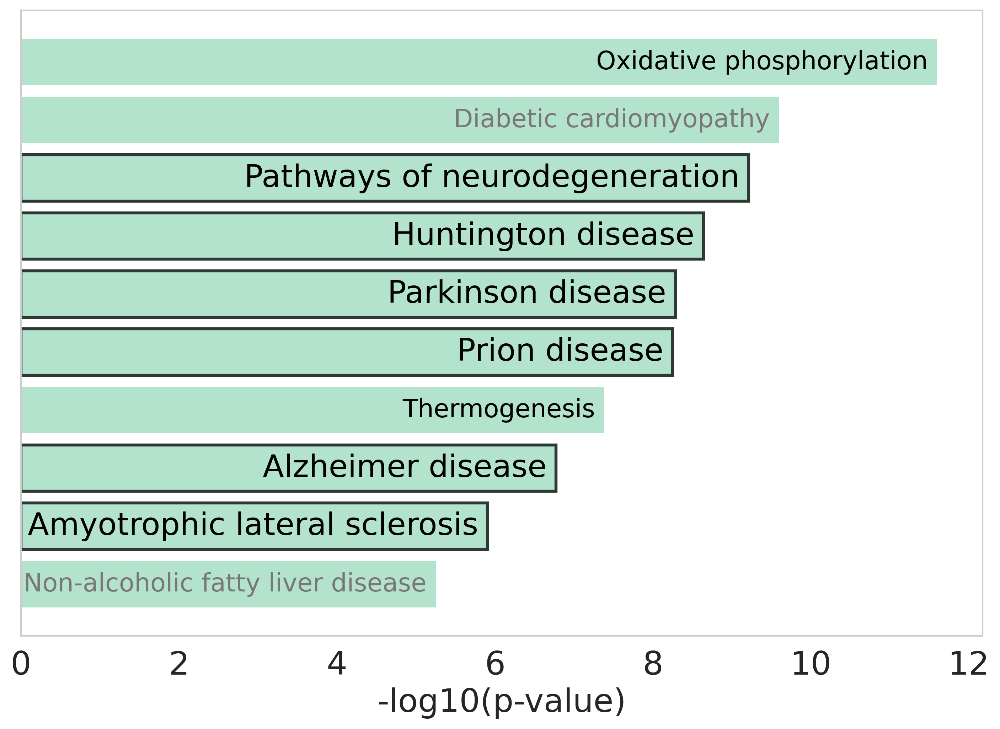

76.00736842105263 7.428851892669101 41 54
(95, 360)
Correlation coefficient: 0.4078383910641556
P-value: 8.111702944909732e-15


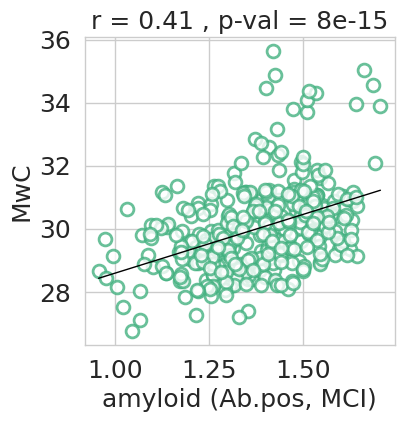

75.45426356589147 7.599459464171601 83 46
(129, 360)
Correlation coefficient: 0.3121311364511986
P-value: 5.566163126455537e-09


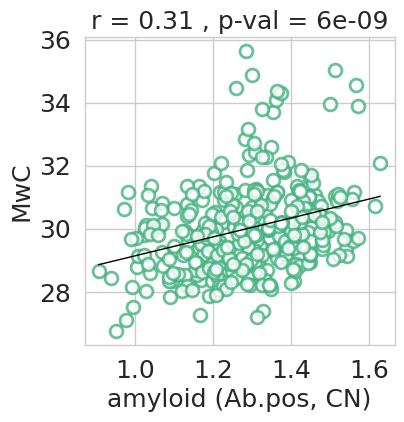

In [195]:
data = pd.read_csv(f'/RAID1/jupytertmp/mi/input_data/Enrichment_Analysis_Visualizer_data_KEGG_enrichr.csv')
print(data)

brain_terms = ['Oxidative phosphorylation','Pathways of neurodegeneration','Huntington disease',
'Parkinson disease','Prion disease','Thermogenesis','Alzheimer disease','Amyotrophic lateral sclerosis']
neurodegen_terms = ['Pathways of neurodegeneration','Huntington disease',
'Parkinson disease','Prion disease','Alzheimer disease','Amyotrophic lateral sclerosis']


subset_data = data.head(10)
subset_data = subset_data.iloc[::-1].reset_index(drop=True)


subset_data['NegLog10P'] = -np.log10(subset_data['p-value'])



plt.figure(figsize=(10, 7), dpi = 300)


bars = plt.barh(subset_data['term'], subset_data['NegLog10P'], color='#B3E2CD')


plt.yticks([])  

gray = '#7A7777'
dark_gray = '#68686A'
black = 'black'
for bar, term, value in zip(bars, subset_data['term'], subset_data['p-value']):
#     text_color = (
#     black if term in neurodegen_terms 
#     else dark_gray if term in brain_terms 
#     else gray

    
# )

    if term in neurodegen_terms:
        bar.set_edgecolor("#2E3834")
        bar.set_linewidth(2)   # adjust thickness as you like
    else:
        bar.set_edgecolor("none")  # keep others without border

    text_color = black if term in brain_terms else gray
    fontweight = 550 if term in neurodegen_terms else 'normal' 
    Font = 21 if term in neurodegen_terms else 17
    plt.text(bar.get_width() - (0.01 * max(subset_data['NegLog10P'])), bar.get_y() + bar.get_height() / 2,
             term, va='center', ha='right', color=text_color, fontsize=Font)
    
   


    
plt.xlabel('-log10(p-value)' , fontsize = FONT+4)
plt.xticks(fontsize=FONT+4)

plt.tight_layout()  
spine_width = 1.6  # Change this value to your preferred linewidth
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
plt.savefig('Figures/KEGG.png', dpi=300, bbox_inches='tight') 
plt.show()


#--------------------------------------------------------------------------------------------
#----------------------         beta-amyloid       -----------------------------------
#-------------------------------------------------------------------------------------------- 
roi_label = pd.read_csv("/RAID1/jupytertmp/mi/input_data/hcp_mmp10_yeo7_modes.csv", delimiter = ';' )

roi_label['ROI_Name'] = roi_label['ROI_Name'].str.replace(r'^R_', 'r', regex=True) \
                                                    .str.replace(r'^L_', 'l', regex=True) \
                                                    .str.replace(r'_ROI$', '', regex=True)

roi_label['ROI_Name'] = roi_label['ROI_Name'].str.replace('-', '.', regex=False)

limb_labels = roi_label.loc[roi_label['ROI_Number'].isin(limb_ind+1), 'ROI_Name']


ad_data = pd.read_csv("/RAID1/jupytertmp/mi/input_data/ADNI_amyloid_tau_PET_MMP1.csv")
ad_data = ad_data.drop_duplicates(subset='ID', keep='first') ## keep the first occurance



centrality ='MwC' # it can be DC or MCC
amyloid_status = 'Ab.pos' # it can be Ab.neg, Ab.pos
DX = 'MCI' #it can be MCI, CN, Dementia
tracer = 'amyloid' #it can be amyloid or tau


if centrality == "MwC":
    IC =  DATA_avg.ICallsub_w_avg
    
else:
    
    IC =  DATA_avg_pr.degallsub_w_avg



mci_amyloid = ad_data[(ad_data['DX'] == DX) & (ad_data['amyloid_status'] == amyloid_status)]
demo = mci_amyloid[['age','sex']]
mean = np.mean(demo['age'])
std = np.std(demo['age'])
fem_num = len(demo[demo['sex']=='female'])
mal_num = len(demo[demo['sex']== 'male'])

print(mean, std, fem_num, mal_num)
ad_amyloid = mci_amyloid.filter(like = tracer + ".SUVR.MMP1" )

print(ad_amyloid.shape)
ad_amyloid_avg = ad_amyloid.mean(axis=0)



ad_amyloid_avg_reset = ad_amyloid_avg.reset_index()
ad_amyloid_avg_reset.columns = ['label', 'value']
ad_amyloid_avg_reset['label'] = ad_amyloid_avg_reset['label'].str.replace(r'.*\.l', 'l', regex=True).str.replace(r'.*\.r', 'r', regex=True)
ad_amyloid_avg_sorted = ad_amyloid_avg_reset.sort_values(by='label', key=lambda col: col.str.startswith('r'))
labels_to_remove = limb_labels
ad_amyloid_avg_sorted = ad_amyloid_avg_sorted[~ad_amyloid_avg_sorted['label'].isin(labels_to_remove)]
ad_amyloid_avg_sorted = ad_amyloid_avg_sorted.reset_index(drop=True)



roi = roi_label["ROI_Name"]
roi = roi.drop(limb_ind, axis = 0)
roi = roi.reset_index(drop = True)
IC_label = pd.DataFrame({"IC": IC, "label": roi})
IC_label['label'] = IC_label['label'].str.replace(r'(.*)_L$', r'l\1', regex=True).str.replace(r'(.*)_R$', r'r\1', regex=True)



ad_amyloid_avg_sorted_aligned = ad_amyloid_avg_sorted.set_index('label')
IC_label_aligned = IC_label.set_index('label')
ad_amyloid_avg_aligned = ad_amyloid_avg_sorted_aligned.reindex(IC_label_aligned.index).reset_index()

ad_IC = pd.DataFrame({
    "IC": IC_label["IC"].values,
    "Amyloid": ad_amyloid_avg_aligned["value"].values,
    "label_IC": IC_label["label"].values,
    "label_AD": ad_amyloid_avg_aligned["label"].values, 
    'Network': net_label["yeo_7_nw"]
    
})





corr_ic_ad, p_ic_ad = pcor(ad_IC['IC'], ad_IC['Amyloid'])

print("Correlation coefficient:", corr_ic_ad)
print("P-value:", p_ic_ad)





COLOR = "#8DD084"
plt.figure(figsize=(4,4))
plt.title = plt.gca().set_title
ax = sns.regplot(
    x=ad_IC['Amyloid'],
    y=ad_IC['IC'],
    scatter_kws={
        'facecolors': "#FFFFFF",
        'edgecolor': '#43B180' ,
        'linewidths': 2, 
        's': 85  
    },
    line_kws={
        'color': '#000000',  
        'lw': 1  
    },
    ci=None  # This removes the confidence interval
)

plt.title("r = {:.2f} , p-val = {:.0e}".format(float(corr_ic_ad), float(p_ic_ad)), fontsize=FONT)
#g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", $Pval_{smash}$ < 0.0001", fontsize=FONT, va='baseline', y=0.8)
#g.fig.suptitle(f"corr = {corr_ic_ad:.2f}, Pval ={p_ic_ad:.5f}", fontsize=FONT, va='baseline', y=0.8)
#g.set_axis_labels('Amyloid', 'MCC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel(tracer + ' (' + amyloid_status + ', ' + DX + ')', fontsize=FONT)
plt.rcParams['axes.edgecolor'] = plt.rcParams['grid.color']
plt.ylabel(centrality, fontsize = FONT)

 
# spine_width = 1.6  
# for spine in ax.spines.values():
#     spine.set_linewidth(spine_width)
    
plt.savefig('Figures/IC_bamyloid_MCI.png', dpi=300, bbox_inches='tight') 
plt.show()





centrality ='MwC' # it can be DC or MCC
amyloid_status = 'Ab.pos' # it can be Ab.neg, Ab.pos
DX = 'CN' #it can be MCI, CN, Dementia
tracer = 'amyloid' #it can be amyloid or tau


if centrality == "MwC":
    IC =  DATA_avg.ICallsub_w_avg
    
else:
    
    IC =  DATA_avg_pr.degallsub_w_avg



mci_amyloid = ad_data[(ad_data['DX'] == DX) & (ad_data['amyloid_status'] == amyloid_status)]
demo = mci_amyloid[['age','sex']]
mean = np.mean(demo['age'])
std = np.std(demo['age'])
fem_num = len(demo[demo['sex']=='female'])
mal_num = len(demo[demo['sex']== 'male'])

print(mean, std, fem_num, mal_num)
ad_amyloid = mci_amyloid.filter(like = tracer + ".SUVR.MMP1" )

print(ad_amyloid.shape)
ad_amyloid_avg = ad_amyloid.mean(axis=0)



ad_amyloid_avg_reset = ad_amyloid_avg.reset_index()
ad_amyloid_avg_reset.columns = ['label', 'value']
ad_amyloid_avg_reset['label'] = ad_amyloid_avg_reset['label'].str.replace(r'.*\.l', 'l', regex=True).str.replace(r'.*\.r', 'r', regex=True)
ad_amyloid_avg_sorted = ad_amyloid_avg_reset.sort_values(by='label', key=lambda col: col.str.startswith('r'))
labels_to_remove = limb_labels
ad_amyloid_avg_sorted = ad_amyloid_avg_sorted[~ad_amyloid_avg_sorted['label'].isin(labels_to_remove)]
ad_amyloid_avg_sorted = ad_amyloid_avg_sorted.reset_index(drop=True)



roi = roi_label["ROI_Name"]
roi = roi.drop(limb_ind, axis = 0)
roi = roi.reset_index(drop = True)
IC_label = pd.DataFrame({"IC": IC, "label": roi})
IC_label['label'] = IC_label['label'].str.replace(r'(.*)_L$', r'l\1', regex=True).str.replace(r'(.*)_R$', r'r\1', regex=True)



ad_amyloid_avg_sorted_aligned = ad_amyloid_avg_sorted.set_index('label')
IC_label_aligned = IC_label.set_index('label')
ad_amyloid_avg_aligned = ad_amyloid_avg_sorted_aligned.reindex(IC_label_aligned.index).reset_index()

ad_IC = pd.DataFrame({
    "IC": IC_label["IC"].values,
    "Amyloid": ad_amyloid_avg_aligned["value"].values,
    "label_IC": IC_label["label"].values,
    "label_AD": ad_amyloid_avg_aligned["label"].values, 
    'Network': net_label["yeo_7_nw"]
    
})





corr_ic_ad, p_ic_ad = pcor(ad_IC['IC'], ad_IC['Amyloid'])

print("Correlation coefficient:", corr_ic_ad)
print("P-value:", p_ic_ad)





COLOR = "#8DD084"
plt.figure(figsize=(4,4))
plt.title = plt.gca().set_title
ax = sns.regplot(
    x=ad_IC['Amyloid'],
    y=ad_IC['IC'],
    scatter_kws={
        'facecolors': "#FFFFFF",
        'edgecolor': '#43B180' ,
        'linewidths': 2, 
        's': 85  
    },
    line_kws={
        'color': '#000000',  
        'lw': 1  
    },
    ci=None  # This removes the confidence interval
)

plt.title("r = {:.2f} , p-val = {:.0e}".format(float(corr_ic_ad), float(p_ic_ad)), fontsize=FONT)
#g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", $Pval_{smash}$ < 0.0001", fontsize=FONT, va='baseline', y=0.8)
#g.fig.suptitle(f"corr = {corr_ic_ad:.2f}, Pval ={p_ic_ad:.5f}", fontsize=FONT, va='baseline', y=0.8)
#g.set_axis_labels('Amyloid', 'MCC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel(tracer + ' (' + amyloid_status + ', ' + DX + ')', fontsize=FONT)
plt.rcParams['axes.edgecolor'] = plt.rcParams['grid.color']
plt.ylabel(centrality, fontsize = FONT)

 
# spine_width = 1.6  
# for spine in ax.spines.values():
#     spine.set_linewidth(spine_width)
    
plt.savefig('Figures/IC_bamyloid_CN.png', dpi=300, bbox_inches='tight') 
plt.show()




## Fig S1: hub details

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  88  90  93
  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 110 111 112
 113 114 115 116 118 120 122 123 124 125 126 127 128 129 131 132 133 135
 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153
 154 155 156 157 158 159 160 161 162 163 166 167 168 169 170 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210
 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228
 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246
 247 248 249 250 251 252 253 254 255 256 257 258 25

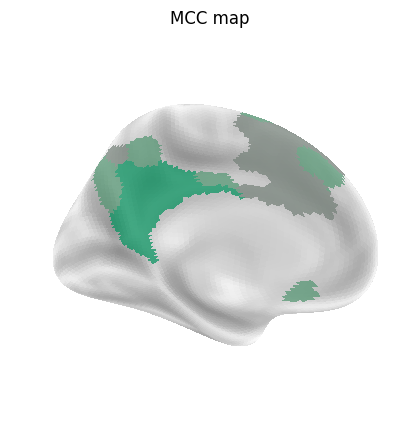

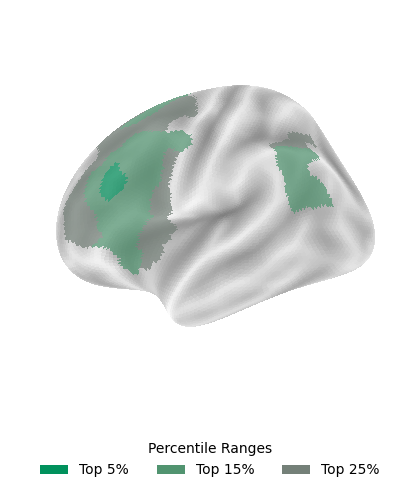

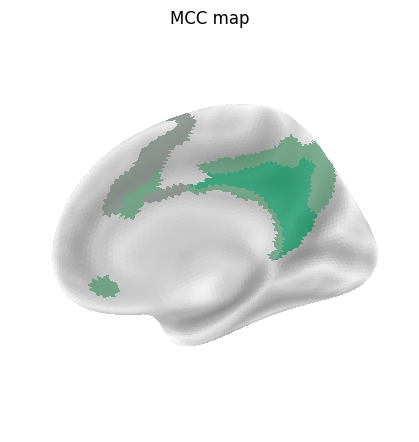

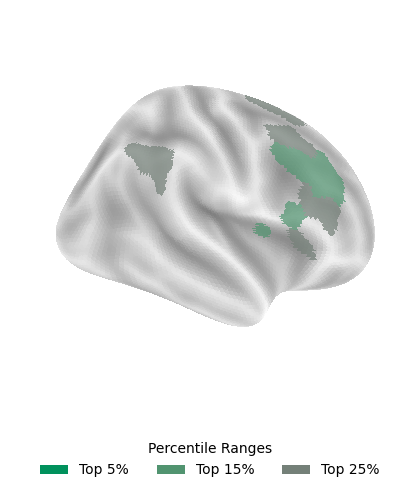

                  cortex   Network   Region  Lobe
14   Posterior_Cingulate   Default   POS2_L   Occ
23        Early_Auditory    SomMot     A1_L  Temp
29   Posterior_Cingulate   Default     7m_L   Par
31   Posterior_Cingulate   Default    23d_L   Par
32   Posterior_Cingulate   Default  v23ab_L   Par
33   Posterior_Cingulate   Default  d23ab_L   Par
34   Posterior_Cingulate   Default   31pv_L   Par
79      Inferior_Frontal  DorsAttn   IFJp_L    Fr
151  Posterior_Cingulate   Default    31a_L   Par
181  Posterior_Cingulate      Cont   POS2_R   Par
190       Early_Auditory    SomMot     A1_R  Temp
196  Posterior_Cingulate   Default     7m_R   Par
198  Posterior_Cingulate   Default    23d_R   Par
200  Posterior_Cingulate   Default  d23ab_R   Par
201  Posterior_Cingulate   Default   31pv_R   Par
317  Posterior_Cingulate   Default    31a_R   Par
327       Early_Auditory    SomMot  LBelt_R  Temp


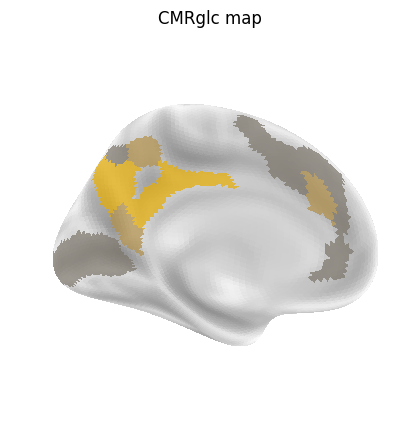

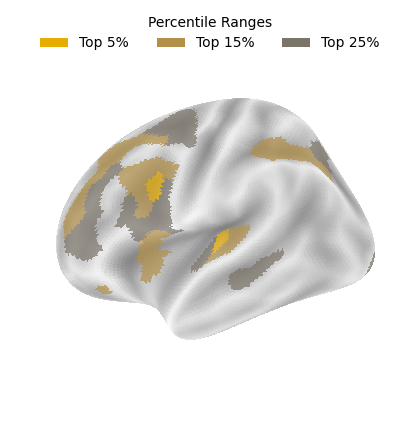

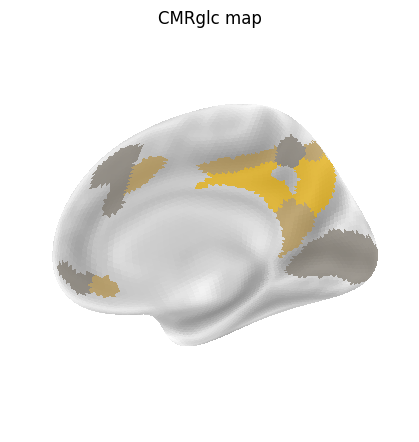

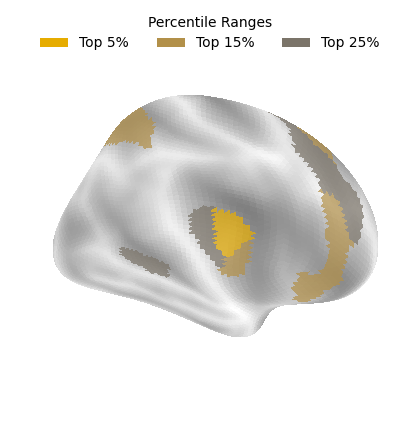

                                    cortex      Network  Region Lobe
0                           Primary_Visual          Vis    V1_L  Occ
3                             Early_Visual          Vis    V2_L  Occ
4                             Early_Visual          Vis    V3_L  Occ
7                  Somatosensory_and_Motor       SomMot     4_L   Fr
14                     Posterior_Cingulate      Default  POS2_L  Occ
16                    Dorsal_Stream_Visual          Vis  IPS1_L  Par
39   Paracentral_Lobular_and_Mid_Cingulate       SomMot  24dd_L   Fr
51                 Somatosensory_and_Motor       SomMot     2_L  Par
167                         Primary_Visual          Vis    V1_R  Occ
170                           Early_Visual          Vis    V2_R  Occ
171                           Early_Visual          Vis    V3_R  Occ
174                Somatosensory_and_Motor       SomMot     4_R   Fr
181                    Posterior_Cingulate         Cont  POS2_R  Par
183                   Dorsal_Strea

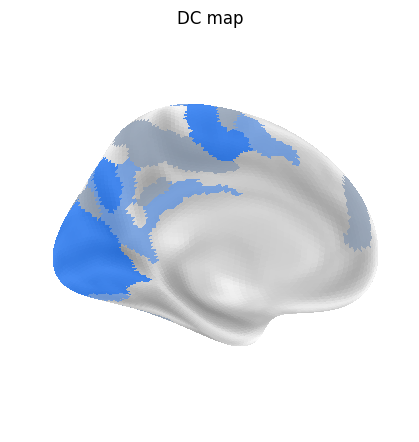

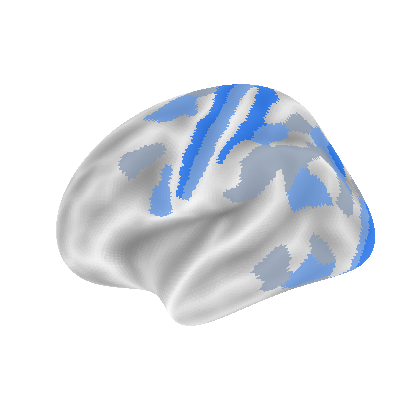

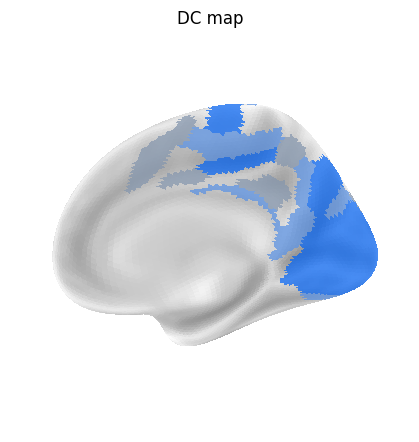

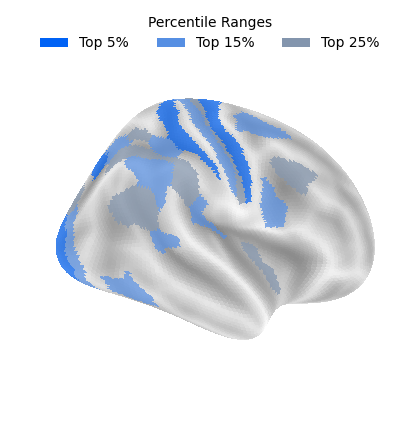

(17, 4)


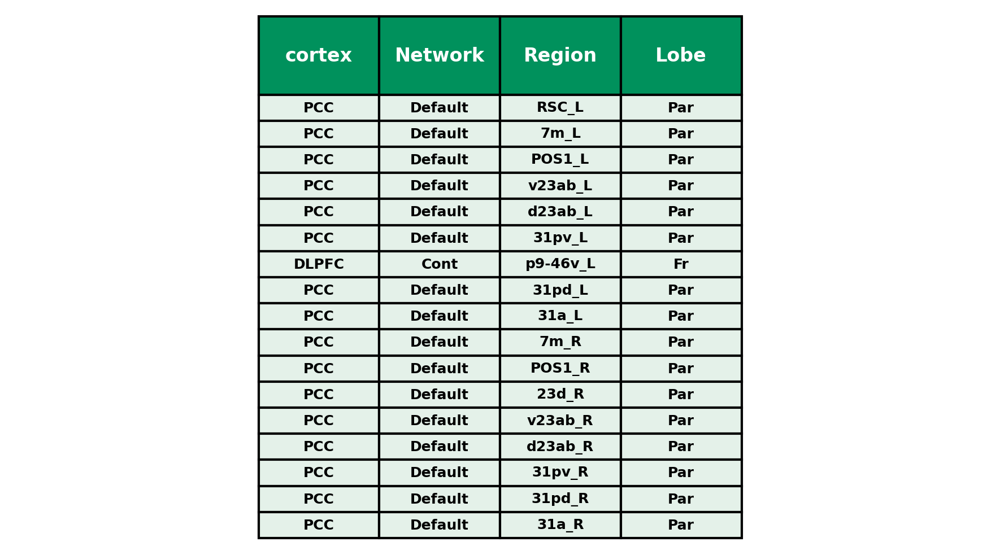

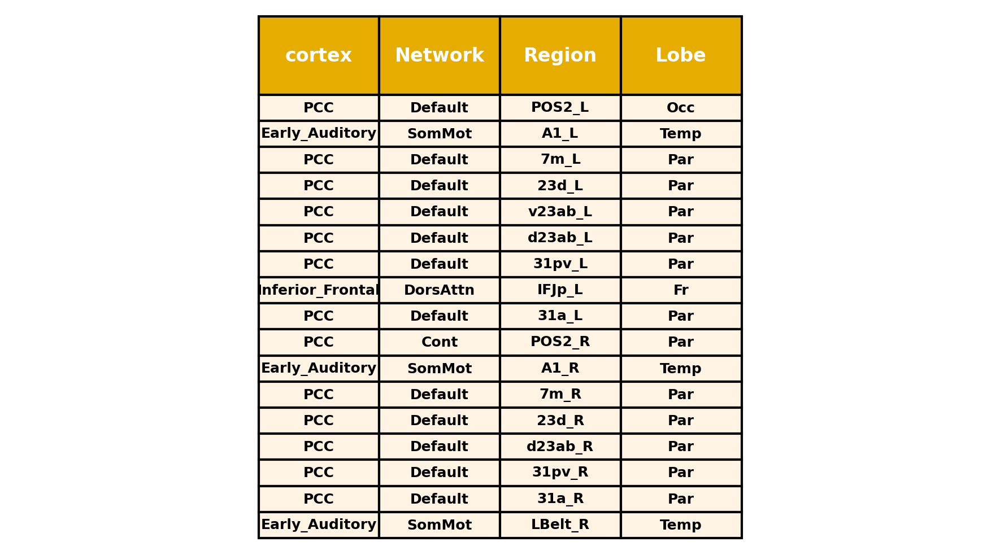

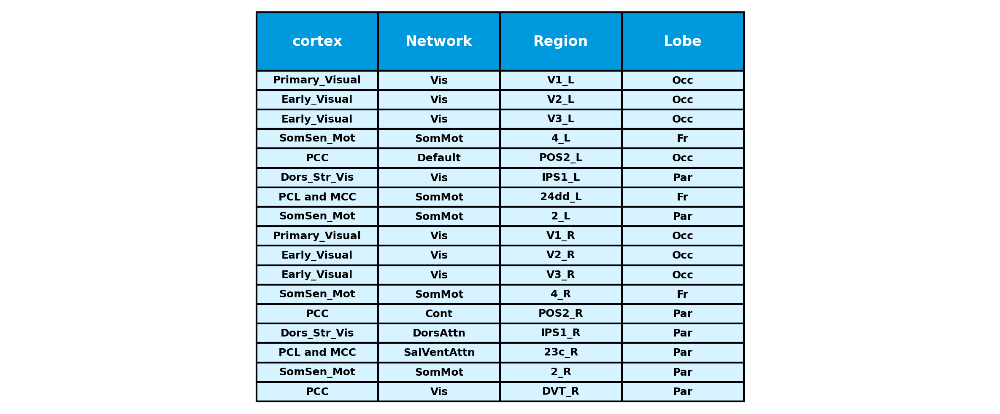

In [8]:
#color_shades1 = ['#049352', '#35AC77', '#6AB392', '#7FA090', '#999A99']
# color_shades2 = ['#830083', '#A643A6', '#B076B0', '#AA87AA', '#B4ABB4']
# color_shades3 = ['#BC2008', '#BB4735', '#C36A5C', '#B98A83', '#B6A8A5']

thr_FC = 0.2
# Conn_Mat = abs(Pearconn_allsub)
#[data_avg_pr, data_single_sub_pr] = IC_calculation(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr_FC, sub_size, scmask, nrois_rem)


# Reset default parameters
plt.rcdefaults()

color_shades1 = ['#00915C','#519470','#748078']
color_shades2 = ['#E6AC00', '#b29049', '#7b7469']
color_shades3 = ['#0062F5', '#568FE3',  '#8395AD']
data = pd.read_csv("/RAID1/jupytertmp/mi/data/HCP-MMP1_UniqueRegionList.csv")
coord = data[["x-cog",'y-cog', 'z-cog']]
coord = coord.drop(limb_ind)
coord = coord.reset_index(drop = True)


# roi_label_l = pd.read_csv("HCPMMP1_on_MNI152_ICBM2009a_nlin.txt")
# roi_label_r = roi_label_l.copy()
# roi_label_r['labels'] = roi_label_r['labels'].str.replace('L_', 'R_')
# roi_label = pd.concat([roi_label_l, roi_label_r], ignore_index=True)
roi_info = data[['cortex']]

roi_info= roi_info.drop(limb_ind)
roi_info = roi_info.reset_index(drop = True)

roi_label = data[['regionName']]
roi_label = roi_label.drop(limb_ind)
roi_label = roi_label.reset_index(drop = True)

roi_label1 = data[['Lobe']]
roi_label1 = roi_label1.drop(limb_ind)
roi_label1 = roi_label1.reset_index(drop = True)

roi_info["Network"] = net_label["yeo_7_nw"]
roi_info["Region"] = roi_label['regionName']
roi_info["Lobe"] = roi_label1['Lobe']






ICmap   = DATA_avg.ICallsub_w_avg
petmap  = DATA_avg.pet_avg

 
# ICmap   = data_avg.ICallsub_w_avg
# petmap  = data_avg.pet_avg


wdegmap = DATA_avg_pr.degallsub_w_avg
bdegmap = DATA_avg_pr.degallsub_b_avg


ICmap = np.array(ICmap).reshape(-1, 1)
petmap = np.array(petmap).reshape(-1, 1)
wdegmap = np.array(wdegmap).reshape(-1, 1)
bdegmap = np.array(bdegmap).reshape(-1, 1)

ind = np.arange(360)
mask = np.ones(ind.shape, dtype=bool)
mask[limb_ind] = False
ind = ind[mask]
print(ind)

#--------------------------------------------------------------------------------------------
#----------------------  regions with strongest IC values -----------------------------------
#-------------------------------------------------------------------------------------------- 


n_shades = 3 

ic_cmap = LinearSegmentedColormap.from_list("ic_shades", color_shades1, N=n_shades)


#percentiles = [95, 90, 85, 80, 75]  
percentiles = [95, 85, 75]  
data_values = np.linspace(1, 5, len(percentiles))  
data = np.zeros_like(ICmap)

for i, percentile in enumerate(percentiles):
    threshold = np.percentile(ICmap, percentile)
    
    
    mask = (ICmap >= threshold) & (data == 0)
   
    
    data[mask] = i + 1  
    
    if percentile == 95:
        
        data_ic = roi_info.loc[mask,:]
        
       
ind = np.arange(360)
mask = np.ones(ind.shape, dtype=bool)
mask[limb_ind] = False
ind = ind[mask]


data_allrois = np.zeros((360,1))
data_allrois[ind] = data


norm = Normalize(vmin=data_values.min(), vmax=data_values.max())




fsaverage = datasets.fetch_surf_fsaverage()


col_fsa = parcel_to_surface(data_allrois, 'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       hemi='left', view='medial', bg_map=fsaverage['sulc_left'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False, 
                       title='MCC map')
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       hemi='left', view='lateral', bg_map=fsaverage['sulc_left'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False)

legend_elements = [
    Patch(facecolor=color_shades1[0], label='Top 5%'),
   # Patch(facecolor=color_shades1[1], label='Top 10%'),
    Patch(facecolor=color_shades1[1], label='Top 15%'),
   # Patch(facecolor=color_shades1[3], label='Top 20%'),
    Patch(facecolor=color_shades1[2], label='Top 25%')
]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.05), 
           title='Percentile Ranges', ncol=len(legend_elements), frameon=False, fancybox=False, framealpha=0)

plt.show()


col_fsa = parcel_to_surface(data_allrois, 'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_right'], roi_map=col_fsa[int(col_fsa.shape[0]/2):],
                       hemi='right', view='medial', bg_map=fsaverage['sulc_right'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False, 
                       title='MCC map')
plotting.plot_surf_roi(fsaverage['infl_right'], roi_map=col_fsa[int(col_fsa.shape[0]/2):],
                       hemi='right', view='lateral', bg_map=fsaverage['sulc_right'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False)

legend_elements = [
    Patch(facecolor=color_shades1[0], label='Top 5%'),
   # Patch(facecolor=color_shades1[1], label='Top 10%'),
    Patch(facecolor=color_shades1[1], label='Top 15%'),
   # Patch(facecolor=color_shades1[3], label='Top 20%'),
    Patch(facecolor=color_shades1[2], label='Top 25%')
]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.05), 
           title='Percentile Ranges', ncol=len(legend_elements), frameon=False, fancybox=False, framealpha=0)

plt.show()





#--------------------------------------------------------------------------------------------
#----------------------  regions with strongest CMRglc values -------------------------------
#-------------------------------------------------------------------------------------------- 


n_shades = 3  
ic_cmap = LinearSegmentedColormap.from_list("ic_shades", color_shades2, N=n_shades)


percentiles = [95,  85, 75]  
data_values = np.linspace(1, 5, len(percentiles))  
data = np.zeros_like(petmap)

for i, percentile in enumerate(percentiles):
    threshold = np.percentile(petmap, percentile)
    mask = (petmap >= threshold) & (data == 0)
    data[mask] = i + 1  
    if percentile == 95:
        data_cmrglc= roi_info.loc[mask,:]
        print(data_cmrglc)


data_allrois = np.zeros((360,1))
data_allrois[ind] = data


norm = Normalize(vmin=data_values.min(), vmax=data_values.max())

fsaverage = datasets.fetch_surf_fsaverage()
col_fsa = parcel_to_surface(data_allrois, 'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       hemi='left', view='medial', bg_map=fsaverage['sulc_left'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False, 
                       title='CMRglc map')
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       hemi='left', view='lateral', bg_map=fsaverage['sulc_left'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False)

legend_elements = [
    Patch(facecolor=color_shades2[0], label='Top 5%'),
   # Patch(facecolor=color_shades2[1], label='Top 10%'),
    Patch(facecolor=color_shades2[1], label='Top 15%'),
  #  Patch(facecolor=color_shades2[3], label='Top 20%'),
    Patch(facecolor=color_shades2[2], label='Top 25%')
]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.05), 
           title='Percentile Ranges', ncol=len(legend_elements), frameon=False)

plt.show()

col_fsa = parcel_to_surface(data_allrois, 'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_right'], roi_map=col_fsa[int(col_fsa.shape[0]/2):],
                       hemi='right', view='medial', bg_map=fsaverage['sulc_right'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False, 
                       title='CMRglc map')
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[int(col_fsa.shape[0]/2):],
                       hemi='right', view='lateral', bg_map=fsaverage['sulc_right'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False)

legend_elements = [
    Patch(facecolor=color_shades2[0], label='Top 5%'),
   # Patch(facecolor=color_shades2[1], label='Top 10%'),
    Patch(facecolor=color_shades2[1], label='Top 15%'),
  #  Patch(facecolor=color_shades2[3], label='Top 20%'),
    Patch(facecolor=color_shades2[2], label='Top 25%')
]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.05), 
           title='Percentile Ranges', ncol=len(legend_elements), frameon=False)

plt.show()

#--------------------------------------------------------------------------------------------
#----------------------  regions with strongest Degree values -------------------------------
#-------------------------------------------------------------------------------------------- 


n_shades = 3  
ic_cmap = LinearSegmentedColormap.from_list("ic_shades", color_shades3, N=n_shades)


percentiles = [95, 85, 75]  
data_values = np.linspace(1, 5, len(percentiles))  
data = np.zeros_like(wdegmap)

for i, percentile in enumerate(percentiles):
    threshold = np.percentile(wdegmap, percentile)
    mask = (wdegmap >= threshold) & (data == 0)
    data[mask] = i + 1  
    if percentile == 95:
        data_degree = roi_info.loc[mask,:]
        print( data_degree)


data_allrois = np.zeros((360,1))
data_allrois[ind] = data


norm = Normalize(vmin=data_values.min(), vmax=data_values.max())

fsaverage = datasets.fetch_surf_fsaverage()
col_fsa = parcel_to_surface(data_allrois, 'glasser_360_fsa5') 
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       hemi='left', view='medial', bg_map=fsaverage['sulc_left'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False, 
                       title='DC map')
plotting.plot_surf_roi(fsaverage['infl_left'], roi_map=col_fsa[:int(col_fsa.shape[0]/2)],
                       hemi='left', view='lateral', bg_map=fsaverage['sulc_left'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False)


plotting.plot_surf_roi(fsaverage['infl_right'], roi_map=col_fsa[int(col_fsa.shape[0]/2):],
                       hemi='right', view='medial', bg_map=fsaverage['sulc_right'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False, 
                       title='DC map')
plotting.plot_surf_roi(fsaverage['infl_right'], roi_map=col_fsa[int(col_fsa.shape[0]/2):],
                       hemi='right', view='lateral', bg_map=fsaverage['sulc_right'],
                       bg_on_data=True, darkness=0.5, cmap=ic_cmap, colorbar = False)

legend_elements = [
    Patch(facecolor=color_shades3[0], label='Top 5%'),
   # Patch(facecolor=color_shades3[1], label='Top 10%'),
    Patch(facecolor=color_shades3[1], label='Top 15%'),
   # Patch(facecolor=color_shades3[3], label='Top 20%'),
    Patch(facecolor=color_shades3[2], label='Top 25%')
]

plt.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.05), 
           title='Percentile Ranges', ncol=len(legend_elements), frameon=False)

plt.show()





data_ic = data_ic.reset_index(drop=True)
data_cmrglc = data_cmrglc.reset_index(drop=True)
data_degree = data_degree.reset_index(drop=True)



#df_combined = pd.concat([data_ic, data_cmrglc, data_degree], axis=1)
df_combined = data_ic
#df_combined = data_cmrglc
#df_combined = data_degree.iloc[:,0:3]
df_combined.replace('Posterior_Cingulate', 'PCC', inplace=True)
df_combined.replace('Somatosensory_and_Motor', 'SomSen_Mot', inplace=True)
df_combined.replace('Dorsolateral_Prefrontal', 'DLPFC', inplace=True)
df_combined.replace('Dorsal_Stream_Visual', 'Dors_Str_Vis', inplace=True)


print(df_combined.shape)

def add_padding(text, padding=1):
    return ' ' * padding + text + ' ' * padding

# Add padding to the cell text
#df_combined = df_combined.applymap(add_padding)



# Define colors for the header and the rest of the rows
k = 1
i = 0
col1  = ['#00915C','#e4f1e9'] 
col2  = ['#E6AC00','#fff4e3'] 
col3  = ['#0199DD','#D6F3FF'] 





number_of_columns = len(df_combined.columns)
col_width = 0.5 / number_of_columns  # Equal width for all columns, adjust as needed
col_widths = [col_width] * number_of_columns  # List of column widths

#--------------------------------------------------------------------------------------------
#----------------------  regions with strongest Degree values -------------------------------
#-------------------------------------------------------------------------------------------- 
df_combined = data_ic
df_combined.replace('Posterior_Cingulate', 'PCC', inplace=True)
df_combined.replace('Somatosensory_and_Motor', 'SomSen_Mot', inplace=True)
df_combined.replace('Dorsolateral_Prefrontal', 'DLPFC', inplace=True)
df_combined.replace('Dorsal_Stream_Visual', 'Dors_Str_Vis', inplace=True)

col = col1
header_colors = [col[i], col[i],col[i],col[i]]#, col2[i], col2[i],col2[i], col3[i], col3[i], col3[i]]
row_colors = [col[k], col[k], col[k], col[k]]#, col2[k], col2[k], col2[k], col3[k], col3[k], col3[k]]


fig, ax = plt.subplots(figsize=(7, 8), dpi=300)
ax.axis('tight')
ax.axis('off')

# Create the table with specified column widths
the_table = ax.table(cellText=df_combined.values,
                     colLabels=df_combined.columns,
                     cellLoc='center',
                     loc='center',
                     colWidths=col_widths)

the_table.auto_set_font_size(False)
the_table.set_fontsize(8)  # Set the font size for all cells

# Set the background color and text properties for header cells
for col, header_color in enumerate(header_colors):
    header_cell = the_table[(0, col)]
    header_cell.set_facecolor(header_color)
    header_cell.set_text_props(color='white', weight='bold', size=8)
    header_cell.set_height(0.3)  # Visually increase the header cell height

# Set the background color and text properties for the rest of the cells
for col, row_color in enumerate(row_colors):
    for row in range(1, len(df_combined) + 1):  # Start from 1 to skip the header
        body_cell = the_table[(row, col)]
        body_cell.set_facecolor(row_color)
        body_cell.set_text_props(color='black', weight='bold', size=6)
        body_cell.set_height(0.1)  # Set a consistent height for the rest of the cells

plt.tight_layout()
plt.show()


#--------------------------------------------------------------------------------------------
#----------------------  regions with strongest Degree values -------------------------------
#-------------------------------------------------------------------------------------------- 
df_combined = data_cmrglc
df_combined.replace('Posterior_Cingulate', 'PCC', inplace=True)
df_combined.replace('Somatosensory_and_Motor', 'SomSen_Mot', inplace=True)
df_combined.replace('Dorsolateral_Prefrontal', 'DLPFC', inplace=True)
df_combined.replace('Dorsal_Stream_Visual', 'Dors_Str_Vis', inplace=True)
df_combined.replace('Paracentral_Lobular_and_Mid_Cingulate', 'Paracentral Lobular Midcingulate', inplace=True)

col = col2
header_colors = [col[i], col[i],col[i],col[i]]#, col2[i], col2[i],col2[i], col3[i], col3[i], col3[i]]
row_colors = [col[k], col[k], col[k], col[k]]#, col2[k], col2[k], col2[k], col3[k], col3[k], col3[k]]


fig, ax = plt.subplots(figsize=(7, 8), dpi=300)
ax.axis('tight')
ax.axis('off')

# Create the table with specified column widths
the_table = ax.table(cellText=df_combined.values,
                     colLabels=df_combined.columns,
                     cellLoc='center',
                     loc='center',
                     colWidths=col_widths)

the_table.auto_set_font_size(False)
the_table.set_fontsize(8)  # Set the font size for all cells

# Set the background color and text properties for header cells
for col, header_color in enumerate(header_colors):
    header_cell = the_table[(0, col)]
    header_cell.set_facecolor(header_color)
    header_cell.set_text_props(color='white', weight='bold', size=8)
    header_cell.set_height(0.3)  # Visually increase the header cell height

# Set the background color and text properties for the rest of the cells
for col, row_color in enumerate(row_colors):
    for row in range(1, len(df_combined) + 1):  # Start from 1 to skip the header
        body_cell = the_table[(row, col)]
        body_cell.set_facecolor(row_color)
        body_cell.set_text_props(color='black', weight='bold', size=6)
        body_cell.set_height(0.1)  # Set a consistent height for the rest of the cells

plt.tight_layout()
plt.show()


#--------------------------------------------------------------------------------------------
#----------------------  regions with strongest Degree values -------------------------------
#-------------------------------------------------------------------------------------------- 
df_combined = data_degree
df_combined.replace('Posterior_Cingulate', 'PCC', inplace=True)
df_combined.replace('Somatosensory_and_Motor', 'SomSen_Mot', inplace=True)
df_combined.replace('Dorsolateral_Prefrontal', 'DLPFC', inplace=True)
df_combined.replace('Dorsal_Stream_Visual', 'Dors_Str_Vis', inplace=True)
df_combined.replace('Paracentral_Lobular_and_Mid_Cingulate', 'PCL and MCC', inplace=True)
df_combined.replace('Inferior_', 'PCL and MCC', inplace=True)


col = col3
header_colors = [col[i], col[i],col[i],col[i]]#, col2[i], col2[i],col2[i], col3[i], col3[i], col3[i]]
row_colors = [col[k], col[k], col[k], col[k]]#, col2[k], col2[k], col2[k], col3[k], col3[k], col3[k]]


fig, ax = plt.subplots(figsize=(7,8), dpi=300)
ax.axis('tight')
ax.axis('off')

# Create the table with specified column widths
the_table = ax.table(cellText=df_combined.values,
                     colLabels=df_combined.columns,
                     cellLoc='center',
                     loc='center',
                     colWidths=col_widths)

the_table.auto_set_font_size(False)
the_table.set_fontsize(8)  # Set the font size for all cells

# Set the background color and text properties for header cells
for col, header_color in enumerate(header_colors):
    header_cell = the_table[(0, col)]
    header_cell.set_facecolor(header_color)
    header_cell.set_text_props(color='white', weight='bold', size=8)
    header_cell.set_height(0.3)  # Visually increase the header cell height

# Set the background color and text properties for the rest of the cells
for col, row_color in enumerate(row_colors):
    for row in range(1, len(df_combined) + 1):  # Start from 1 to skip the header
        body_cell = the_table[(row, col)]
        body_cell.set_facecolor(row_color)
        body_cell.set_text_props(color='black', weight='bold', size=6)
        body_cell.set_height(0.1)  # Set a consistent height for the rest of the cells

plt.tight_layout()
plt.show()

## Fig S2: external data (MwC)

[0.44117397 0.43360211 0.38744463 0.44754671 0.42401501 0.30216833
 0.49360556 0.46120795]


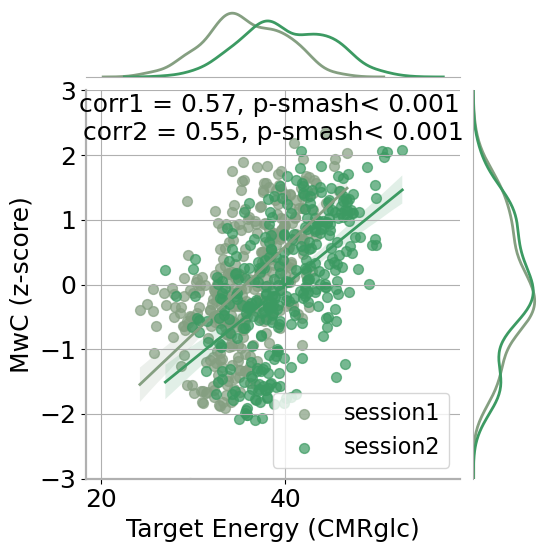

<Figure size 700x700 with 0 Axes>

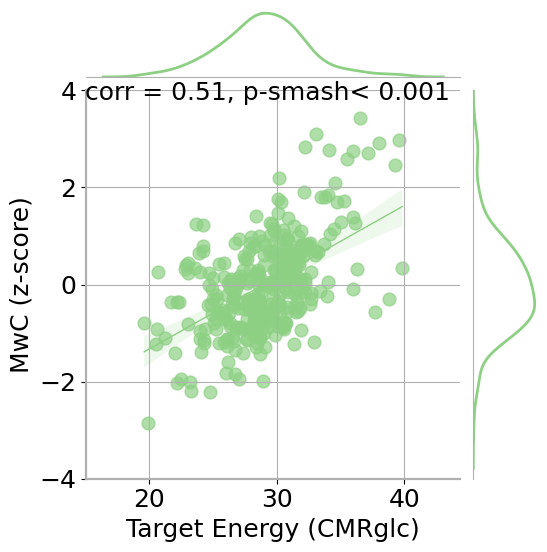

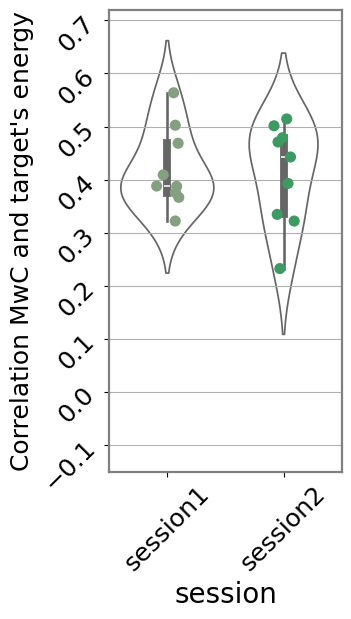

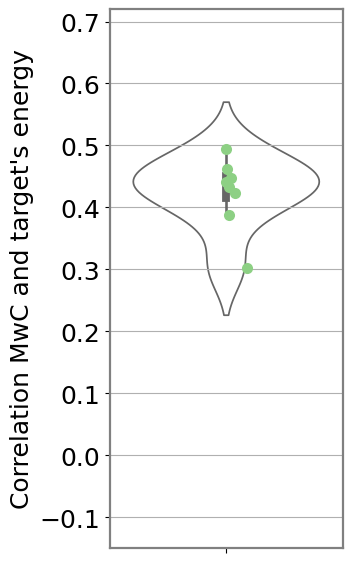

<Figure size 600x400 with 0 Axes>

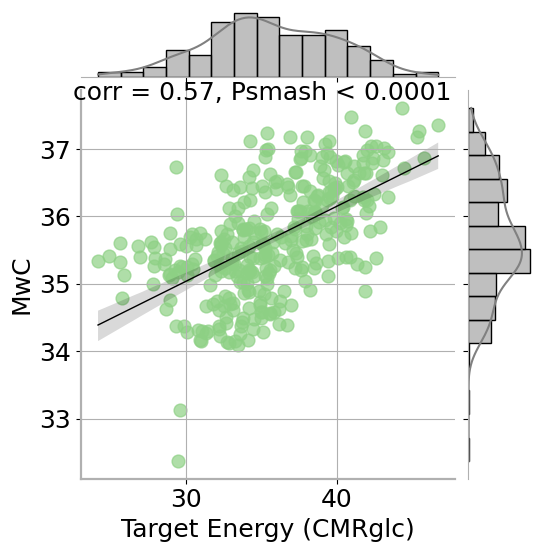

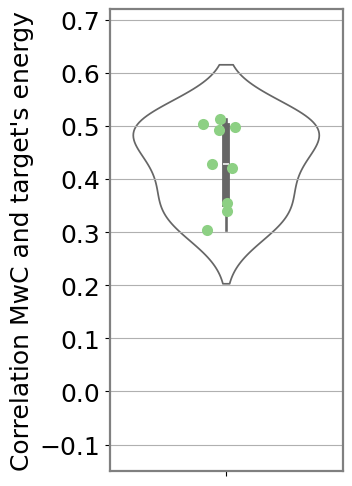

In [64]:
COLOR1 = "#859F81"
COLOR2 = '#3C9A62'

session1 = "m1"
session2 = "m2"
session3 = "ZU"


LIMB = 'without'
data_path = f'/RAID1/jupytertmp/mi/data'






with open(os.path.join(data_path,f'matrices_data_{session1}_{LIMB}_limbic.pkl'), 'rb') as file:
    data_input_ex1 = pickle.load(file)

with open(os.path.join(data_path,f'matrices_data_{session2}_{LIMB}_limbic.pkl'), 'rb') as file:
    data_input_ex2 = pickle.load(file)

with open(os.path.join(data_path,f'matrices_data_{session3}_{LIMB}_limbic.pkl'), 'rb') as file:
    data_input_ex3 = pickle.load(file)



edata_medianallsub_ex1 = data_input_ex1['edata_medianallsub']
edata_medianallsub_ex2 = data_input_ex2['edata_medianallsub']
edata_medianallsub_ex3 = data_input_ex3['edata_medianallsub']

sub_size1 = edata_medianallsub_ex1.shape[1]
sub_size2 = edata_medianallsub_ex2.shape[1]
sub_size3 = edata_medianallsub_ex3.shape[1]

DATA_avg_ex1 = pd.read_csv(os.path.join(data_path,f'DATA_avg_woSC_{session1}_{LIMB}_limb.csv'))
with open(os.path.join(data_path,f'data_single_sub_woSC_{session1}_{LIMB}_limb.pkl'), 'rb') as file:
    data_single_sub_ex1 = pickle.load(file)


DATA_avg_ex2 = pd.read_csv(os.path.join(data_path,f'DATA_avg_woSC_{session2}_{LIMB}_limb.csv'))
with open(os.path.join(data_path,f'data_single_sub_woSC_{session2}_{LIMB}_limb.pkl'), 'rb') as file:
    data_single_sub_ex2 = pickle.load(file)

DATA_avg_ex3 = pd.read_csv(os.path.join(data_path,f'DATA_avg_wSC_{session3}_{LIMB}_limb.csv'))
with open(os.path.join(data_path,f'data_single_sub_wSC_{session3}_{LIMB}_limb.pkl'), 'rb') as file:
    data_single_sub_ex3 = pickle.load(file)


ICallsub_w_ex1 = zscore(data_single_sub_ex1['ICallsub_w'],  nan_policy='omit')
ICallsub_w_ex2 = zscore(data_single_sub_ex2['ICallsub_w'],  nan_policy='omit')
ICallsub_w_ex3 = zscore(data_single_sub_ex3['ICallsub_w'],  nan_policy='omit')


#--------------------------------------------------------------------------------------------
#------------------ SPatial Autocorrelation  -----------------------
#--------------------------------------------------------------------------------------------


LIMB = 'without'
niter = 5000
limb_ind = np.array([88, 90, 92, 93, 110, 118, 120, 122, 131, 135, 165, 166, 172, 268, 270, 272, 273, 290, 298, 300, 302, 311, 314, 315, 346, 352])-1
mode = "IC"


# test_stat_ex1 ,surrogate_brainmap_corrs_ex1,sa_corrected_p_value_ex1,spatially_naive_p_value_ex1  = Spatial_AC(DATA_avg_ex1, mode, LIMB, niter )
# test_stat_ex2 ,surrogate_brainmap_corrs_ex2,sa_corrected_p_value_ex2,spatially_naive_p_value_ex2  = Spatial_AC(DATA_avg_ex2, mode, LIMB, niter )
# test_stat_ex3 ,surrogate_brainmap_corrs_ex3,sa_corrected_p_value_ex3,spatially_naive_p_value_ex3  = Spatial_AC(DATA_avg_ex3, mode, LIMB, niter )


# fig, ax = plt.subplots(figsize=(3, 7))
# plt.grid(True)


# sns.kdeplot(
#     surrogate_brainmap_corrs_ex1,
#     color=COLOR1,
#     fill=False,
#     linewidth=2.5,
#     alpha=0.7,             
#     label="Data Ex1",
#     ax=ax
# )
# ax.axvline(
#     test_stat_ex1,
#     ymin=0, ymax=0.96,
#     color=COLOR1,
#     linestyle='dashed',
#     lw=3
# )


# sns.kdeplot(
#     surrogate_brainmap_corrs_ex2,
#     color=COLOR2,
#     fill=False,
#     linewidth=2.5,
#     alpha=0.7,
#     label="Data Ex2",
#     ax=ax
# )
# ax.axvline(
#     test_stat_ex2,
#     ymin=0, ymax=0.96,
#     color=COLOR2,
#     linestyle='dashed',
#     lw=3
# )


# sns.kdeplot(
#     surrogate_brainmap_corrs_ex3,
#     color=COLOR,
#     fill=False,
#     linewidth=2.5,
#     alpha=0.7,
#     label="Data Ex3",
#     ax=ax
# )
# ax.axvline(
#     test_stat_ex3,
#     ymin=0, ymax=0.96,
#     color=COLOR,
#     linestyle='dashed',
#     lw=3
# )

# ax.set_xticks(np.arange(-1, 1.1, 0.5))
# ax.set_xlim(-0.8, 0.8)


# spine_width = 1.6
# spine_color = 'gray'
# for spine in ax.spines.values():
#     spine.set_linewidth(spine_width)
#     spine.set_color(spine_color)

# plt.tick_params(axis='both', which='major', labelsize=FONT)      
# plt.xlabel('Correlation', fontsize=FONT)
# plt.ylabel('Density', fontsize=FONT)
# plt.show()

#--------------------------------------------------------------------------------------------
#------------------ scatter IC_avg , CMRglc_avg / group analysis ----------------------------
#--------------------------------------------------------------------------------------------
data_ex1_z = pd.DataFrame({'pet_avg':DATA_avg_ex1['pet_avg'], 'ICallsub_w_avg':zscore(DATA_avg_ex1['ICallsub_w_avg'],  nan_policy='omit'),
                          'degallsub_w_avg':zscore(DATA_avg_ex1['degallsub_w_avg'],  nan_policy='omit')})
data_ex2_z = pd.DataFrame({'pet_avg':DATA_avg_ex2['pet_avg'], 'ICallsub_w_avg':zscore(DATA_avg_ex2['ICallsub_w_avg'],  nan_policy='omit'),
                           'degallsub_w_avg':zscore(DATA_avg_ex2['degallsub_w_avg'],  nan_policy='omit')})
data_ex3_z = pd.DataFrame({'pet_avg':DATA_avg_ex3['pet_avg'], 'ICallsub_w_avg':zscore(DATA_avg_ex3['ICallsub_w_avg'],  nan_policy='omit'),
                           'degallsub_w_avg':zscore(DATA_avg_ex3['degallsub_w_avg'],  nan_policy='omit')})

corr_IC_w_E_ex1, p_IC_w_E_ex1 = pcor(data_ex1_z.ICallsub_w_avg, data_ex1_z.pet_avg)
corr_IC_w_deg_ex1, p_IC_w_deg_ex1 = pcor(data_ex1_z.ICallsub_w_avg, data_ex1_z.degallsub_w_avg)

corr_IC_w_E_ex2, p_IC_w_E_ex2 = pcor(data_ex2_z.ICallsub_w_avg, data_ex2_z.pet_avg)
corr_IC_w_deg_ex2, p_IC_w_deg_ex2 = pcor(data_ex2_z.ICallsub_w_avg, data_ex2_z.degallsub_w_avg)

corr_IC_w_E_ex3, p_IC_w_E_ex3 = pcor(data_ex3_z.ICallsub_w_avg, data_ex3_z.pet_avg)
corr_IC_w_deg_ex3, p_IC_w_deg_ex3 = pcor(data_ex3_z.ICallsub_w_avg, data_ex3_z.degallsub_w_avg)


corr_IC_E_allsub_ex1 = np.zeros((sub_size1))
p_IC_E_allsub_ex1 = np.zeros((sub_size1))

corr_IC_E_allsub_ex2 = np.zeros((sub_size2))
p_IC_E_allsub_ex2 = np.zeros((sub_size2))

corr_IC_E_allsub_ex3 = np.zeros((sub_size3))
p_IC_E_allsub_ex3 = np.zeros((sub_size3))

for j in range(sub_size1):
   
                             
    corr_IC_E_allsub_ex1[j], p_IC_E_allsub_ex1[j] = pcor(ICallsub_w_ex1[:, j], edata_medianallsub_ex1[:, j])

for j in range(sub_size2):
    corr_IC_E_allsub_ex2[j], p_IC_E_allsub_ex2[j] = pcor(ICallsub_w_ex2[:, j], edata_medianallsub_ex2[:, j])

for j in range(sub_size3):
    corr_IC_E_allsub_ex3[j], p_IC_E_allsub_ex3[j] = pcor(ICallsub_w_ex3[:, j], edata_medianallsub_ex3[:, j])

print(corr_IC_E_allsub_ex3)




g = sns.jointplot(
    data=data_ex1_z, x='pet_avg', y='ICallsub_w_avg', kind="reg",
    scatter_kws={'s': 50, 'alpha': 0.7, 'facecolors': COLOR1, 'edgecolors': COLOR1},
    line_kws={'color': COLOR1, 'lw': 2},
    color=COLOR1, label="session1", marginal_ticks=False
)

g.ax_marg_x.clear()
g.ax_marg_y.clear()


g.ax_marg_x.tick_params(
    axis='both',       
    which='both',      
    bottom=False,      
    labelbottom=False, 
    left=False,        
    labelleft=False  
)


g.ax_marg_y.tick_params(
    axis='both',
    which='both',
    left=False,
    labelleft=False,
    bottom=False,
    labelbottom=False
)



sns.regplot(
    data=data_ex2_z, x='pet_avg', y='ICallsub_w_avg',
    scatter_kws={'s': 50, 'alpha': 0.7, 'facecolors': COLOR2, 'edgecolors': COLOR2},
    line_kws={'color': COLOR2, 'lw': 2},
    color=COLOR2, ax=g.ax_joint, label="session2"
)


sns.kdeplot(data=data_ex1_z, x='pet_avg', ax=g.ax_marg_x, color=COLOR1, lw=2, label="Session 1", fill=False)
sns.kdeplot(data=data_ex2_z, x='pet_avg', ax=g.ax_marg_x, color=COLOR2, lw=2, label="Session 2", fill=False)
sns.kdeplot(data=data_ex1_z, y='ICallsub_w_avg', ax=g.ax_marg_y, color=COLOR1, lw=2, label="Session 1", fill=False)
sns.kdeplot(data=data_ex2_z, y='ICallsub_w_avg', ax=g.ax_marg_y, color=COLOR2, lw=2, label="Session 2", fill=False)


g.ax_marg_x.set_ylabel("")  
g.ax_marg_y.set_xlabel("")  
g.ax_joint.set_xlabel('Target Energy (CMRglc)', fontsize=FONT)
g.ax_joint.set_ylabel('MwC (z-score)', fontsize=FONT)
g.ax_joint.set_ylim([-3,3])
g.ax_joint.set_title(
    f"corr1 = {corr_IC_w_E_ex1:.2f}, p-smash< 0.001 \n"
    f"corr2 = {corr_IC_w_E_ex2:.2f}, p-smash< 0.001",
    fontsize=FONT, va='baseline', y=0.85
)
plt.grid(True)
g.ax_joint.tick_params(axis='both', which='major', labelsize=FONT)


spine_width = 1.6
for spine in g.ax_joint.spines.values():
    spine.set_linewidth(spine_width)

g.ax_joint.legend(fontsize=FONT-2, loc="lower right")
plt.savefig('Figures/ext_IC_CMRglc_wien.png', dpi=300, bbox_inches='tight')
plt.show()



plt.figure(figsize=(7,7))
g = sns.jointplot(data=data_ex3_z, x='pet_avg', y='ICallsub_w_avg', kind="reg", color=COLOR,
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': COLOR, 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':COLOR, 'edgecolors':COLOR}  ) 




g.ax_marg_x.clear()
g.ax_marg_y.clear()


g.ax_marg_x.tick_params(
    axis='both',       
    which='both',      
    bottom=False,      
    labelbottom=False, 
    left=False,        
    labelleft=False  
)


g.ax_marg_y.tick_params(
    axis='both',
    which='both',
    left=False,
    labelleft=False,
    bottom=False,
    labelbottom=False
)

sns.kdeplot(data=data_ex3_z, x='pet_avg', ax=g.ax_marg_x, color=COLOR, lw=2, fill=False)
sns.kdeplot(data=data_ex3_z, y='ICallsub_w_avg', ax=g.ax_marg_y, color=COLOR, lw=2 ,fill=False)

title = f"corr = {corr_IC_w_E_ex3:.2f}, p-smash< 0.001"
g.fig.suptitle(title, fontsize=FONT, va='baseline', y=0.8)
g.set_axis_labels('Target Energy', 'MCC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel('Target Energy (CMRglc)', fontsize = FONT)
plt.ylabel('MwC (z-score)', fontsize = FONT)
plt.ylim([-4,4])
ax =  g.ax_joint  
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    
plt.savefig('Figures/ext_IC_CMRglc_ZU.png', dpi=300, bbox_inches='tight')
plt.show()


#--------------------------------------------------------------------------------------------
#------------------ Box plot individual correlation between IC and E  -----------------------
#--------------------------------------------------------------------------------------------

group_colors = [COLOR1, COLOR2]
data = pd.DataFrame({
    'corr': np.concatenate([corr_IC_E_allsub_ex1, corr_IC_E_allsub_ex2]),
    'session': ['session1'] * sub_size1+ ['session2'] * sub_size2,
    'pval' : np.concatenate([p_IC_E_allsub_ex1, p_IC_E_allsub_ex2])
})

fig, ax = plt.subplots(figsize=(3, 6))
plt.grid(True)
violin = sns.violinplot(data=data, x = 'session', y='corr', ax=ax, color = COLOR)
violin.collections[0].set_facecolor('none')
violin.collections[1].set_facecolor('none')
sns.stripplot(data=data[data['pval'] < 0.05], x='session', y='corr', hue='session', palette=group_colors, size=8, ax=ax, jitter=True, label="p < 0.05")
sns.stripplot(data=data[data['pval'] >= 0.05], x='session', y='corr', color='red', size=8, ax=ax, jitter=True, label="p >= 0.05")
ax.set_ylabel('Correlation MwC and target\'s energy', fontsize = FONT)
ax.set_ylim([-0.15,0.72])
plt.tick_params(axis='both', which='major', labelsize= FONT, rotation = 45)  

spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)

plt.savefig('Figures/ext_box_IC_CMRglc_wien.png', dpi=300, bbox_inches='tight')  
plt.show()

data = pd.DataFrame({'corr': corr_IC_E_allsub_ex3, 'pval': p_IC_E_allsub_ex3})
fig, ax = plt.subplots(figsize=(3, 7))
plt.grid(True)
violin = sns.violinplot(data=data, y='corr', ax=ax, color = COLOR)
violin.collections[0].set_facecolor('none')
sns.stripplot(data=data[data['pval'] < 0.05], y='corr', color=COLOR , size = 8, ax=ax)
sns.stripplot(data=data[data['pval'] >= 0.05], y='corr', color='red' , size = 8, ax=ax)
ax.set_ylabel('Correlation MwC and target\'s energy', fontsize = FONT)
ax.set_ylim([-0.15,0.72])
plt.tick_params(axis='both', which='major', labelsize= FONT)  

spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)

plt.savefig('Figures/ext_box_IC_CMRglc_zu.png', dpi=300, bbox_inches='tight')    
plt.show()
















COLOR = "#8DD084"
session = "m2" # or "m1"
DIR = f'/RAID1/jupytertmp/mi/{session}/'
sub = os.listdir(DIR)
sub = sorted([int(s.split('-')[1]) for s in sub if s.startswith('sub-') and s.split('-')[1].isdigit()])
#data_input_ex = Functional_conn(DIR, sub, limb_ind, nrois)
data_input_ex = data_input_ex1
num_voxels = data_input_ex['num_voxels']
MIconn_allsub = data_input_ex['MIconn_allsub']
Pearconn_allsub = data_input_ex['Pearconn_allsub']
edata_medianallsub = data_input['edata_medianallsub']
edata_medianallsub_rem = edata_medianallsub
SCconn_allsub = np.ones_like(Pearconn_allsub)
nrois_rem = nrois - len(limb_ind) 
thr_sc = 0.1
sub_size = MIconn_allsub.shape[2]
scmask = 0    
MIconn_allsub[MIconn_allsub < 0.01] = 0
thr_FC = 1
Conn_Mat = MIconn_allsub

#[data_avg_ex, data_single_sub_ex] = IC_calculation(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr_FC, sub_size, scmask, nrois_rem)
#DATA_avg = pd.concat([data_avg , net_label], axis =1)
DATA_avg = DATA_avg_ex1
ICallsub_w = data_single_sub['ICallsub_w']


#--------------------------------------------------------------------------------------------
#------------------ scatter IC_avg , CMRglc_avg / group analysis ----------------------------
#--------------------------------------------------------------------------------------------

#organg = [255/255,164/255,0/255]
corr_IC_w_E, p_IC_w_E = pcor(DATA_avg.ICallsub_w_avg, DATA_avg.pet_avg)
corr_IC_w_deg, p_IC_w_deg = pcor(DATA_avg.ICallsub_w_avg, DATA_avg.degallsub_w_avg)

sub_size = len(sub)
corr_IC_E_allsub = np.zeros((sub_size))
p_IC_E_allsub = np.zeros((sub_size))

for j in range(sub_size):
                             
    corr_IC_E_allsub[j], p_IC_E_allsub[j] = pcor(ICallsub_w[:, j], edata_medianallsub_rem[:, j])


COLOR = "#8DD084"
plt.figure(figsize=(6,4))

g = sns.jointplot(data=DATA_avg, x='pet_avg', y='ICallsub_w_avg', kind="reg", color=COLOR,
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': 'black', 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':COLOR, 'edgecolors':COLOR}  ) 





title = "corr = {:.2f} , p-val = {:.0e}".format(float(corr_IC_w_E), float(p_IC_w_E))
#g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", $Pval_{smash}$ < 0.0001", fontsize=FONT, va='baseline', y=0.8)
g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", Psmash < 0.0001", fontsize=FONT, va='baseline', y=0.8)
g.set_axis_labels('Target Energy', 'MCC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel('Target Energy (CMRglc)', fontsize = FONT)
plt.ylabel('MwC', fontsize = FONT)

ax =  g.ax_joint  
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    

plt.show()


#--------------------------------------------------------------------------------------------
#------------------ Box plot individual correlation between IC and E  -----------------------
#--------------------------------------------------------------------------------------------

data = pd.DataFrame({'corr': corr_IC_E_allsub, 'pval': p_IC_E_allsub})
fig, ax = plt.subplots(figsize=(3, 6))
plt.grid(True)
violin = sns.violinplot(data=data, y='corr', ax=ax, color = COLOR)
violin.collections[0].set_facecolor('none')
sns.stripplot(data=data[data['pval'] < 0.05], y='corr', color=COLOR , size = 8, ax=ax)
sns.stripplot(data=data[data['pval'] >= 0.05], y='corr', color='red' , size = 8, ax=ax)
ax.set_ylabel('Correlation MwC and target\'s energy', fontsize = FONT)
ax.set_ylim([-0.15,0.72])
plt.tick_params(axis='both', which='major', labelsize= FONT)  

spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)

    
plt.show()






## Fig S3: participation coefficient

In [ ]:
import matplotlib as mpl
method = 'infomap'
PC_COLOR = '#7DA3DA'

pc_allmethods_avg = {method: np.mean(pc_matrix, axis=1) for method, pc_matrix in all_pc.items()}

# for i in range(len(methods_labels)):
#     cor , p = pearsonr(DATA_avg.pet_avg, pc_allmethods_avg[methods_labels[i]] )
#     print(methods_labels[i], cor, p)
#     plt.scatter(x = DATA_avg.pet_avg , y = pc_allmethods_avg[methods_labels[i]] )
#     plt.show()

data_pc_avg = pd.DataFrame({'pet_avg': DATA_avg.pet_avg, 'PCallsub_w_avg': pc_allmethods_avg[method], 'ICallsub_w_avg': DATA_avg.ICallsub_w_avg})
ind = data_pc_avg['PCallsub_w_avg']>0
#data_pc_avg = pd.DataFrame({'pet_avg': DATA_avg.pet_avg, 'PCallsub_w_avg': bg.pc, 'ICallsub_w_avg': DATA_avg.ICallsub_w_avg})
corr_PC_w_E, p_PC_w_E = pcor(data_pc_avg.PCallsub_w_avg[ind], data_pc_avg.pet_avg[ind])




#--------------------------------------------------------------------------------------------
#--------------------------- brain smash                  -----------------------------------
#--------------------------------------------------------------------------------------------



niter = 500
limb_ind = np.array([88, 90, 92, 93, 110, 118, 120, 122, 131, 135, 165, 166, 172, 268, 270, 272, 273, 290, 298, 300, 302, 311, 314, 315, 346, 352])-1
COLOR = PC_COLOR
mode = "PC"


input_data = data_pc_avg
#test_stat ,surrogate_brainmap_corrs,sa_corrected_p_value,spatially_naive_p_value  = Spatial_AC(input_data , mode, LIMB, niter )

sac1 = '#0199DD' 
sac2 = '#8CCF83'
sac3 = '#FEAD01'






fig, ax = plt.subplots(figsize=(3, 7))

plt.grid(True)
g = sns.kdeplot(surrogate_brainmap_corrs, color= "#E0E0E0", ax=ax, fill= True, linewidth=2.5 )

ax.axvline(test_stat, 0, 0.96, color= COLOR, linestyle='dashed', lw=3)

    
ax.set_xticks(np.arange(-1, 1.1, 0.5))
#ax.set_ylim(0, 1.7)
ax.set_xlim(-0.8, 0.8)
#ax.text(0.5, -0.1, "Pearson correlation\nwith IE map", ha='center', va='top', transform=ax.transAxes)
spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)


plt.tick_params(axis='both', which='major', labelsize= FONT)      
plt.xlabel('Correlation', fontsize = FONT)
plt.ylabel('Density', fontsize = FONT)
plt.show()


#--------------------------------------------------------------------------------------------
#--------------------------- group level: scatter plot CMRglc and PC  -----------------------------------
#--------------------------------------------------------------------------------------------


plt.figure(figsize=(6,4))
g = sns.jointplot(data=data_pc_avg, x='pet_avg', y='PCallsub_w_avg', kind="reg", color=PC_COLOR,
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': 'black', 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':PC_COLOR, 'edgecolors':PC_COLOR}  ) 


p_PC_w_E_smash = sa_corrected_p_value

if p_PC_w_E_smash < 0.0001:
     title = "corr = {:.2f} , psmash<  {:.0e}".format(float(corr_PC_w_E), float(0.001))
else:
    title = "corr = {:.2f} , p-val = {:.0e}".format(float(corr_PC_w_E), float(p_PC_w_E_smash))
    
#g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", $Pval_{smash}$ < 0.001", fontsize=FONT, va='baseline', y=0.8)
g.fig.suptitle(title, fontsize=FONT, va='baseline', y=0.8)
g.set_axis_labels('Target Energy', 'PC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel('Target Energy (CMRglc)', fontsize = FONT)
plt.ylabel('PC', fontsize = FONT)

ax =  g.ax_joint  
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    

plt.show()



#--------------------------------------------------------------------------------------------
#--------------------------- subject level: box plot CMRglc and PC  -----------------------------------
#--------------------------------------------------------------------------------------------


corr_PC_E_allsub = np.zeros((sub_size))
p_PC_E_allsub = np.zeros((sub_size))

for j in range(sub_size):                             
    
    corr_PC_E_allsub[j], p_PC_E_allsub[j] = pcor(all_pc[method][:, j], edata_medianallsub_rem[:, j])
    

    

data = pd.DataFrame({'corr': corr_PC_E_allsub, 'pval': p_PC_E_allsub})
fig, ax = plt.subplots(figsize=(3, 7))
plt.grid(True)
violin = sns.violinplot(data=data, y='corr', ax=ax, color = PC_COLOR)
violin.collections[0].set_facecolor('none')
sns.stripplot(data=data[data['pval'] < 0.05], y='corr', color=PC_COLOR , size = 8, ax=ax)
sns.stripplot(data=data[data['pval'] >= 0.05], y='corr', color='red' , size = 8, ax=ax)
ax.set_ylabel('Correlation PC and target\'s energy', fontsize = FONT)
ax.set_ylim([-0.15,0.72])
plt.tick_params(axis='both', which='major', labelsize= FONT)  

spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)

    
plt.show()





#--------------------------------------------------------------------------------------------
#--------------------------- PC map on the brain surface  -----------------------------------
#--------------------------------------------------------------------------------------------

plot_node_surf(data_pc_avg, Pearconn_allsub, 'PCallsub_w_avg', CMAP_DC,0.35, limb_ind)    

# #CMAP_DC = 'jet'

# PC = np.array(data_pc_avg.PCallsub_w_avg).reshape(-1, 1)
# PC_allrois = np.zeros((360,1))
# ind = np.arange(360)
# mask = np.ones(ind.shape , dtype = bool)
# mask[limb_ind] = False
# ind = ind[mask]
# PC_allrois[ind] = np.abs(PC)


# fig = plt.figure(figsize=(5, 5),dpi=300)

# fsaverage = datasets.fetch_surf_fsaverage()

# V_min = 0
# V_max = PC.max()
# #V_max = 34
# ticks = [V_min, 0.1, V_max]

# col_fsa = parcel_to_surface(PC_allrois,'glasser_360_fsa5') 
# plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
#                            title='PC, left hemisphere',
#                            hemi='left', vmin= V_min, vmax = V_max, view='lateral',
#                            bg_map=fsaverage['sulc_left'], bg_on_data=False,
#                            darkness=0.3, cmap=CMAP_DC,colorbar=False)
# plt.show()

# col_fsa = parcel_to_surface(PC_allrois,'glasser_360_fsa5') 
# plotting.plot_surf_roi(fsaverage['infl_left'], roi_map = col_fsa[:int(col_fsa.shape[0]/2)],
#                            title='PC, left hemisphere',
#                            hemi='left', vmin= V_min, vmax = V_max, view='medial',
#                            bg_map=fsaverage['sulc_left'], bg_on_data = False,
#                            darkness=0.3,cmap=CMAP_DC,colorbar=False)
# plt.show()


# col_fsa = parcel_to_surface(PC_allrois,'glasser_360_fsa5') 
# plotting.plot_surf_roi(fsaverage['infl_right'], roi_map = col_fsa[int(col_fsa.shape[0]/2):],
#                            title='PC, right hemisphere',
#                            hemi='right', vmin= V_min, vmax = V_max, view='lateral',
#                            bg_map=fsaverage['sulc_right'], bg_on_data=False,
#                            darkness=0.3, cmap=CMAP_DC,colorbar=False)

# plt.show()

# col_fsa = parcel_to_surface(PC_allrois,'glasser_360_fsa5') 
# plotting.plot_surf_roi(fsaverage['infl_right'], roi_map = col_fsa[int(col_fsa.shape[0]/2):],
#                            title='PC, right hemisphere',
#                            hemi='right', vmin= V_min, vmax = V_max, view='medial',
#                            bg_map=fsaverage['sulc_right'], bg_on_data = False,
#                            darkness=0.3,cmap=CMAP_DC,colorbar=True)
# plt.show()



# norm = mpl.colors.Normalize(vmin=V_min, vmax=V_max)
# sm = mpl.cm.ScalarMappable(cmap=CMAP_DC, norm=norm)
# sm.set_array([])

# fig, ax = plt.subplots(figsize=(6, 1))

# cbar = plt.colorbar(
#     sm,
#     cax         = ax,
#     orientation = 'horizontal',
#     ticks       = ticks,
#     format      = "%.2f"
# )
# cbar.set_label("Participation Coefficient", fontsize=10)
# plt.tight_layout()
# plt.show()

# #--------------------------------------------------------------------------------------------
# #-------------------------  HUB nodes on the node plots   -----------------------------------
# #--------------------------------------------------------------------------------------------

# # dc colormap:
# # Get the "cool" colormap from Matplotlib
# #******************************************************
# # degree:
# cmat = np.mean(Pearconn_allsub, axis = 2)
# IC = data_pc_avg['PCallsub_w_avg'] 
# edge_thr  = 0.35


# cool_cmap = plt.get_cmap('cool')


# # Convert it to a Plotly-friendly format: a list of [0..1, color] pairs
# plotly_cool_colorscale = []
# for i in range(cool_cmap.N):
#     # i goes from 0 to 255
#     # Convert index to a 0..1 range
#     val = i / (cool_cmap.N - 1)
#     # Extract the RGBA color, convert to HEX
#     rgba = cool_cmap(val)
#     hex_color = mcolors.rgb2hex(rgba[:3])  # ignore alpha channel
#     plotly_cool_colorscale.append([val, hex_color])

# CMAP = plotly_cool_colorscale

# IC_norm = (IC - IC.min()) / (IC.max() - IC.min())  


# coords = pd.read_csv("/RAID1/jupytertmp/mi/input_data/HCP-MMP1_UniqueRegionList.csv")
# coords = coords[["x-cog", "y-cog", "z-cog"]]
# coords_mat = coords.drop( limb_ind , axis = 0)
# coords_df = coords_mat
# coords_df.columns = coords_df.columns.str.strip()  
# nodes = coords_df[['x-cog', 'y-cog', 'z-cog']].values  


# # Create graph and nodes
# G = nx.Graph()
# for idx, node in enumerate(nodes):
#     G.add_node(idx, coord=node)

# # Extract edges based on connectivity threshold
# [source, target] = np.nonzero(np.triu(cmat) > edge_thr)  
# edges = list(zip(source, target))
# G.add_edges_from(edges)

# # Get node coordinates from DataFrame
# nodes_x = coords_df['x-cog'].values
# nodes_y = coords_df['y-cog'].values
# nodes_z = coords_df['z-cog'].values

# percentiles = np.percentile(IC_norm, [90, 95, 99])  # 85th, 90th, 95th percentiles
# node_sizes = np.full_like(IC_norm, 10, dtype=np.float32)  # Default smallest size
# node_sizes[IC_norm >= percentiles[0]] = 15  # 15% largest nodes
# node_sizes[IC_norm >= percentiles[1]] = 20  # 10% largest nodes
# node_sizes[IC_norm >= percentiles[2]] = 25  # 5% largest nodes


# # Get edge coordinates
# edge_x, edge_y, edge_z = [], [], []
# for s, t in edges:
#     edge_x += [nodes_x[s], nodes_x[t], None]
#     edge_y += [nodes_y[s], nodes_y[t], None]
#     edge_z += [nodes_z[s], nodes_z[t], None]



# # Plot
# fig = go.Figure()

# # Nodes (size based on IC values)
# fig.add_trace(go.Scatter3d(
#     x=nodes_x, y=nodes_y, z=nodes_z,
#     mode='markers', hoverinfo='text', name='Nodes',
#     marker=dict(
#         size=node_sizes,  # Use computed sizes
#         color=IC_norm,  # Node color intensity based on IC values
#         colorscale=CMAP,  # Choose colormap
#         opacity=0.8,
#         showscale=False,
#         colorbar=dict(title="PC Intensity")  # Show color scale legend
#     ),
#     showlegend=False
# ))


# # Edges
# fig.add_trace(go.Scatter3d(
#     x=edge_x, y=edge_y, z=edge_z,
#     mode='lines', hoverinfo='none', name='Edges',
#     opacity=0.1, line=dict(color='gray'), showlegend = False
# ))

# # Layout
# fig.update_layout(
#     scene=dict(
#         xaxis=dict(showticklabels=False, visible=False),
#         yaxis=dict(showticklabels=False, visible=False),
#         zaxis=dict(showticklabels=False, visible=False),
#     ),
#     width=800, height=600
# )

# fig.show()


## Fig S4: MwC vs CMRglc for combined datasets

0.6307725311266694
0.15881382669953487
-0.07844509932522083


<Figure size 600x400 with 0 Axes>

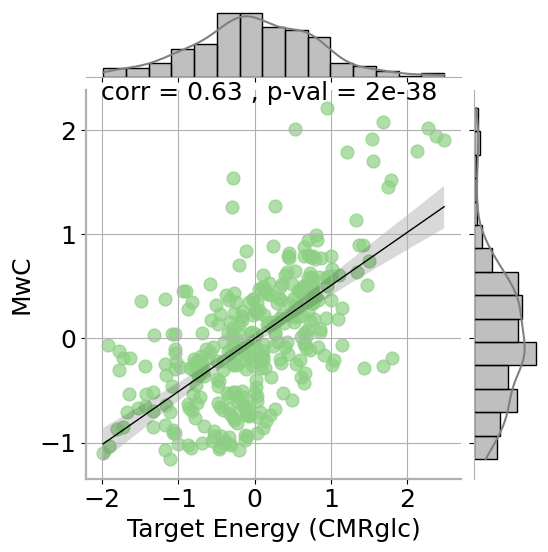

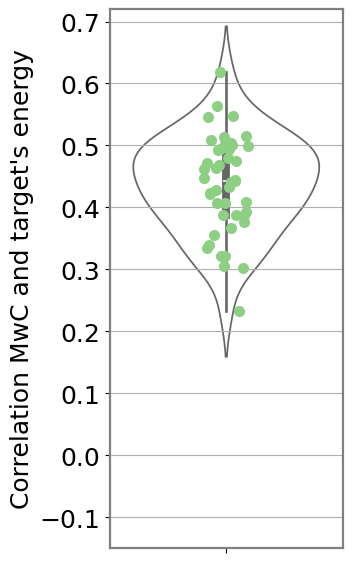

In [67]:
#--------------------------------------------------------------------------------------------
#------------------ read all sessions data   -------------------------------
#-------------------------------------------------------------------------------------------

session = 'AUF'
file_path = f'/RAID1/jupytertmp/mi/data/matrices_data_{session}_{LIMB}_limbic.pkl'
data_avg_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_wSC_{session}_{LIMB}_limb.csv'
data_sub_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_wSC_{session}_{LIMB}_limb.pkl'

data_avg_pr_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_wSC_pr_{session}_{LIMB}_limb.csv'
data_sub_pr_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_wSC_pr_{session}_{LIMB}_limb.pkl'


with open(file_path, 'rb') as file:
    data_input_auf = pickle.load(file)
    
DATA_avg_auf =   pd.read_csv(data_avg_path)
with open(data_sub_path, 'rb') as file:
    data_single_sub_auf = pickle.load(file)

DATA_avg_pr_auf =   pd.read_csv(data_avg_pr_path)
with open(data_sub_pr_path, 'rb') as file:
    data_single_sub_pr_auf = pickle.load(file)



session = 'ZU'
file_path = f'/RAID1/jupytertmp/mi/data/matrices_data_{session}_{LIMB}_limbic.pkl'
data_avg_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_wSC_{session}_{LIMB}_limb.csv'
data_sub_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_wSC_{session}_{LIMB}_limb.pkl'

data_avg_pr_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_wSC_pr_{session}_{LIMB}_limb.csv'
data_sub_pr_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_wSC_pr_{session}_{LIMB}_limb.pkl'

with open(file_path, 'rb') as file:
    data_input_zu = pickle.load(file)
    
DATA_avg_zu =   pd.read_csv(data_avg_path)
with open(data_sub_path, 'rb') as file:
    data_single_sub_zu = pickle.load(file)

DATA_avg_pr_zu =   pd.read_csv(data_avg_pr_path)
with open(data_sub_pr_path, 'rb') as file:
    data_single_sub_pr_zu = pickle.load(file)




session = 'm1'
file_path = f'/RAID1/jupytertmp/mi/data/matrices_data_{session}_{LIMB}_limbic.pkl'
data_avg_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_woSC_{session}_{LIMB}_limb.csv'
data_sub_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_woSC_{session}_{LIMB}_limb.pkl'

data_avg_pr_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_woSC_pr_{session}_{LIMB}_limb.csv'
data_sub_pr_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_woSC_pr_{session}_{LIMB}_limb.pkl'

with open(file_path, 'rb') as file:
    data_input_m1 = pickle.load(file)
    
DATA_avg_m1 =   pd.read_csv(data_avg_path)
with open(data_sub_path, 'rb') as file:
    data_single_sub_m1 = pickle.load(file)

DATA_avg_pr_m1 =   pd.read_csv(data_avg_pr_path)
with open(data_sub_pr_path, 'rb') as file:
    data_single_sub_pr_m1 = pickle.load(file)



session = 'm2'
file_path = f'/RAID1/jupytertmp/mi/data/matrices_data_{session}_{LIMB}_limbic.pkl'
data_avg_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_woSC_{session}_{LIMB}_limb.csv'
data_sub_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_woSC_{session}_{LIMB}_limb.pkl'

data_avg_pr_path = f'/RAID1/jupytertmp/mi/data/DATA_avg_woSC_pr_{session}_{LIMB}_limb.csv'
data_sub_pr_path = f'/RAID1/jupytertmp/mi/data/data_single_sub_woSC_pr_{session}_{LIMB}_limb.pkl'

with open(file_path, 'rb') as file:
    data_input_m2 = pickle.load(file)
    
DATA_avg_m2 =   pd.read_csv(data_avg_path)
with open(data_sub_path, 'rb') as file:
    data_single_sub_m2 = pickle.load(file)

DATA_avg_pr_m2 =   pd.read_csv(data_avg_pr_path)
with open(data_sub_pr_path, 'rb') as file:
    data_single_sub_pr_m2 = pickle.load(file)



#--------------------------------------------------------------------------------------------
#------------------ concatenated all sessions data   -------------------------------
#-------------------------------------------------------------------------------------------


df1 = zscore(data_single_sub_auf['ICallsub_w'], nan_policy='omit')
df2 = zscore(data_single_sub_zu['ICallsub_w'], nan_policy='omit')
df3 = zscore(data_single_sub_m1['ICallsub_w'], nan_policy='omit')
df4 = zscore(data_single_sub_m2['ICallsub_w'], nan_policy='omit')

ICallsub_allsessions = np.hstack((df1, df2, df3, df4))
#ICallsub_allsessions = df3
ICallsub_allsessions = pd.DataFrame(ICallsub_allsessions)



df1 = zscore(data_single_sub_pr_auf['degallsub_w'], nan_policy='omit')
df2 = zscore(data_single_sub_pr_zu['degallsub_w'], nan_policy='omit')
df3 = zscore(data_single_sub_pr_m1['degallsub_w'], nan_policy='omit')
df4 = zscore(data_single_sub_pr_m2['degallsub_w'], nan_policy='omit')

degallsub_allsessions = np.hstack((df1, df2, df3, df4))
#degallsub_allsessions = df3
degallsub_allsessions = pd.DataFrame(degallsub_allsessions)


df1 = zscore(data_input_auf['edata_medianallsub'], nan_policy='omit')
df2 = zscore(data_input_zu['edata_medianallsub'], nan_policy='omit')
df3 = zscore(data_input_m1['edata_medianallsub'], nan_policy='omit')
df4 = zscore(data_input_m2['edata_medianallsub'], nan_policy='omit')

edata_allsub_allsessions = np.hstack((df1, df2, df3, df4))
#edata_allsub_allsessions = df3
edata_allsub_allsessions = pd.DataFrame(edata_allsub_allsessions)


ICallsub_allsessions_avg = np.nanmean(ICallsub_allsessions, axis = 1)
degallsub_allsessions_avg = np.nanmean(degallsub_allsessions, axis = 1)
edata_allsub_allsessions_avg = np.nanmean(edata_allsub_allsessions, axis = 1)



#--------------------------------------------------------------------------------------------
#------------------ concatenated all sessions data   -------------------------------
#-------------------------------------------------------------------------------------------

IC = ICallsub_allsessions_avg
DC = degallsub_allsessions_avg
CMRglc = edata_allsub_allsessions_avg

IC = np.array(IC).flatten()
DC = np.array(DC).flatten()
CMRglc = np.array(CMRglc).flatten()

alldata_avg = pd.DataFrame({'IC':IC, 'DC':DC, 'pet':CMRglc})

r_IC_CMRglc,p_IC_CMRglc = pcor(IC,CMRglc)  
print(r_IC_CMRglc )
r_DC_CMRglc , p_DC_CMRglc= pcor(DC,CMRglc)    
print(r_DC_CMRglc)
r_IC_DC , p_IC_DC = pcor(IC,DC)
print(r_IC_DC)



  
           
#--------------------------------------------------------------------------------------------
#------------------ steiger test ----------------------------
#--------------------------------------------------------------------------------------------

# n = 45 
# z_score, p_value = steiger_z_test(r_IC_CMRglc, r_DC_CMRglc, r_IC_DC, n)
# print("steiger:", z_score, p_value)


#--------------------------------------------------------------------------------------------
#------------------ scatter IC_avg , CMRglc_avg / group analysis ----------------------------
#--------------------------------------------------------------------------------------------
COLOR = IC_color
plt.figure(figsize=(6,4))
g = sns.jointplot(data=alldata_avg, x='pet', y='IC', kind="reg", color=COLOR,
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': 'black', 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':COLOR, 'edgecolors':COLOR}  ) 



title = "corr = {:.2f} , p-val = {:.0e}".format(float(r_IC_CMRglc), float(p_IC_CMRglc,))
    
#g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", $Pval_{smash}$ < 0.001", fontsize=FONT, va='baseline', y=0.8)
g.fig.suptitle(title, fontsize=FONT, va='baseline', y=0.8)
g.set_axis_labels('Target Energy', 'MCC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel('Target Energy (CMRglc)', fontsize = FONT)
plt.ylabel('MwC', fontsize = FONT)

ax =  g.ax_joint  
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    
plt.savefig('Figures/all_scatter_IC_CMRglc_.png', dpi=300, bbox_inches='tight')
plt.show()

#--------------------------------------------------------------------------------------------
#------------------ Box plot individual correlation between IC and E  -----------------------
#--------------------------------------------------------------------------------------------
sub_size = np.size(edata_allsub_allsessions, axis =1)
corr_IC_E_allsub = np.zeros((sub_size))
p_IC_E_allsub = np.zeros((sub_size))

for j in range(sub_size):
                                
    corr_IC_E_allsub[j], p_IC_E_allsub[j] = pcor(edata_allsub_allsessions.iloc[:,j], ICallsub_allsessions.iloc[:,j]) 


data = pd.DataFrame({'corr': corr_IC_E_allsub, 'pval': p_IC_E_allsub})
fig, ax = plt.subplots(figsize=(3, 7))
plt.grid(True)
violin = sns.violinplot(data=data, y='corr', ax=ax, color = COLOR)
violin.collections[0].set_facecolor('none')
sns.stripplot(data=data[data['pval'] < 0.05], y='corr', color=COLOR , size = 8, ax=ax)
sns.stripplot(data=data[data['pval'] >= 0.05], y='corr', color='red' , size = 8, ax=ax)
ax.set_ylabel('Correlation MwC and target\'s energy', fontsize = FONT)
ax.set_ylim([-0.15,0.72])
plt.tick_params(axis='both', which='major', labelsize= FONT)  

spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)

plt.savefig('Figures/all_box_IC_CMRglc_.png', dpi=300, bbox_inches='tight')   
plt.show()

## Fig S5-a: control analysis

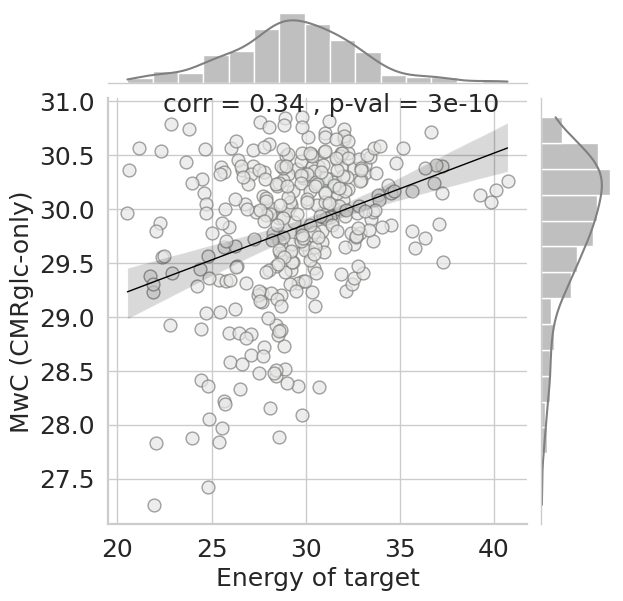

[2.98083182e-06 1.99625360e-04 2.37537610e-08 1.74998627e-03
 3.31698922e-07 6.82267989e-15 1.16268047e-03 1.87111926e-04
 5.16129915e-02 5.40287381e-05 3.12440355e-11 7.39260269e-11
 9.65987930e-08 2.37050645e-07 1.21240844e-01 8.38353345e-06
 2.39174864e-02 5.16214297e-26 4.29893105e-03]


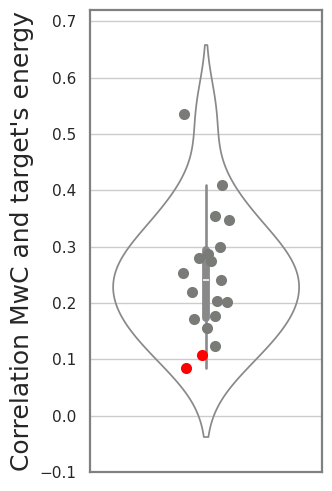

Permutation Test Results:
Observed Correlation: 0.6281059496234067
Observed p-value: 4.676835870518779e-38
Average perumuted correlation : -0.002253351830392179


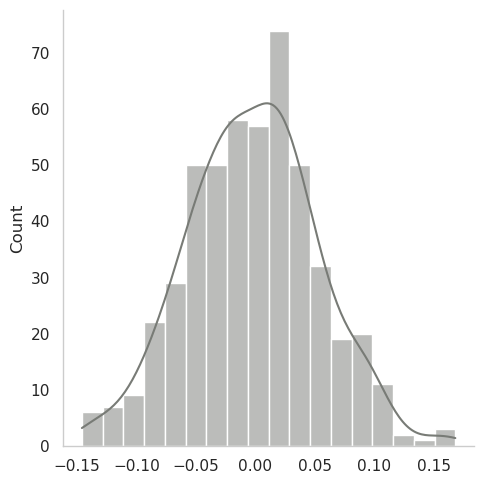


KeyboardInterrupt



In [179]:
limb_ind = np.array([88, 90, 92, 93, 110, 118, 120, 122, 131, 135, 165, 166, 172, 268, 270, 272, 273, 290, 298, 300, 302, 311, 314, 315, 346, 352])-1
LIMB = 'without'
session ="AUF"
# DIR = f'/RAID1/jupytertmp/mi/{session}'
# file_path = f'/RAID1/jupytertmp/mi/data/matrices_data_{session}_{LIMB}_limbic.pkl'

# with open(file_path, 'rb') as file:
#     data_sur1 = pickle.load(file)
 
# num_voxels = data_sur1['num_voxels']
# MIconn_allsub = data_sur1['MIconn_allsub']
# Pearconn_allsub = data_sur1['Pearconn_allsub']
# edata_medianallsub = data_sur1['edata_medianallsub']        
# edata_medianallsub_rem = edata_medianallsub

# if session == "AUF":
#     SCconn_allsub = structural_conn(DIR, sub, nrois)
# else:
#     SCconn_allsub = np.ones_like(MIconn_allsub)

# nrois_rem = nrois - len(limb_ind) 
# thr_sc = 0.1
# sub_size = MIconn_allsub.shape[2]

# if session == "AUF":
 
#     scmask = 1
# else:
#     scmask = 0
    
# MIconn_allsub[MIconn_allsub < 0.01] = 0
# thr_FC = 1
# Conn_Mat = MIconn_allsub
# #[data_avg_sur1, data_single_sub_sur1] = IC_calculation(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr_FC, sub_size, scmask, nrois_rem)
# #DATA_avg_sur1 = pd.concat([data_avg_sur1 , net_label], axis =1)

# corr_E_w_deg, p_E_w_deg = pcor(DATA_avg_sur1.pet_avg, DATA_avg_sur1.degallsub_w_avg)

# corr_E_w_deg_allsub = np.zeros((sub_size))
# p_E_w_deg_allsub = np.zeros((sub_size))
# data_single_sub_sur1 = data_single_subsur1

# for j in range(sub_size):
                             
#     corr_E_w_deg_allsub[j], p_E_w_deg_allsub[j] = pcor(data_single_sub_sur1["degallsub_w"][:, j] , edata_medianallsub_rem[:, j])
    

# #--------------------------------------------------------------------------------------------
# #-------------------  sensitivity to target degree ----------------------
# #--------------------------------------------------------------------------------------------

# g = sns.jointplot(data = DATA_avg_sur1 , x = 'pet_avg' , y ='degallsub_w_avg' , kind="reg", color="#C83D64",
#                   marginal_kws=dict(bins=15, fill=True, color='gray'), 
#                   line_kws={'color': 'black', 'lw': 1}, 
#                   scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':"#E6E6E6", 'edgecolors':"#787B76"}  ) 





# title = "corr = {:.2f} , p-val = {:.0e}".format(float(corr_E_w_deg) , float(p_E_w_deg))
# g.fig.suptitle(f"corr = {corr_IC_w_deg:.2f} , p-val = {p_IC_w_deg :.0e}", fontsize=FONT, va='baseline', y=0.8)
# plt.tick_params(axis='both', which='major', labelsize= FONT)  

# plt.xlabel('Energy of Target', fontsize = FONT)
# plt.ylabel('MCC (fMRI-only)', fontsize = FONT)
# plt.grid(True)
# ax =  g.ax_joint  
# spine_width = 1.6  
# for spine in ax.spines.values():
#     spine.set_linewidth(spine_width)
    

# plt.show()


# #------------------ Box plot individual correlation between IC and E  -----------------------

# data_box_sur1 = pd.DataFrame({'corr': corr_E_w_deg_allsub, 'pval': p_E_w_deg_allsub})
# fig, ax = plt.subplots(figsize=(3, 6))
# plt.grid(True)
# violin = sns.violinplot(data=data_box_sur1, y='corr', ax=ax, color = '#FBE5CF')
# sns.stripplot(data=data_box_sur1[data_box_sur1['pval'] < 0.05], y='corr', color='#787B76' , size = 8, ax=ax)
# sns.stripplot(data=data_box_sur1[data_box_sur1['pval'] >= 0.05], y='corr', color='red' , size = 8, ax=ax)
# violin.collections[0].set_facecolor('none')
# ax.set_ylabel('Correlation MCC and target\'s energy')
# ax.set_ylim([-0.1,0.72])
# plt.show()


#--------------------------------------------------------------------------------------------
#---- same weights for one target (keep the number of connection same as the real data)------
#--------------------------------------------------------------------------------------------

SCmat =  SCconn_allsub
thr_sc = 0.2
SCmat_th = np.zeros((SCmat.shape[0], SCmat.shape[1], sub_size))
for i in range(sub_size):
    SCmat_th[:, :, i] = threshold_proportional(SCmat[:, :, i], thr_sc)

SC_mask = SCmat_th.copy()
SC_mask[SC_mask > 0] = 1

Conn_Mat = SC_mask

# data_avg_sur2, data_single_sub_sur2 = IC_calculation(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr_FC, sub_size, scmask, nrois_rem)
# DATA_avg_sur2 = pd.concat([data_avg_sur2 , net_label], axis =1)



corr_IC_E_allsub = np.zeros((sub_size))
p_IC_E_allsub = np.zeros((sub_size))

for j in range(sub_size):
                             
    # degallsub_w_z = zscore(data_single_sub_sur2["degallsub_w"][:, j] , nan_policy='omit')
    corr_IC_E_allsub[j], p_IC_E_allsub[j] = pcor(data_single_sub_sur2["ICallsub_w"][:, j], edata_medianallsub_rem[:, j])
    # corr_deg_w_E_allsub[j], p_deg_w_E_allsub[j] = pcor(degallsub_w_z, edata_medianallsub_rem[:, j])
    # for i in range(len(net_names)):
    #     ind = net_label[net_label['yeo_7_nw'].str.contains(net_names[i])].index
    #     ind = ind.to_list()
    #     corr_IC_E_net_allsub[j, i], p_IC_E_net_allsub[j, i] = pcor(data_single_sub_sur2["ICallsub_w"][ind, j], edata_medianallsub_rem[ind, j])
    
    



organg = [255/255,164/255,0/255]
corr_IC_w_E, p_IC_w_E = pcor(DATA_avg_sur2.ICallsub_w_avg, DATA_avg_sur2.pet_avg)
corr_IC_w_deg, p_IC_w_deg = pcor(DATA_avg_sur2.ICallsub_w_avg, DATA_avg_sur2.degallsub_w_avg)





g = sns.jointplot(data = DATA_avg_sur2 , x = 'pet_avg' , y ='ICallsub_w_avg' , kind="reg", color="#C83D64",
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': 'black', 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':"#E6E6E6", 'edgecolors':"#787B76"}  ) 





title = "corr = {:.2f} , p-val = {:.0e}".format(float(corr_IC_w_E) , float(p_IC_w_E ))
g.fig.suptitle(f"corr = {corr_IC_w_E:.2f} , p-val = {p_IC_w_E :.0e}", fontsize=FONT, va='baseline', y=0.8)
plt.tick_params(axis='both', which='major', labelsize= FONT)  

plt.xlabel('Energy of target', fontsize = FONT)
plt.ylabel('MwC (CMRglc-only)', fontsize = FONT)
plt.grid(True)
ax =  g.ax_joint  
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    
plt.savefig('Figures/control_scatter_CMRglc_only.png', dpi=300, bbox_inches='tight') 
plt.show()

#------------------ Box plot individual correlation between IC and E  -----------------------
print(p_IC_E_allsub)
data = pd.DataFrame({'corr': corr_IC_E_allsub, 'pval': p_IC_E_allsub})
fig, ax = plt.subplots(figsize=(3, 6))
plt.grid(True)
violin = sns.violinplot(data=data, y='corr', ax=ax, color = '#FBE5CF')
sns.stripplot(data=data[data['pval'] < 0.05], y='corr', color='#787B76' , size = 8, ax=ax)
sns.stripplot(data=data[data['pval'] >= 0.05], y='corr', color='red' , size = 8, ax=ax)
violin.collections[0].set_facecolor('none')
ax.set_ylabel('Correlation MwC and target\'s energy', fontsize = FONT)
ax.set_ylim([-0.1,0.72])
spine_width = 1.6  
spine_color = 'gray'
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    spine.set_color(spine_color)

plt.savefig('Figures/control_box_CMRglc_only.png', dpi=300, bbox_inches='tight') 
plt.show()



#--------------------------------------------------------------------------------------------
#--------------------------- permutation test  ----------------------------------------------
#--------------------------------------------------------------------------------------------


#1. permutation on average data (IC_avg , E_avg)

observed_correlation, observed_pvalue = pcor(DATA_avg.pet_avg, DATA_avg.ICallsub_w_avg)
n_permutations = 500
permuted_correlations = np.zeros(n_permutations)

for perm_idx in range(n_permutations):
    permuted_e_avg_values = np.copy(DATA_avg.pet_avg)
    np.random.shuffle(permuted_e_avg_values)
    permuted_correlations[perm_idx], _ = pcor(DATA_avg.ICallsub_w_avg, permuted_e_avg_values)


#p_value_permutation = np.mean(np.abs(permuted_correlations) >= np.abs(observed_correlation))
corr_perm_avg = np.mean(permuted_correlations)
# Print the results
print("Permutation Test Results:")
print(f"Observed Correlation: {observed_correlation}")
print(f"Observed p-value: {observed_pvalue}")
print(f"Average perumuted correlation : {corr_perm_avg }")


sns.displot(permuted_correlations, kde=True, color='#787B76')
#sns.xlabel('Correlation IE and target\'s energy')
plt.savefig('Figures/control_RandomMatch_CMRglc_only.png', dpi=300, bbox_inches='tight') 
plt.show()




#2. permutation on individual data (IC , E)
permuted_correlations = np.zeros((n_permutations, sub_size))
for i in range(sub_size):
    
    E_sub = edata_medianallsub_rem[:,i]
    IC_sub = ICallsub_w[:,i]
    
    for perm_idx in range(n_permutations):
        
        permuted_E_values = np.copy(E_sub)
        np.random.shuffle(permuted_E_values)
        permuted_correlations[perm_idx,i], _ = pcor(IC_sub, permuted_E_values)


#sns.boxplot(permuted_correlations)
#plt.show()



#---------------------- Ridge plot of each subject histogram  -------------------------------

num_columns = permuted_correlations.shape[1]
reshaped_array = np.vstack((permuted_correlations.flatten(), np.tile(np.arange(num_columns), permuted_correlations.shape[0]))).T
df_reshaped = pd.DataFrame(reshaped_array, columns=['Correlation Value', 'Subject'])


df_filtered = df_reshaped
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':1})
palette = "Spectral"
g = sns.FacetGrid(df_filtered, palette=palette, row="Subject", hue="Subject", aspect=9, height=0.3)
g.map_dataframe(sns.kdeplot, x='Correlation Value', fill=True, alpha=0.8)
g.map_dataframe(sns.kdeplot, x='Correlation Value', color='black', linewidth= 0.7)
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, color='black', fontsize=10,
            ha="left", va="center", transform=ax.transAxes)

#g.map(label, "Subject")
g.fig.subplots_adjust(hspace=-.5)
g.set_titles("")
#g.set(yticks=[], xlabel="Correlation Value")
#g.despine( left=True)
#plt.suptitle('Netflix Originals - IMDB Scores by Language', y=0.98)
for ax in g.axes.flat:
    ax.axvline(0, color='gray', linestyle='--', linewidth=1)

g.despine(left=True)
plt.savefig('Figures/control_RandomMatch_single_CMRglc_only.png', dpi=300, bbox_inches='tight') 
plt.show()



## Fig S5-b: Sensitivity analysis

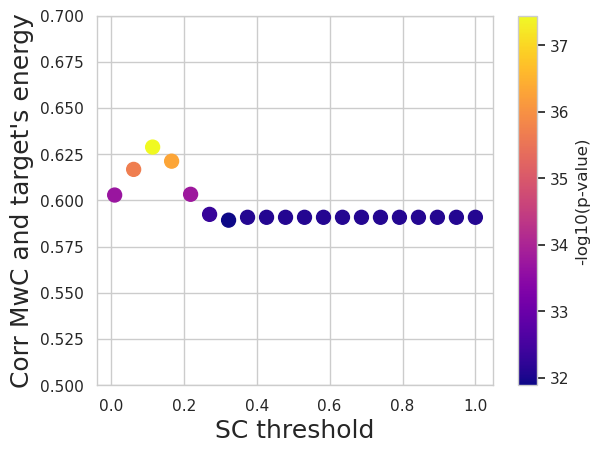

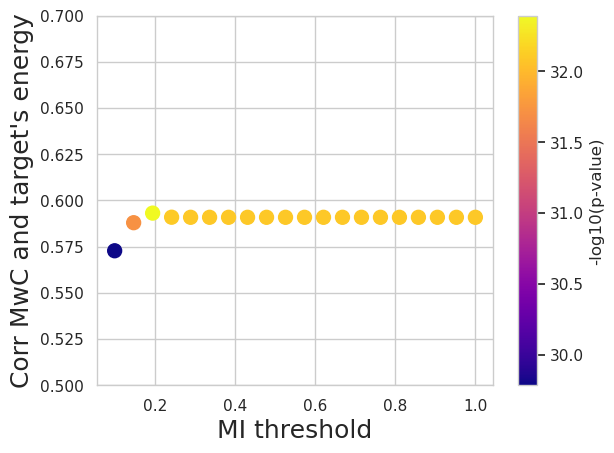

<Figure size 600x400 with 0 Axes>

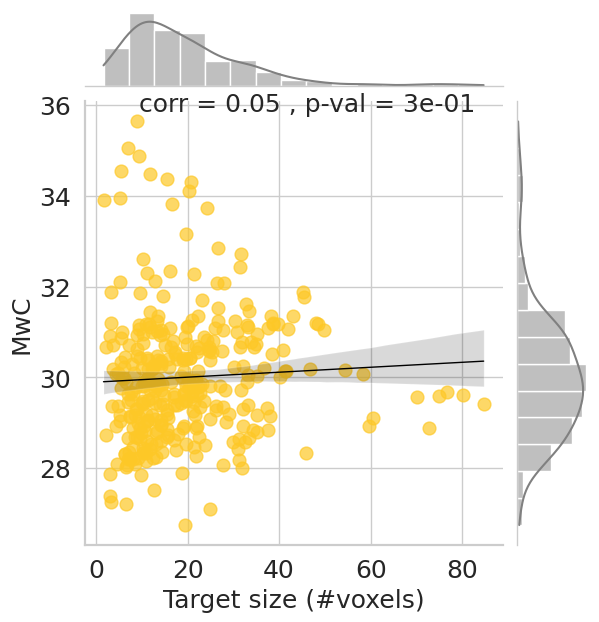

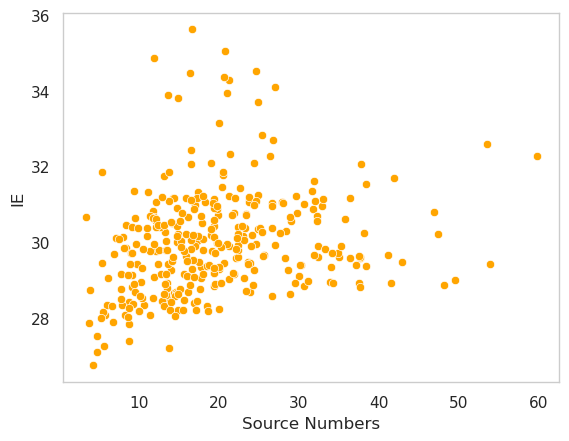

In [198]:
#--------------------------------------------------------------------------------------------
#------------------------- sensitivity to sc threshold -----------------------------------
#--------------------------------------------------------------------------------------------
plt.grid(True)
edata_medianallsub_rem = edata_medianallsub
nrois = 360
nrois_rem = nrois - len(limb_ind) 
sub_size = MIconn_allsub.shape[2]
MIconn_allsub[MIconn_allsub < 0.01]=0
Conn_Mat = MIconn_allsub
thr_FC = 1
scmask = 1
thr_sc = np.linspace(0.01,1 , 20 )

corr_scthr = np.zeros((len(thr_sc)))
p_scthr = np.zeros((len(thr_sc)))

for i , thr in enumerate(thr_sc):
    
    IC = only_IC_avg(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr, thr_FC, sub_size, scmask, nrois_rem)
    corr_scthr[i] , p_scthr[i] = pcor(IC, DATA_avg.pet_avg)


sc = plt.scatter(thr_sc, corr_scthr, s=100, c=-np.log10(p_scthr), cmap='plasma')
plt.colorbar(sc, label='-log10(p-value)')

plt.ylim([0.5,0.7])
plt.xlabel('SC threshold', fontsize = FONT)
plt.ylabel('Corr MwC and target\'s energy', fontsize = FONT)
 
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    
plt.savefig('Figures/SC_threshold.png', dpi=300, bbox_inches='tight')
plt.show()

#--------------------------------------------------------------------------------------------
#------------------------- sensitivity to fc threshold -----------------------------------
#--------------------------------------------------------------------------------------------
plt.grid(True)
edata_medianallsub_rem = edata_medianallsub
nrois = 360
nrois_rem = nrois - len(limb_ind) 
sub_size = MIconn_allsub.shape[2]
MIconn_allsub[MIconn_allsub < 0.0001]=0
Conn_Mat = MIconn_allsub
thr_sc = 1
scmask = 0
thr_fc = np.linspace(0.1,1 , 20 )

corr_fcthr = np.zeros((len(thr_fc)))
p_fcthr = np.zeros((len(thr_fc)))

for i , thr in enumerate(thr_fc):
    
    IC = only_IC_avg(Conn_Mat, edata_medianallsub_rem, SCconn_allsub, thr_sc, thr, sub_size, scmask, nrois_rem)
    corr_fcthr[i] , p_fcthr[i] = pcor(IC, DATA_avg.pet_avg)


sc = plt.scatter(thr_fc, corr_fcthr, s=100, c=-np.log10(p_fcthr), cmap='plasma')
plt.colorbar(sc, label='-log10(p-value)')

plt.ylim([0.5,0.7])
plt.xlabel('MI threshold', fontsize = FONT)
plt.ylabel('Corr MwC and target\'s energy', fontsize = FONT)
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)

plt.savefig('Figures/MI_threshold.png', dpi=300, bbox_inches='tight')
plt.show()





#--------------------------------------------------------------------------------------------
#------------------- sensitivity to region size (number of voxels) -----------------------
#--------------------------------------------------------------------------------------------
COLOR = [227/255 , 108/255, 138/255]

num_voxels_avg = np.mean(num_voxels , axis = 1)
corr_IC_w_vox, p_IC_w_vox = pcor(DATA_avg.ICallsub_w_avg, num_voxels_avg)


plt.figure(figsize=(6,4))
g = sns.jointplot(x = num_voxels_avg , y = DATA_avg.ICallsub_w_avg, kind="reg", color="#547BC9",
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': 'black', 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':"#FDC827", 'edgecolors':"#FDC827"}  ) 





title = "corr = {:.2f} , p-val = {:.0e}".format(float(corr_IC_w_vox) , float(p_IC_w_vox))
g.fig.suptitle(f"corr = {corr_IC_w_vox:.2f} , p-val = {p_IC_w_vox:.0e}", fontsize=FONT, va='baseline', y=0.8)
g.set_axis_labels('Actual Target Energy', 'MCC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  

plt.xlabel('Target size (#voxels)', fontsize = FONT)
plt.ylabel('MwC', fontsize = FONT)

ax =  g.ax_joint  
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    
plt.grid(True)
plt.savefig('Figures/Target_size.png', dpi=300, bbox_inches='tight')
plt.show()

#--------------------------------------------------------------------------------------------
#-------------------------- 3. sensitivity to source numbers --------------------------------
#--------------------------------------------------------------------------------------------


corr_IC_w_source, p_IC_w_source = pcor(DATA_avg.ICallsub_w_avg, DATA_avg.degallsub_b_avg)

#sns.lmplot(data = DATA_avg , x = 'pet_avg' , y ='ICallsu_w_avg' , hue = 'yeo_7_nw'  )
sns.scatterplot(data = DATA_avg , x = 'degallsub_b_avg' , y ='ICallsub_w_avg' , color = 'Orange') 
title = "corr = {:.2f} , p-val = {:.0e}".format(float(corr_IC_w_source) , float(p_IC_w_source))
plt.title(title , fontdict={'fontsize': 15})
plt.xlabel('Source Numbers')
plt.ylabel('IE')
plt.show()

## Fig S8:CMRglc - networks

## Fig S7: Mito vs MCC

corr mito_CII, IC: 0.06094354252366587 0.2667229195826745
corr mito_CII, IC: 0.0334574095053137 0.5423025749650585
corr mito_CIV, IC: 0.10011264280635987 0.06764575060256149
corr mito_TRC, IC: 0.10261445644411059 0.061031841661004574
corr mito_MRC, IC: 0.03342842350796592 0.5426526655630588
corr mito_MitoD, IC: 0.048035111704787276 0.3815261202910154


<Figure size 600x400 with 0 Axes>

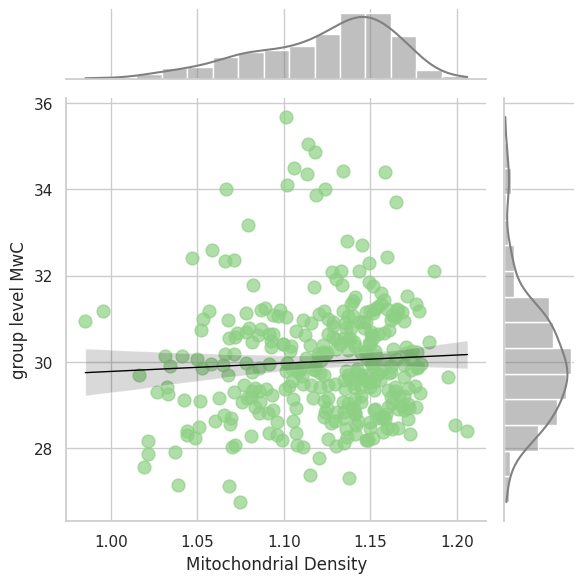

In [476]:
mito_img_CI = nib.load(f'/RAID1/jupytertmp/mi/data/CI.nii.gz')
mito_img_CII = nib.load(f'/RAID1/jupytertmp/mi/data/CII.nii.gz')
mito_img_CIV = nib.load(f'/RAID1/jupytertmp/mi/data/CIV.nii.gz')
mito_img_TRC = nib.load(f'/RAID1/jupytertmp/mi/data/TRC.nii.gz')
mito_img_MRC = nib.load(f'/RAID1/jupytertmp/mi/data/MRC.nii.gz')
mito_img_MitoD = nib.load(f'/RAID1/jupytertmp/mi/data/MitoD.nii.gz')


mito_data_CI = mito_img_CI.get_fdata()
mito_data_CII = mito_img_CII.get_fdata()
mito_data_CIV = mito_img_CIV.get_fdata()
mito_data_TRC = mito_img_TRC.get_fdata()
mito_data_MRC = mito_img_MRC.get_fdata()
mito_data_MitoD = mito_img_MitoD.get_fdata()



mmp_in_mni_6 = f'/RAID1/jupytertmp/mi/data/mmp_in_mni_6.nii.gz'
atlas_mito = nib.load(mmp_in_mni_6)
atlas_data_mito = atlas_mito.get_fdata()






region_labels_mito = np.unique(atlas_data_mito)
region_labels_mito = region_labels_mito[region_labels_mito > 0]


n_regions = len(region_labels_mito)
mito_values = {
    'CI': np.zeros(n_regions),
    'CII': np.zeros(n_regions),
    'CIV': np.zeros(n_regions),
    'TRC': np.zeros(n_regions),
    'MRC': np.zeros(n_regions),
    'MitoD': np.zeros(n_regions),
    'syn': np.zeros(n_regions),
}
for i, label in enumerate(region_labels_mito):
    region_mask = atlas_data_mito == label
    
    region_vals_CI = mito_data_CI[region_mask]
    region_vals_CII = mito_data_CII[region_mask]
    region_vals_CIV = mito_data_CIV[region_mask]
    region_vals_TRC = mito_data_TRC[region_mask]
    region_vals_MRC = mito_data_MRC[region_mask]
    region_vals_MitoD = mito_data_MitoD[region_mask]


    # Compute mean of nonzero, non-NaN voxels
    mito_values['CI'][i] = np.nanmedian(region_vals_CI[region_vals_CI != 0])
    mito_values['CII'][i] = np.nanmedian(region_vals_CII[region_vals_CII != 0])
    mito_values['CIV'][i] = np.nanmedian(region_vals_CIV[region_vals_CIV != 0])
    mito_values['TRC'][i] = np.nanmedian(region_vals_TRC[region_vals_TRC != 0])
    mito_values['MRC'][i] = np.nanmedian(region_vals_MRC[region_vals_MRC != 0])
    mito_values['MitoD'][i] = np.nanmedian(region_vals_MitoD[region_vals_MitoD != 0])



# delete limbic regions, if needed:
mito_values['CI'] = np.delete(mito_values['CI'], limb_ind , axis = 0)
mito_values['CII'] = np.delete(mito_values['CII'], limb_ind , axis = 0)
mito_values['CIV'] = np.delete(mito_values['CIV'], limb_ind , axis = 0)
mito_values['TRC'] = np.delete(mito_values['TRC'], limb_ind , axis = 0)
mito_values['MRC'] = np.delete(mito_values['MRC'], limb_ind , axis = 0)
mito_values['MitoD'] = np.delete(mito_values['MitoD'], limb_ind , axis = 0)





data = pd.DataFrame({'IC':(DATA_avg.ICallsub_w_avg), 'deg':(DATA_avg_pr.degallsub_w_avg), 'pet':(DATA_avg.pet_avg)
                    ,'mito_CI':(mito_values['CI']), 'mito_CII':(mito_values['CII']), 'mito_CIV':(mito_values['CIV']), 'mito_TRC':(mito_values['TRC'])
                    , 'mito_MRC':(mito_values['MRC']), 'mito_MitoD':(mito_values['MitoD'])})











corr_IC_CI, p_IC_CI =spearmanr(data["mito_CI"], data["IC"])
corr_IC_CII, p_IC_CII =spearmanr(data["mito_CII"], data["IC"])
corr_IC_CIV, p_IC_CIV = spearmanr(data["mito_CIV"], data["IC"])
corr_IC_TRC, p_IC_TRC = spearmanr(data["mito_TRC"], data["IC"])
corr_IC_MRC, p_IC_MRC = spearmanr(data["mito_MRC"], data["IC"])
corr_IC_MitoD, p_IC_MitoD = spearmanr(data["mito_MitoD"], data["IC"])

COLOR = IC_color
plt.figure(figsize=(6,4))
g = sns.jointplot(data=data, x='IC', y='mito_MitoD', kind="reg", color=COLOR,
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': 'black', 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':COLOR, 'edgecolors':COLOR}  ) 



title = "corr = {:.2f} , p-val = {:.0e}".format(float(corr_IC_MitoD), float(p_IC_MitoD))
    
#g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", $Pval_{smash}$ < 0.001", fontsize=FONT, va='baseline', y=0.8)
g.fig.suptitle(title, fontsize=FONT, va='baseline', y=0.8)
g.set_axis_labels('Target Energy', 'MCC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel('MwC', fontsize = FONT)
plt.ylabel('Mitochondrial Density', fontsize = FONT)

ax =  g.ax_joint  
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    

plt.show()




plt.figure(figsize=(6,4))
g = sns.jointplot(data=data, x='IC', y='mito_MRC', kind="reg", color=COLOR,
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': 'black', 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':COLOR, 'edgecolors':COLOR}  ) 



title = "corr = {:.2f} , p-val = {:.0e}".format(float(corr_IC_MRC), float(p_IC_MRC))
    
#g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", $Pval_{smash}$ < 0.001", fontsize=FONT, va='baseline', y=0.8)
g.fig.suptitle(title, fontsize=FONT, va='baseline', y=0.8)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel('MwC', fontsize = FONT)
plt.ylabel('MRC', fontsize = FONT)

ax =  g.ax_joint  
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    

plt.show()




plt.figure(figsize=(6,4))
g = sns.jointplot(data=data, x='IC', y='mito_TRC', kind="reg", color=COLOR,
                  marginal_kws=dict(bins=15, fill=True, color='gray'), 
                  line_kws={'color': 'black', 'lw': 1}, 
                  scatter_kws={'s': 85, 'alpha': 0.7, 'facecolors':COLOR, 'edgecolors':COLOR}  ) 



title = "corr = {:.2f} , p-val = {:.0e}".format(float(corr_IC_TRC), float(p_IC_TRC))
    
#g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", $Pval_{smash}$ < 0.001", fontsize=FONT, va='baseline', y=0.8)
g.fig.suptitle(title, fontsize=FONT, va='baseline', y=0.8)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel('MwC', fontsize = FONT)
plt.ylabel('TRC', fontsize = FONT)

ax =  g.ax_joint  
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    

plt.show()







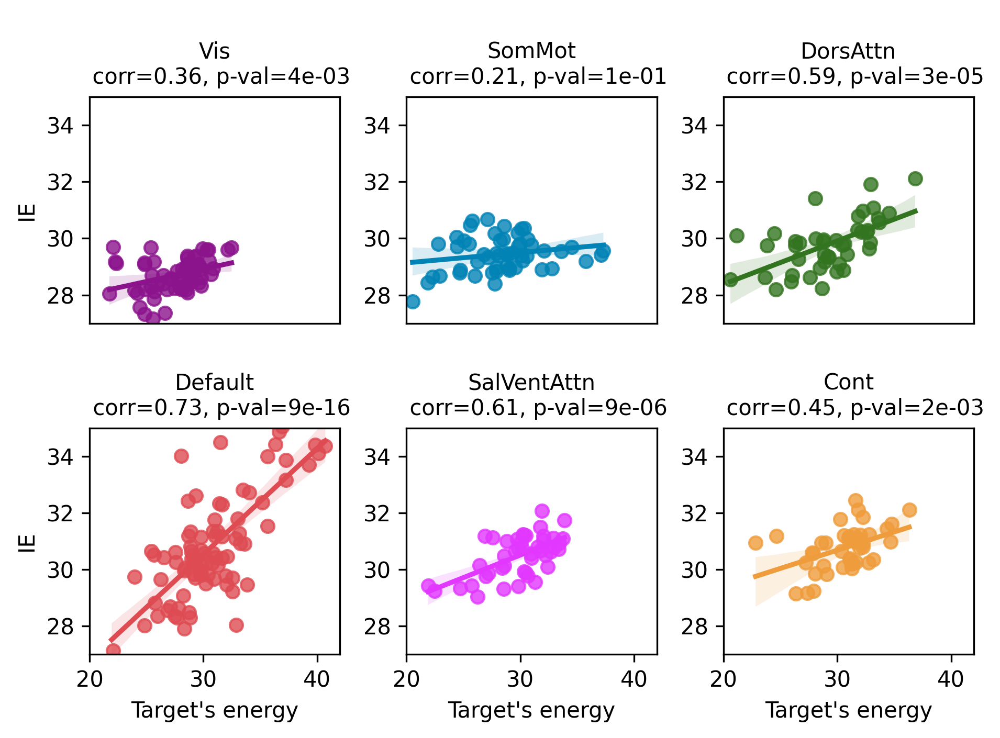

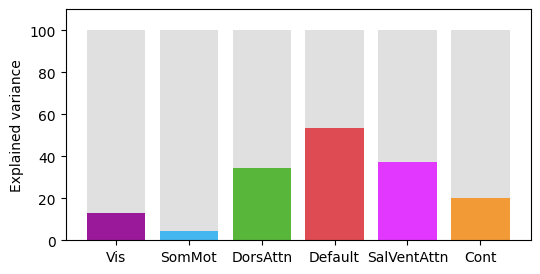

In [213]:
#--------------------------------------------------------------------------------------------
#------------------ scatter plot of IC and E for different networks -------------------------
#--------------------------------------------------------------------------------------------
 
corr_IC_E_net_avg = np.zeros((len(net_names),1))
p_IC_E_net_avg = np.zeros((len(net_names),1))

nmed = 3.5
for i in range(len(net_names)):
    
    ind = net_label[net_label['yeo_7_nw'].str.contains(net_names[i])].index
    ind = ind.to_list()
    #if net_names[i] == 'Somatomotor':

    corr_IC_E_net_avg[i], p_IC_E_net_avg[i]  = pcor(DATA_avg.ICallsub_w_avg[ind], DATA_avg.pet_avg[ind])

       # else:
            #corr_IC_E_net_avg[i], p_IC_E_net_avg[i]  = pcor(data_avg.ICallsub_w_avg[ind], data_avg.pet_avg[ind])
            #corr_IC_E_net_avg[i], p_IC_E_net_avg[i]  = clean_corr(data_avg.ICallsub_w_avg[ind], data_avg.pet_avg[ind], nmed)

##subplot of corr energy and IC for individual networks
fig, axes = plt.subplots(nrows=2, ncols=3, dpi = 300)
for i, ax in enumerate(axes.flatten()):
    plt.subplot(2, 3, i+1)
    ind = net_label[net_label['yeo_7_nw'].str.contains(net_names[i])].index
    ind = ind.tolist()
    #sns.scatterplot(x= data_avg.pet_avg.iloc[ind] ,y = data_avg.ICallsub_w_avg.iloc[ind] , color ='green')
    #sns.jointplot(x= data_avg.pet_avg.iloc[ind] ,y = data_avg.ICallsub_w_avg.iloc[ind] ,  kind="reg")
    sns.regplot(x= data_avg.pet_avg.iloc[ind] ,y = data_avg.ICallsub_w_avg.iloc[ind] , color = net_color[i])
    ax.set_ylim([27, 35])
    ax.set_xlim([20, 42])
    title = "\n{}\n  corr={:.2f}, p-val={:.0e}".format(net_names[i] , float(corr_IC_E_net_avg[i]), float(p_IC_E_net_avg[i]))
    plt.title(title , fontdict={'fontsize': 10})
    if i == 0:
        plt.ylabel('IE')
    elif i == 3:
        plt.ylabel('IE')

    else:
        plt.ylabel('')
    if i>2:
        plt.xlabel('Target\'s energy')
    else:
        plt.xlabel('')

    if i < 3:
        ax.set_xticks([])

   # plt.show()


# adjust the layout and show the figure
#fig.tight_layout()
fig.tight_layout()
#fig.subplots_adjust(hspace= 0, wspace=0)
plt.show()
#--------------------------------------------------------------------------------------------
#------------------ explained variance of E for each network  -------------------------------
#--------------------------------------------------------------------------------------------
 
var_perc = 100 * np.square(corr_IC_E_net_avg)


plt.figure(figsize=(6, 3))
bars = sns.barplot(x = net_names, y=[100] * len(net_names), color='lightgray', alpha=0.7)

for i, p in enumerate(var_perc):
    fill_height = bars.patches[i].get_height() * (p / 100.0)
    plt.bar(i, fill_height, color = network_colors[i], alpha = 1)

plt.xlabel(None)
plt.ylabel("Explained variance")
#plt.title("Percentage Filled Barplot for Networks")
plt.ylim(0, 110)  # Set the y-axis limits

plt.show()

## Fig 4C: MCC/DC vs AD maps

In [618]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# Load the dataset
df = pd.read_csv("/RAID1/jupytertmp/mi/input_data/ADNI_amyloid_tau_PET_MMP1.csv")

# Filter for Ab.pos and MCI subjects
df = df[(df['amyloid_status'] == 'Ab.pos') & (df['DX'] == 'MCI')]

# Count scans per ID
id_counts = df['ID'].value_counts()

# Filter IDs with at least two scans
ids_with_multiple_scans = id_counts[id_counts >= 2].index
print("IDs with >= 2 scans:\n", ids_with_multiple_scans)

# Filter dataframe to keep only those IDs
df_multiple_scans = df[df['ID'].isin(ids_with_multiple_scans)]

# Sort by ID and age
df_multiple_scans = df_multiple_scans.sort_values(by=['ID', 'age']).reset_index(drop=True)

# Count number of scans per subject
scan_counts_df = df_multiple_scans['ID'].value_counts().reset_index()
scan_counts_df.columns = ['ID', 'num_scans']
scan_counts_df = scan_counts_df.sort_values(by='num_scans', ascending=False).reset_index(drop=True)

print("\nScan count per subject:\n", scan_counts_df)

# -----------------------------
# Correlation between MwC and amyloid per scan
# -----------------------------

# MwC vector across ROIs (same for all subjects)
MwC_vector = DATA_avg['degallsub_w_avg'].values  # shape: (n_rois,)

# Extract SUVR ROI column names
roi_cols = [col for col in df_multiple_scans.columns if col.startswith("amyloid.SUVR.MMP1")]

# Ensure same order of ROIs
suvr_roi_names = [col.split('.')[-1] for col in roi_cols]
MwC_roi_names = DATA_avg['mmp_roi_id'].astype(str).values

# Optional check: ensure SUVR columns and MwC rows are aligned
if not all([roi.endswith(id_) or roi == id_ for roi, id_ in zip(suvr_roi_names, MwC_roi_names)]):
    print("⚠️ ROI mismatch! Make sure amyloid ROI columns and MwC rows align.")
    # You might need to align these manually based on a mapping

# Compute and print correlation per scan
print("\nPer-Scan Correlation Between MwC and Amyloid:\n")

for _, row in df_multiple_scans.iterrows():
    subject_id = row['ID']
    age = row['age']
    
    amyloid_vector = row[roi_cols].values.astype(float)  # shape: (n_rois,)
    
    corr, pval = pearsonr(MwC_vector, amyloid_vector)

    print(f"ID: {subject_id}, Age: {age}, Correlation: {corr:.3f}, P-value: {pval:.2e}")


IDs with >= 2 scans:
 Index(['sub-4489', 'sub-6258', 'sub-6702', 'sub-4674', 'sub-6480', 'sub-6503',
       'sub-4076', 'sub-4510', 'sub-2245', 'sub-4272', 'sub-6731', 'sub-2121',
       'sub-6777', 'sub-1378', 'sub-4782', 'sub-0377', 'sub-4813', 'sub-4817',
       'sub-4862', 'sub-4654', 'sub-4868'],
      dtype='object', name='ID')

Scan count per subject:
           ID  num_scans
0   sub-4489          5
1   sub-6258          3
2   sub-6702          3
3   sub-4674          3
4   sub-0377          2
5   sub-4076          2
6   sub-2245          2
7   sub-2121          2
8   sub-1378          2
9   sub-4654          2
10  sub-4782          2
11  sub-4510          2
12  sub-4272          2
13  sub-4817          2
14  sub-4813          2
15  sub-4868          2
16  sub-4862          2
17  sub-6480          2
18  sub-6503          2
19  sub-6731          2
20  sub-6777          2
⚠️ ROI mismatch! Make sure amyloid ROI columns and AWC rows align.

Per-Scan Correlation Between AWC and Amylo

75.45426356589147 7.599459464171599 83 46


76.00736842105263 7.428851892669101 41 54
(95, 360)
Correlation coefficient: 0.40258930645432095
P-value: 1.9119816825929006e-14


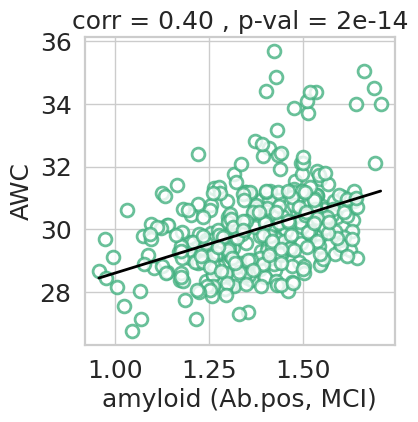

In [626]:
centrality ='MwC' # it can be DC or MCC
amyloid_status = 'Ab.pos' # it can be Ab.neg, Ab.pos
DX = 'MCI' #it can be MCI, CN, Dementia
tracer = 'amyloid' #it can be amyloid or tau

if centrality == "MwC":
    IC =  DATA_avg.ICallsub_w_avg
    
else:
    
    IC =  DATA_avg_pr.degallsub_w_avg


roi_label = pd.read_csv("/RAID1/jupytertmp/mi/input_data/hcp_mmp10_yeo7_modes.csv", delimiter = ';' )

roi_label['ROI_Name'] = roi_label['ROI_Name'].str.replace(r'^R_', 'r', regex=True) \
                                                    .str.replace(r'^L_', 'l', regex=True) \
                                                    .str.replace(r'_ROI$', '', regex=True)

roi_label['ROI_Name'] = roi_label['ROI_Name'].str.replace('-', '.', regex=False)

limb_labels = roi_label.loc[roi_label['ROI_Number'].isin(limb_ind+1), 'ROI_Name']





ad_data = pd.read_csv("/RAID1/jupytertmp/mi/input_data/ADNI_amyloid_tau_PET_MMP1.csv")
ad_data = ad_data.drop_duplicates(subset='ID', keep='first') ## keep the first occurance

mci_amyloid = ad_data[(ad_data['DX'] == DX) & (ad_data['amyloid_status'] == amyloid_status)]
demo = mci_amyloid[['age','sex']]
mean = np.mean(demo['age'])
std = np.std(demo['age'])
fem_num = len(demo[demo['sex']=='female'])
mal_num = len(demo[demo['sex']== 'male'])

print(mean, std, fem_num, mal_num)
ad_amyloid = mci_amyloid.filter(like = tracer + ".SUVR.MMP1" )

print(ad_amyloid.shape)
ad_amyloid_avg = ad_amyloid.mean(axis=0)



ad_amyloid_avg_reset = ad_amyloid_avg.reset_index()
ad_amyloid_avg_reset.columns = ['label', 'value']
ad_amyloid_avg_reset['label'] = ad_amyloid_avg_reset['label'].str.replace(r'.*\.l', 'l', regex=True).str.replace(r'.*\.r', 'r', regex=True)
ad_amyloid_avg_sorted = ad_amyloid_avg_reset.sort_values(by='label', key=lambda col: col.str.startswith('r'))
labels_to_remove = limb_labels
ad_amyloid_avg_sorted = ad_amyloid_avg_sorted[~ad_amyloid_avg_sorted['label'].isin(labels_to_remove)]
ad_amyloid_avg_sorted = ad_amyloid_avg_sorted.reset_index(drop=True)



roi = roi_label["ROI_Name"]
roi = roi.drop(limb_ind, axis = 0)
roi = roi.reset_index(drop = True)
IC_label = pd.DataFrame({"IC": IC, "label": roi})
IC_label['label'] = IC_label['label'].str.replace(r'(.*)_L$', r'l\1', regex=True).str.replace(r'(.*)_R$', r'r\1', regex=True)



ad_amyloid_avg_sorted_aligned = ad_amyloid_avg_sorted.set_index('label')
IC_label_aligned = IC_label.set_index('label')
ad_amyloid_avg_aligned = ad_amyloid_avg_sorted_aligned.reindex(IC_label_aligned.index).reset_index()

ad_IC = pd.DataFrame({
    "IC": IC_label["IC"].values,
    "Amyloid": ad_amyloid_avg_aligned["value"].values,
    "label_IC": IC_label["label"].values,
    "label_AD": ad_amyloid_avg_aligned["label"].values, 
    'Network': net_label["yeo_7_nw"]
    
})





corr_ic_ad, p_ic_ad = pcor(ad_IC['IC'], ad_IC['Amyloid'])

print("Correlation coefficient:", corr_ic_ad)
print("P-value:", p_ic_ad)





COLOR = "#8DD084"
plt.figure(figsize=(4,4))
plt.title = plt.gca().set_title
ax = sns.regplot(
    x=ad_IC['Amyloid'],
    y=ad_IC['IC'],
    scatter_kws={
        'facecolors': "#FFFFFF",
        'edgecolor': '#43B180' ,
        'linewidths': 2, 
        's': 85  
    },
    line_kws={
        'color': '#000000',  
        'lw': 2  
    },
    ci=None  # This removes the confidence interval
)

plt.title("corr = {:.2f} , p-val = {:.0e}".format(float(corr_ic_ad), float(p_ic_ad)), fontsize=FONT)
#g.fig.suptitle(f"corr = {corr_IC_w_E:.2f}"", $Pval_{smash}$ < 0.0001", fontsize=FONT, va='baseline', y=0.8)
#g.fig.suptitle(f"corr = {corr_ic_ad:.2f}, Pval ={p_ic_ad:.5f}", fontsize=FONT, va='baseline', y=0.8)
#g.set_axis_labels('Amyloid', 'MCC', fontsize=FONT)
plt.tick_params(axis='both', which='major', labelsize= FONT)  
plt.grid(True)
plt.xlabel(tracer + ' (' + amyloid_status + ', ' + DX + ')', fontsize=FONT)

plt.ylabel(centrality, fontsize = FONT)

 
spine_width = 1.6  
for spine in ax.spines.values():
    spine.set_linewidth(spine_width)
    

plt.show()






# Statistical comparison DC, MCC

## regression CMRglc = DC + MCC

In [11]:
# import numpy as np
import pandas as pd
import statsmodels.api as sm

# # Load data
DC = degallsub_allsessions_avg
MCC = ICallsub_allsessions_avg
CMRglc = edata_allsub_allsessions_avg

# Flatten arrays
MCC = np.array(MCC).flatten()
DC = np.array(DC).flatten()
CMRglc = np.array(CMRglc).flatten()

# Create dataframe
df = pd.DataFrame({"MCC": MCC, "DC": DC, "CMRglc": CMRglc})

# Model 1: CMRglc ~ MCC (Baseline model)
X1 = sm.add_constant(df["MCC"])  # Add intercept
model1 = sm.OLS(df["CMRglc"], X1).fit()

# Model 2: CMRglc ~ MCC + DC (Full model)
X2 = sm.add_constant(df[["MCC", "DC"]])  # Add intercept
model2 = sm.OLS(df["CMRglc"], X2).fit()

# Print Model Summaries
print("\n### Model 1: CMRglc ~ MCC ###")
print(model1.summary())

print("\n### Model 2: CMRglc ~ MCC + DC ###")
print(model2.summary())

# Compare R² values
r2_model1 = model1.rsquared
r2_model2 = model2.rsquared
print(f"\nR² for Model 1 (MCC only): {r2_model1:.4f}")
print(f"R² for Model 2 (MCC + DC): {r2_model2:.4f}")

# ANOVA Comparison (F-test)
anova_results = sm.stats.anova_lm(model1, model2)
anova_p_value = anova_results["Pr(>F)"][1]
print(f"\nANOVA F-test p-value: {anova_p_value:.4f}")

# Interpretation
print(anova_results)
if anova_p_value < 0.01:
    print("✅ Adding DC significantly improves the model. Both MCC and DC together explain more variance in CMRglc.")
else:
    print("❌ Adding DC does not significantly improve the model over MCC alone.")



### Model 1: CMRglc ~ MCC ###
                            OLS Regression Results                            
Dep. Variable:                 CMRglc   R-squared:                       0.399
Model:                            OLS   Adj. R-squared:                  0.397
Method:                 Least Squares   F-statistic:                     220.2
Date:                Wed, 12 Mar 2025   Prob (F-statistic):           1.44e-38
Time:                        10:22:09   Log-Likelihood:                -312.71
No. Observations:                 334   AIC:                             629.4
Df Residuals:                     332   BIC:                             637.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0008

## test DC vs MCC

In [468]:
sub_size = np.size(edata_allsub_allsessions, axis =1)
corr_IC_E_allsub = np.zeros((sub_size))
p_IC_E_allsub = np.zeros((sub_size))

for j in range(sub_size):
                                
    corr_IC_E_allsub[j], p_IC_E_allsub[j] = pcor(edata_allsub_allsessions.iloc[:,j], ICallsub_allsessions.iloc[:,j]) 


print(p_IC_E_allsub.min(), p_IC_E_allsub.max())

2.469309624482842e-36 1.8551628693933833e-05


0.631489830265108
0.17297850862448916
-0.052210972195235246


AttributeError: 'Normalize' object has no attribute 'cdf'